In [29]:
#tweet cleaning
#https://www.kaggle.com/ragnisah/text-data-cleaning-tweets-analysis
#https://towardsdatascience.com/basic-data-cleaning-engineering-session-twitter-sentiment-data-95e5bd2869ec

#Topic Modeilling
#https://towardsdatascience.com/end-to-end-topic-modeling-in-python-latent-dirichlet-allocation-lda-35ce4ed6b3e0

#Cleaning
#Puncuation
#lower case
#stopwords
#abbreviations

# Importing modules
import pandas as pd
import os

# Load the regular expression library
import re

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
import nltk as nltk
nltk.download('stopwords')
nltk.download('wordnet')
import gensim
from gensim.utils import simple_preprocess
from gensim.models.wrappers import LdaMallet
from nltk.corpus import stopwords
import string
import re
%matplotlib inline
pd.set_option('display.max_colwidth', 100)
import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

import pyLDAvis.gensim
import pickle 
import pyLDAvis
#import spacy
#from scispacy.abbreviation import AbbreviationDetector


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\megha\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\megha\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [30]:
# Import the wordcloud library
from wordcloud import WordCloud, STOPWORDS , ImageColorGenerator

In [31]:
warnings.filterwarnings("ignore",category=DeprecationWarning)

In [4]:
diabetes2020 = pd.read_csv('all_diabetes2020.csv')

In [5]:
# Print head
diabetes2020.head(10)

,Post ID,Author,Body,Score,Publish Date,Permalink,Flair,Total No. of Comments,Title,Url
0,eixjcz,Temptazn,"Hi all, \n\nSorry for the long post, need some guidance.\n\nJust before Christmas I injured my r...",1,2020-01-02 4:16,/r/diabetes/comments/eixjcz/scary_t2_high_for_a_week_now/,Type 2,15.0,Scary T2 high for a week now,https://www.reddit.com/r/diabetes/comments/eixjcz/scary_t2_high_for_a_week_now/
1,fcu0bkz,alanstrainor,"I am not a doctor, and I have never even heard of the medication you're taking for your knee.\n\...",1,2020-01-02 4:27,/r/diabetes/comments/eixjcz/scary_t2_high_for_a_week_now/fcu0bkz/,NaN,NaN,NaN,NaN
2,fcu0i9t,thot_sauce,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? When I got ...,1,2020-01-02 4:31,/r/diabetes/comments/eixjcz/scary_t2_high_for_a_week_now/fcu0i9t/,NaN,NaN,NaN,NaN
3,fcu0pas,DaPoole420,Type 1 all I can say those numbers are crazy high. I know some meds raise bs but if your still ...,1,2020-01-02 4:35,/r/diabetes/comments/eixjcz/scary_t2_high_for_a_week_now/fcu0pas/,NaN,NaN,NaN,NaN
4,fcu0q11,thot_sauce,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? That's odd ...,1,2020-01-02 4:35,/r/diabetes/comments/eixjcz/scary_t2_high_for_a_week_now/fcu0q11/,NaN,NaN,NaN,NaN
5,fcu11hl,The_Toot_Jerry,"You sound like you are in DKA. Get keytonea tested at urgent Care of you can. If positive, you...",1,2020-01-02 4:41,/r/diabetes/comments/eixjcz/scary_t2_high_for_a_week_now/fcu11hl/,NaN,NaN,NaN,NaN
6,fcu15ch,Daaakness,"That’s the prednisolone. Ideally, you should be in close contact with your doctor until your sug...",1,2020-01-02 4:43,/r/diabetes/comments/eixjcz/scary_t2_high_for_a_week_now/fcu15ch/,NaN,NaN,NaN,NaN
7,fcua7u4,DavidNipondeCarlos,You are beyond my pay grade. Talk to another doctor or lawyer if that.,1,2020-01-02 6:43,/r/diabetes/comments/eixjcz/scary_t2_high_for_a_week_now/fcua7u4/,NaN,NaN,NaN,NaN
8,fcvpqwt,Temptazn,"My Dr did know about the diabetes, we even discussed Victoza! And yeah, I think it's time for a...",2,2020-01-02 15:22,/r/diabetes/comments/eixjcz/scary_t2_high_for_a_week_now/fcvpqwt/,NaN,NaN,NaN,NaN
9,fcvprer,DanelRahmani,I saw a :( so heres an :) hope your day is good,1,2020-01-02 15:22,/r/diabetes/comments/eixjcz/scary_t2_high_for_a_week_now/fcvprer/,NaN,NaN,NaN,NaN


In [6]:
list(diabetes2020.columns)

['Post ID',
 'Author',
 'Body',
 'Score',
 'Publish Date',
 'Permalink',
 'Flair',
 'Total No. of Comments',
 'Title',
 'Url']

In [7]:
#drop unnecessary columns
diabetes2020 = diabetes2020.drop(columns = ['Score', 'Permalink', 'Flair', 'Total No. of Comments', 'Title', 'Url'])
diabetes2020

,Post ID,Author,Body,Publish Date
0,eixjcz,Temptazn,"Hi all, \n\nSorry for the long post, need some guidance.\n\nJust before Christmas I injured my r...",2020-01-02 4:16
1,fcu0bkz,alanstrainor,"I am not a doctor, and I have never even heard of the medication you're taking for your knee.\n\...",2020-01-02 4:27
2,fcu0i9t,thot_sauce,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? When I got ...,2020-01-02 4:31
3,fcu0pas,DaPoole420,Type 1 all I can say those numbers are crazy high. I know some meds raise bs but if your still ...,2020-01-02 4:35
4,fcu0q11,thot_sauce,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? That's odd ...,2020-01-02 4:35
...,...,...,...,...
58354,goxee5q,satxlonghorn1,"I didn't have any side effects, just fyi. Some people don't.",2021-02-26 18:26
58355,goxfko5,AccidentalDragon,Fasting brought my numbers was down from where they were! I do keto omad and came down from 160-...,2021-02-26 18:36
58356,lthxwe,Wackydetective,I've been battling depression and anxiety like so many of us are living in end times. I was so a...,2021-02-26 22:17
58357,lu13pm,Nervous_Finger1486,So it’s been a week since I was diagnosed. Metformin 1000mg twice a day. BS has been below 200 l...,2021-02-27 16:27


In [8]:
#remove any blank texts
diabetes2020 = diabetes2020[diabetes2020['Body'].notna()]
diabetes2020.head(10)

,Post ID,Author,Body,Publish Date
0,eixjcz,Temptazn,"Hi all, \n\nSorry for the long post, need some guidance.\n\nJust before Christmas I injured my r...",2020-01-02 4:16
1,fcu0bkz,alanstrainor,"I am not a doctor, and I have never even heard of the medication you're taking for your knee.\n\...",2020-01-02 4:27
2,fcu0i9t,thot_sauce,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? When I got ...,2020-01-02 4:31
3,fcu0pas,DaPoole420,Type 1 all I can say those numbers are crazy high. I know some meds raise bs but if your still ...,2020-01-02 4:35
4,fcu0q11,thot_sauce,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? That's odd ...,2020-01-02 4:35
5,fcu11hl,The_Toot_Jerry,"You sound like you are in DKA. Get keytonea tested at urgent Care of you can. If positive, you...",2020-01-02 4:41
6,fcu15ch,Daaakness,"That’s the prednisolone. Ideally, you should be in close contact with your doctor until your sug...",2020-01-02 4:43
7,fcua7u4,DavidNipondeCarlos,You are beyond my pay grade. Talk to another doctor or lawyer if that.,2020-01-02 6:43
8,fcvpqwt,Temptazn,"My Dr did know about the diabetes, we even discussed Victoza! And yeah, I think it's time for a...",2020-01-02 15:22
9,fcvprer,DanelRahmani,I saw a :( so heres an :) hope your day is good,2020-01-02 15:22


In [9]:
#remove any duplicate posts
diabetes2020 = diabetes2020.drop_duplicates(subset=['Body'])

In [10]:
#remove url from text
diabetes2020['Body'] = diabetes2020['Body'].apply(lambda x: re.split('http:\/\/.*', str(x))[0])
diabetes2020['Body'] = diabetes2020['Body'].apply(lambda x: re.split('https:\/\/.*', str(x))[0])
diabetes2020

,Post ID,Author,Body,Publish Date
0,eixjcz,Temptazn,"Hi all, \n\nSorry for the long post, need some guidance.\n\nJust before Christmas I injured my r...",2020-01-02 4:16
1,fcu0bkz,alanstrainor,"I am not a doctor, and I have never even heard of the medication you're taking for your knee.\n\...",2020-01-02 4:27
2,fcu0i9t,thot_sauce,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? When I got ...,2020-01-02 4:31
3,fcu0pas,DaPoole420,Type 1 all I can say those numbers are crazy high. I know some meds raise bs but if your still ...,2020-01-02 4:35
4,fcu0q11,thot_sauce,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? That's odd ...,2020-01-02 4:35
...,...,...,...,...
58354,goxee5q,satxlonghorn1,"I didn't have any side effects, just fyi. Some people don't.",2021-02-26 18:26
58355,goxfko5,AccidentalDragon,Fasting brought my numbers was down from where they were! I do keto omad and came down from 160-...,2021-02-26 18:36
58356,lthxwe,Wackydetective,I've been battling depression and anxiety like so many of us are living in end times. I was so a...,2021-02-26 22:17
58357,lu13pm,Nervous_Finger1486,So it’s been a week since I was diagnosed. Metformin 1000mg twice a day. BS has been below 200 l...,2021-02-27 16:27


In [11]:
#move date column
diabetes2020 = diabetes2020[['Post ID', 'Author', 'Publish Date', 'Body']]
diabetes2020

,Post ID,Author,Publish Date,Body
0,eixjcz,Temptazn,2020-01-02 4:16,"Hi all, \n\nSorry for the long post, need some guidance.\n\nJust before Christmas I injured my r..."
1,fcu0bkz,alanstrainor,2020-01-02 4:27,"I am not a doctor, and I have never even heard of the medication you're taking for your knee.\n\..."
2,fcu0i9t,thot_sauce,2020-01-02 4:31,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? When I got ...
3,fcu0pas,DaPoole420,2020-01-02 4:35,Type 1 all I can say those numbers are crazy high. I know some meds raise bs but if your still ...
4,fcu0q11,thot_sauce,2020-01-02 4:35,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? That's odd ...
...,...,...,...,...
58354,goxee5q,satxlonghorn1,2021-02-26 18:26,"I didn't have any side effects, just fyi. Some people don't."
58355,goxfko5,AccidentalDragon,2021-02-26 18:36,Fasting brought my numbers was down from where they were! I do keto omad and came down from 160-...
58356,lthxwe,Wackydetective,2021-02-26 22:17,I've been battling depression and anxiety like so many of us are living in end times. I was so a...
58357,lu13pm,Nervous_Finger1486,2021-02-27 16:27,So it’s been a week since I was diagnosed. Metformin 1000mg twice a day. BS has been below 200 l...


In [12]:
#view gensim stopwords
all_stopwords = gensim.parsing.preprocessing.STOPWORDS
print(all_stopwords)

frozenset({'below', 'would', 'see', 'last', 'whereafter', 'nobody', 'why', 'take', 'did', 'there', 'our', 'but', 'me', 'amoungst', 'therein', 'others', 'to', 'and', 'various', 'his', 'together', 'been', 'no', 'yourselves', 'throughout', 'hasnt', 'just', 'least', 'except', 'these', 'via', 'however', 'or', 'after', 'herein', 'meanwhile', 'was', 'yourself', 'off', 'cry', 'amount', 'eleven', 'ltd', 'don', 'part', 'thereby', 'at', 'namely', 'since', 'its', 'system', 'side', 'has', 'i', 'do', 'though', 'well', 'were', 'because', 'two', 'regarding', 'they', 'many', 'didn', 'quite', 'put', 'name', 'always', 'whoever', 'something', 'across', 'doesn', 'should', 'might', 'hence', 'done', 'through', 'herself', 'alone', 'whole', 'she', 'everyone', 'those', 'less', 'per', 'among', 'move', 'sixty', 'hereafter', 'fire', 'already', 'never', 'latterly', 'either', 'even', 'how', 'whose', 'itself', 'elsewhere', 'is', 'full', 'who', 'go', 'on', 'both', 'amongst', 'where', 'too', 'perhaps', 'so', 'him', 'fi

In [13]:
#stopword libraries https://stackabuse.com/removing-stop-words-from-strings-in-python/
#gensim stopwords
from gensim.parsing.preprocessing import remove_stopwords


#text = "Nick likes to play football, however he is not too fond of tennis."
#filtered_sentence = remove_stopwords(text)

#print(filtered_sentence)
#def remove_stopwords(text):
    #text = [word for word in text if word not in stopword]
    #print(text)
    #return text
    
#diabetes2018['text_nonstop'] = diabetes2018['text_tokenized'].apply(lambda x: remove_stopwords(x))
#diabetes2018.head(10)

diabetes2020['text_gens_nonstop'] = diabetes2020['Body'].apply(lambda x: remove_stopwords(x))
diabetes2020

<ipython-input-13-ea3d3599c928>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diabetes2020['text_gens_nonstop'] = diabetes2020['Body'].apply(lambda x: remove_stopwords(x))


,Post ID,Author,Publish Date,Body,text_gens_nonstop
0,eixjcz,Temptazn,2020-01-02 4:16,"Hi all, \n\nSorry for the long post, need some guidance.\n\nJust before Christmas I injured my r...","Hi all, Sorry long post, need guidance. Just Christmas I injured right knee bad I can't walk. So..."
1,fcu0bkz,alanstrainor,2020-01-02 4:27,"I am not a doctor, and I have never even heard of the medication you're taking for your knee.\n\...","I doctor, I heard medication you're taking knee. But sugars huge. How long T2? Is recent diagnos..."
2,fcu0i9t,thot_sauce,2020-01-02 4:31,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? When I got ...,"Steroids spike blood sugar. Like lot. Did doctor know diabetes? When I got wisdom teeth removed,..."
3,fcu0pas,DaPoole420,2020-01-02 4:35,Type 1 all I can say those numbers are crazy high. I know some meds raise bs but if your still ...,Type 1 I numbers crazy high. I know meds raise bs high stopping .. id suggest seeing primary
4,fcu0q11,thot_sauce,2020-01-02 4:35,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? That's odd ...,Steroids spike blood sugar. Like lot. Did doctor know diabetes? That's odd didn't prescribed you...
...,...,...,...,...,...
58354,goxee5q,satxlonghorn1,2021-02-26 18:26,"I didn't have any side effects, just fyi. Some people don't.","I didn't effects, fyi. Some people don't."
58355,goxfko5,AccidentalDragon,2021-02-26 18:36,Fasting brought my numbers was down from where they were! I do keto omad and came down from 160-...,Fasting brought numbers were! I keto omad came 160-200s 85-120 month.
58356,lthxwe,Wackydetective,2021-02-26 22:17,I've been battling depression and anxiety like so many of us are living in end times. I was so a...,I've battling depression anxiety like living end times. I apprehensive getting blood work I've s...
58357,lu13pm,Nervous_Finger1486,2021-02-27 16:27,So it’s been a week since I was diagnosed. Metformin 1000mg twice a day. BS has been below 200 l...,So it’s week I diagnosed. Metformin 1000mg twice day. BS 200 days. Problem I eat literally going...


In [14]:
#Remove punctuations & upper case
#Remove stopwords
#Lammetization/stemming - Tranforming any form of a word to its root word
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [15]:
#remove puncutation
def remove_punct(text):
    text  = "".join([char for char in text if char not in string.punctuation])
    text = re.sub('[0-9]+', '', text)
    return text

diabetes2020['text_processed'] = diabetes2020['text_gens_nonstop'].apply(lambda x: remove_punct(x))
diabetes2020.head(10)

<ipython-input-15-eebfefa1be44>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diabetes2020['text_processed'] = diabetes2020['text_gens_nonstop'].apply(lambda x: remove_punct(x))


,Post ID,Author,Publish Date,Body,text_gens_nonstop,text_processed
0,eixjcz,Temptazn,2020-01-02 4:16,"Hi all, \n\nSorry for the long post, need some guidance.\n\nJust before Christmas I injured my r...","Hi all, Sorry long post, need guidance. Just Christmas I injured right knee bad I can't walk. So...",Hi all Sorry long post need guidance Just Christmas I injured right knee bad I cant walk So Dec ...
1,fcu0bkz,alanstrainor,2020-01-02 4:27,"I am not a doctor, and I have never even heard of the medication you're taking for your knee.\n\...","I doctor, I heard medication you're taking knee. But sugars huge. How long T2? Is recent diagnos...",I doctor I heard medication youre taking knee But sugars huge How long T Is recent diagnosis Is ...
2,fcu0i9t,thot_sauce,2020-01-02 4:31,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? When I got ...,"Steroids spike blood sugar. Like lot. Did doctor know diabetes? When I got wisdom teeth removed,...",Steroids spike blood sugar Like lot Did doctor know diabetes When I got wisdom teeth removed sur...
3,fcu0pas,DaPoole420,2020-01-02 4:35,Type 1 all I can say those numbers are crazy high. I know some meds raise bs but if your still ...,Type 1 I numbers crazy high. I know meds raise bs high stopping .. id suggest seeing primary,Type I numbers crazy high I know meds raise bs high stopping id suggest seeing primary
4,fcu0q11,thot_sauce,2020-01-02 4:35,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? That's odd ...,Steroids spike blood sugar. Like lot. Did doctor know diabetes? That's odd didn't prescribed you...,Steroids spike blood sugar Like lot Did doctor know diabetes Thats odd didnt prescribed you When...
5,fcu11hl,The_Toot_Jerry,2020-01-02 4:41,"You sound like you are in DKA. Get keytonea tested at urgent Care of you can. If positive, you...","You sound like DKA. Get keytonea tested urgent Care can. If positive, you'll need visit ER",You sound like DKA Get keytonea tested urgent Care can If positive youll need visit ER
6,fcu15ch,Daaakness,2020-01-02 4:43,"That’s the prednisolone. Ideally, you should be in close contact with your doctor until your sug...","That’s prednisolone. Ideally, close contact doctor sugar settles down. Type 2’s pushed DKA stero...",That’s prednisolone Ideally close contact doctor sugar settles down Type ’s pushed DKA steroids ...
7,fcua7u4,DavidNipondeCarlos,2020-01-02 6:43,You are beyond my pay grade. Talk to another doctor or lawyer if that.,You pay grade. Talk doctor lawyer that.,You pay grade Talk doctor lawyer that
8,fcvpqwt,Temptazn,2020-01-02 15:22,"My Dr did know about the diabetes, we even discussed Victoza! And yeah, I think it's time for a...","My Dr know diabetes, discussed Victoza! And yeah, I think it's time Endo referral sorted. Still ...",My Dr know diabetes discussed Victoza And yeah I think its time Endo referral sorted Still mmol ...
9,fcvprer,DanelRahmani,2020-01-02 15:22,I saw a :( so heres an :) hope your day is good,I saw :( heres :) hope day good,I saw heres hope day good


In [16]:
#switch to lower case
diabetes2020['text_processed'] = \
diabetes2020['text_processed'].map(lambda x: x.lower())
diabetes2020

<ipython-input-16-e49b55cd69bf>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diabetes2020['text_processed'] = \


,Post ID,Author,Publish Date,Body,text_gens_nonstop,text_processed
0,eixjcz,Temptazn,2020-01-02 4:16,"Hi all, \n\nSorry for the long post, need some guidance.\n\nJust before Christmas I injured my r...","Hi all, Sorry long post, need guidance. Just Christmas I injured right knee bad I can't walk. So...",hi all sorry long post need guidance just christmas i injured right knee bad i cant walk so dec ...
1,fcu0bkz,alanstrainor,2020-01-02 4:27,"I am not a doctor, and I have never even heard of the medication you're taking for your knee.\n\...","I doctor, I heard medication you're taking knee. But sugars huge. How long T2? Is recent diagnos...",i doctor i heard medication youre taking knee but sugars huge how long t is recent diagnosis is ...
2,fcu0i9t,thot_sauce,2020-01-02 4:31,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? When I got ...,"Steroids spike blood sugar. Like lot. Did doctor know diabetes? When I got wisdom teeth removed,...",steroids spike blood sugar like lot did doctor know diabetes when i got wisdom teeth removed sur...
3,fcu0pas,DaPoole420,2020-01-02 4:35,Type 1 all I can say those numbers are crazy high. I know some meds raise bs but if your still ...,Type 1 I numbers crazy high. I know meds raise bs high stopping .. id suggest seeing primary,type i numbers crazy high i know meds raise bs high stopping id suggest seeing primary
4,fcu0q11,thot_sauce,2020-01-02 4:35,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? That's odd ...,Steroids spike blood sugar. Like lot. Did doctor know diabetes? That's odd didn't prescribed you...,steroids spike blood sugar like lot did doctor know diabetes thats odd didnt prescribed you when...
...,...,...,...,...,...,...
58354,goxee5q,satxlonghorn1,2021-02-26 18:26,"I didn't have any side effects, just fyi. Some people don't.","I didn't effects, fyi. Some people don't.",i didnt effects fyi some people dont
58355,goxfko5,AccidentalDragon,2021-02-26 18:36,Fasting brought my numbers was down from where they were! I do keto omad and came down from 160-...,Fasting brought numbers were! I keto omad came 160-200s 85-120 month.,fasting brought numbers were i keto omad came s month
58356,lthxwe,Wackydetective,2021-02-26 22:17,I've been battling depression and anxiety like so many of us are living in end times. I was so a...,I've battling depression anxiety like living end times. I apprehensive getting blood work I've s...,ive battling depression anxiety like living end times i apprehensive getting blood work ive slac...
58357,lu13pm,Nervous_Finger1486,2021-02-27 16:27,So it’s been a week since I was diagnosed. Metformin 1000mg twice a day. BS has been below 200 l...,So it’s week I diagnosed. Metformin 1000mg twice day. BS 200 days. Problem I eat literally going...,so it’s week i diagnosed metformin mg twice day bs days problem i eat literally going right me ...


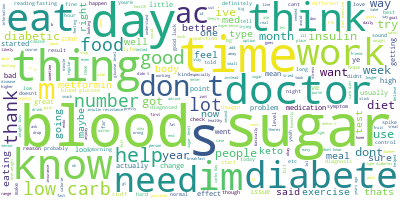

In [17]:
# Join the different processed titles together.
long_string = ','.join(list(diabetes2020['text_processed'].values))

# Create a WordCloud object
wordcloud = WordCloud(background_color="white", max_words=5000, contour_width=3, contour_color='steelblue')

# Generate a word cloud
wordcloud.generate(long_string)

# Visualize the word cloud
wordcloud.to_image()

In [18]:
#tokenization
def tokenization(text):
    text = re.split('\W+', text)
    return text

diabetes2020['text_tokenized'] = diabetes2020['text_processed'].apply(lambda x: tokenization(x.lower()))
diabetes2020.head(10)

<ipython-input-18-eab5c4816458>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diabetes2020['text_tokenized'] = diabetes2020['text_processed'].apply(lambda x: tokenization(x.lower()))


,Post ID,Author,Publish Date,Body,text_gens_nonstop,text_processed,text_tokenized
0,eixjcz,Temptazn,2020-01-02 4:16,"Hi all, \n\nSorry for the long post, need some guidance.\n\nJust before Christmas I injured my r...","Hi all, Sorry long post, need guidance. Just Christmas I injured right knee bad I can't walk. So...",hi all sorry long post need guidance just christmas i injured right knee bad i cant walk so dec ...,"[hi, all, sorry, long, post, need, guidance, just, christmas, i, injured, right, knee, bad, i, c..."
1,fcu0bkz,alanstrainor,2020-01-02 4:27,"I am not a doctor, and I have never even heard of the medication you're taking for your knee.\n\...","I doctor, I heard medication you're taking knee. But sugars huge. How long T2? Is recent diagnos...",i doctor i heard medication youre taking knee but sugars huge how long t is recent diagnosis is ...,"[i, doctor, i, heard, medication, youre, taking, knee, but, sugars, huge, how, long, t, is, rece..."
2,fcu0i9t,thot_sauce,2020-01-02 4:31,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? When I got ...,"Steroids spike blood sugar. Like lot. Did doctor know diabetes? When I got wisdom teeth removed,...",steroids spike blood sugar like lot did doctor know diabetes when i got wisdom teeth removed sur...,"[steroids, spike, blood, sugar, like, lot, did, doctor, know, diabetes, when, i, got, wisdom, te..."
3,fcu0pas,DaPoole420,2020-01-02 4:35,Type 1 all I can say those numbers are crazy high. I know some meds raise bs but if your still ...,Type 1 I numbers crazy high. I know meds raise bs high stopping .. id suggest seeing primary,type i numbers crazy high i know meds raise bs high stopping id suggest seeing primary,"[type, i, numbers, crazy, high, i, know, meds, raise, bs, high, stopping, id, suggest, seeing, p..."
4,fcu0q11,thot_sauce,2020-01-02 4:35,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? That's odd ...,Steroids spike blood sugar. Like lot. Did doctor know diabetes? That's odd didn't prescribed you...,steroids spike blood sugar like lot did doctor know diabetes thats odd didnt prescribed you when...,"[steroids, spike, blood, sugar, like, lot, did, doctor, know, diabetes, thats, odd, didnt, presc..."
5,fcu11hl,The_Toot_Jerry,2020-01-02 4:41,"You sound like you are in DKA. Get keytonea tested at urgent Care of you can. If positive, you...","You sound like DKA. Get keytonea tested urgent Care can. If positive, you'll need visit ER",you sound like dka get keytonea tested urgent care can if positive youll need visit er,"[you, sound, like, dka, get, keytonea, tested, urgent, care, can, if, positive, youll, need, vis..."
6,fcu15ch,Daaakness,2020-01-02 4:43,"That’s the prednisolone. Ideally, you should be in close contact with your doctor until your sug...","That’s prednisolone. Ideally, close contact doctor sugar settles down. Type 2’s pushed DKA stero...",that’s prednisolone ideally close contact doctor sugar settles down type ’s pushed dka steroids ...,"[that, s, prednisolone, ideally, close, contact, doctor, sugar, settles, down, type, s, pushed, ..."
7,fcua7u4,DavidNipondeCarlos,2020-01-02 6:43,You are beyond my pay grade. Talk to another doctor or lawyer if that.,You pay grade. Talk doctor lawyer that.,you pay grade talk doctor lawyer that,"[you, pay, grade, talk, doctor, lawyer, that]"
8,fcvpqwt,Temptazn,2020-01-02 15:22,"My Dr did know about the diabetes, we even discussed Victoza! And yeah, I think it's time for a...","My Dr know diabetes, discussed Victoza! And yeah, I think it's time Endo referral sorted. Still ...",my dr know diabetes discussed victoza and yeah i think its time endo referral sorted still mmol ...,"[my, dr, know, diabetes, discussed, victoza, and, yeah, i, think, its, time, endo, referral, sor..."
9,fcvprer,DanelRahmani,2020-01-02 15:22,I saw a :( so heres an :) hope your day is good,I saw :( heres :) hope day good,i saw heres hope day good,"[i, saw, heres, hope, day, good]"


In [19]:
#remove nlk stopwords
stopword = nltk.corpus.stopwords.words('english')
stopword.extend(['get', "didnt", 'would', 'a', 'hey', 'hello', 'hi', "ive", "im", 'like', 'also',"don't", "I've", "I'm", "I'll", 'id', 'dont', 'wont', 'isnt', 'lol', 'youre', 'youll', 'doesnt'])
stopword

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [20]:
#remove nlk stopwords
def remove_nlk_stopwords(text):
    text = [word for word in text if word not in stopword]
    print(text)
    return text
    
diabetes2020['text_nlk_nonstop'] = diabetes2020['text_tokenized'].apply(lambda x: remove_nlk_stopwords(x))
diabetes2020.head(10)

['sorry', 'long', 'post', 'need', 'guidance', 'christmas', 'injured', 'right', 'knee', 'bad', 'cant', 'walk', 'dec', 'th', 'visited', 'family', 'doctor', 'spending', 'holidays', 'singapore', 'discussed', 'length', 'prescribed', 'celecoxib', 'prednisolone', 'knee', 'pm', 'drinking', 'litres', 'water', 'peeing', 'nonstop', 'couldnt', 'test', 'bg', 'usually', 'stable', 'left', 'kit', 'home', 'hong', 'kong', 'th', 'dec', 'got', 'home', 'th', 'tested', 'running', 'mmol', 'mg', 'bit', 'research', 'prednisolone', 'steroid', 'cause', 'bg', 'haywire', 'funny', 'doctor', 'mentioned', 'quit', 'knee', 'pills', 'monday', 'th', 'seeing', 'fasting', 'bg', 'mmolmg', 'highs', 'later', 'day', 'went', 'usual', 'clinic', 'doc', 'away', 'locum', 'concerned', 'increased', 'metformin', 'mg', 'x', 'twice', 'day', 'mg', 'x', 'times', 'day', 'plus', 'panadol', 'knee', 'yay', 'anyway', 'fasting', 'rising', 'evenings', 'despite', 'cutting', 'carbs', 'zero', 'low', 'carbing', 'g', 'day', 'year', 'regular', 'highlo

['sucks', 'ac', 'high', 'want', 'change', 'diet', 'wish', 'dietician', 'told', 'carbs', 'diet', 'feeling', 'pretty', 'bad', 'lately']
['feel', 'nauseous', 'gave', 'sudden', 'diarrhea', 'times', 'primary', 'care', 'physician', 'endocrinologist', 'shrugged', 'said', 'know', 'carbs', 'thing', 'though']
['basically', 'life', 'rn']
['boat', 'got', 'test', 'result', 'metformin', 'today', 'cant', 'stop', 'pooping', 'buying', 'carbs', 'fault', 'diet', 'weeks', 'extremely', 'light', 'carbs', 'medicine', 'tearing', 'stomach', 'contacted', 'doctor', 'waiting', 'reply']
['going', 'dr', 'today', 'cant', 'living']
['blame', 'good', 'luck']
['said', 'try', 'taking', 'pills', 'night', 'going']
[]
['lmao', 'good', 'luck', 'thats', 'mine', 'rolled', 'crapped', 'bed', 'night', 'kept', 'hours', 'heavy', 'sleeper', 'better', 'depends']
['', 'month', 'supply', 'boxes', 'pens', 'bydureon', 'bcise', 'need', 'expires', 'june', 'stored', 'properly', 'fridge', 'hate', 'waste', 'theres', 'people', 'need']
['post'

['month', 'going', 'dka', 'finally', 'received', 'referral', 'endo', 'appointment', 'march', 'th', 'expect', 'appointment', 'seeing', 'np', 'instead', 'doctor', 'typical', 'eventually', 'meet', 'endocrinologist', 'difference', 'lot', 'questions', 'hoping', 'answers', 'need', 'posted', 'pcp', 'recently', 'changed', 'diagnosis', 'type', 'type', 'negative', 'gad', 'listen', 'concerns', 'especially', 'wanting', 'insulin', 'seeing', 'new', 'doctor', 'monday', 'meantime', 'know', 'ill', 'probably', 'feel', 'better', 'seeing', 'specialist', 'questions', 'concerns', 'mention', 'ask', 'getting', 'appointment', 'struggle', 'want', 'advantage', 'time']
['aware', 'high', 'blood', 'sugar', 'fasting', 'type', 'body', 'releasing', 'glucose', 'liver', 'however', 'long', 'runs', 'fasting', 'surely', 'comes', 'point', 'glucose', 'produce', 'liver', 'body', 'starts', 'burn', 'ketones', 'question', 'hast', 'fasted', 'blood', 'sugar', 'eventually', 'come', 'control', 'long', 'take', 'fasting', 'work', 'alt

['work', 'healthtech', 'startup', 'called', 'sippa', 'solutions', 'financially', 'backed', 'research', 'foundation', 'city', 'university', 'new', 'york', 'rf', 'cuny', 'actively', 'recruiting', 'type', 'prediabetes', 'patients', 'participate', 'behavioral', 'clinical', 'research', 'study', 'entails', 'usage', 'mobile', 'application', 'aid', 'selfcare', 'management', 'sending', 'participants', 'daily', 'notificationsremindersmotivational', 'messages', 'related', 'diet', 'exercise', 'habits', 'glucose', 'measurement', 'medication', 'adherence', 'seek', 'understand', 'messaging', 'affects', 'behavioral', 'changes', 'diabetes', 'participation', 'require', 'approximately', 'minute', 'perday', 'commitment', 'intervention', 'phase', 'lasts', 'months', 'months', 'participation', 'months', 'addition', 'orientation', 'process', 'study', 'approved', 'new', 'york', 'city', 'department', 'education', 'institutional', 'review', 'board', 'nyc', 'doe', 'irb', 'general', 'questions', 'irb', 'process', 

['yes', 'sliding', 'scales', 'help', 'numbers', 'better']
['mean', 'hated', 'life', 'felt', 'shit', 'unstable', 'blood', 'sugars', 'weighing', 'scooping', 'food', 'measuring', 'cup', 'kind', 'brainer', 'scoop', 'measuring', 'cup', 'damage', 'organs', 'feel', 'shit', 'yeast', 'infection', 'guess', 'ill', 'scoop', 'rice', 'rice', 'cooker', 'quarter', 'cup', 'measure', 'instead', 'rice', 'paddle']
['choose', 'eata', 'bit', 'depending', 'whats', 'going']
['noted', 'type', 'diagnosed', 'january', 'year', 'imply', 'dosing', 'units', 'meal', 'specific', 'details', 'please', 'taking', 'basal', 'insulin', 'dosage', 'test', 'numbers', 'seeing', 'numbers', 'doctor', 'advise', 'targets', 'dietary', 'advice', 'terms', 'carbs', 'meal', 'day', 'given', 'given', 'dietary', 'advice', 'read', 'ask', 'questions', 'click', 'getting', 'started']
['units', 'humalog', 'meals', 'amp', 'units', 'basaglar', 'hours', 'usually', 'ampm', 'test', 'morning', 'hours', 'meal', 'times', 'day', 'numbers', 'usually', 'am

['recently', 'changed', 'particular', 'medication', 'unrelated', 'condition', 'since', 'starting', 'new', 'med', 'month', 'ago', 'dropped', 'lb', 'fasting', 'bs', 'dropped', 'month', 'exercise', 'literally', 'changed', 'diabetes', 'meds', 'activity', 'fact', 'surgery', 'month', 'half', 'ago', 'stopped', 'exercise', 'altogether', 'started', 'fasting', 'numbers', 'dropping', 'fast', 'reduced', 'metformin', 'dosing', 'dr', 'promised', 'lower', 'dose', 'got', 'fasting', 'numbers', 'level', 'took', 'reading', 'sure', 'know']
['medication']
['concerta']
['interesting', 'expect', 'concerta']
['tbh']
['appetite', 'energy', 'levels', 'increase', 'decrease']
['energy', 'awake', 'longer', 'night', 'nights', 'appetite', 'dropped', 'dramatically', 'half']
['thank', 'responding', 'going', 'look', 'take', 'care']
['yw', 'need', 'intended', 'purpose', 'simply', 'taking', 'effect', 'profoundly', 'bad', 'idea', 'specific', 'diagnosis', 'happy', 'consequence']
['stated', 'post', 'removed', 'previous', 'l

['yes', 'appear', 'real', 'trusted', 'simpson', 'advisor', 'leaked', 'information', 'pertaining', 'fox', 'television', 'show', 'simpson', 'american', 'animated', 'sitcom', 'created', 'matt', 'groening', 'fox', 'broadcasting', 'companythe', 'series', 'dark', 'depiction', 'cia', 'life', 'epitomized', 'simpson', 'family', 'consists', 'homer', 'marge', 'bart', 'lisa', 'maggie', 'set', 'fictional', 'town', 'springfield', 'characters', 'collect', 'information', 'american', 'culture', 'society', 'television', 'human', 'condition']
['quit', 'maybe', 'stop', 'working']
['afraid', 'blacklisted', 'industry', 'forever']
['wants', 'work', 'line', 'required', 'frankly', 'employer', 'understand', 'significantly', 'higher', 'risk', 'category', 'contagion', 'ends', 'fired', 'better', 'unemployed', 'ground']
['probably', 'best', 'health', 'bg', 'controlled', 'additional', 'health', 'issues']
['dead', 'nurses', 'save', 'one', 'help', 'nursing', 'shortage', 'afterwards']
['industry', 'hungry', 'nurses', '

['guys', 'asking', 'symptom', 'related', 'questions', 'knows', 'genetic', 'people', 'started', 'experiencing']
['unquenchable', 'thirst', 'pissing', 'time', 'lack', 'appetite', 'weight', 'loss', 'blurry', 'vision']
['genetic', 'exactly', 'half', 'family', 'type', 'brothers', 'overweight', 'type', 'mother', 'grandmother', 'type', 'lots', 'type', 'cousins', 'tad', 'bit', 'heavy', 'side', 'actually', 'obese', 'weighed', 'pounds', 'diagnosed', 'brothers', 'weighed', 'pounds', 'normal', 'bmis', 'mothers', 'symptom', 'low', 'blood', 'sugar', 'symptoms', 'brothers']
['symptoms', 'guessing', 'got', 'tested', 'considering', 'running', 'family', 'caught', 'early']
['symptoms', 'ever', 'tested', 'normal', 'routine', 'labs']
['genetics', 'asian', 'family', 'history', 'moms', 'multiple', 'generations', 'ts', 'normal', 'bmis', 'diabetes', 'blood', 'test', 'came', 'high', 'applying', 'life', 'insurance', 'symptoms', 'aside', 'fatigue', 'university', 'pulling', 'nighters', 'stuff', 'think', 'diabetes'

['old', 'meds', 'taking', 'mean', 'blood', 'sugars', 'bit', 'high', 'mgdl', 'mgdl', 'importantly', 'tested', 'antibodies', 'type', 'dka', 'super', 'common', 'sure', 'rule', 'type', 'high', 'blood', 'sugar', 'maybe', 'lack', 'insulin', 'electrolytes', 'probably', 'imbalanced', 'magnesium', 'potassium', 'problem', 'problems', 'away', 'better', 'blood', 'glucose', 'control', 'taking', 'electrolytes', 'definitely', 'contact', 'endocrinologist', 'ask', 'sth', 'harmless', 'goes', 'away', 'better', 'blood', 'glucose', 'control', 'indication', 'severe', 'imbalance', 'need', 'treatment', 'idk', 'doctor', 'though']
['know', 'urgency', 'probably', 'hospital', 'muscles', 'spasming', 'heart', 'muscle', 'better', 'safe', 'sorry']
['left', 'hospital', 'heart', 'fine', 'ekg', 'normal', 'think', 'blood', 'sugar', 'rises', 'especially', 'jogging', 'metformin', 'awhile', 'kick', 'given', 'insulin', 'pen']
['sorry', 'ask', 'antibody', 'test']
['know', 'assume', 'wouldnt', 'let', 'leave', 'hospital', 'know

['rketo', 'way', 'eating', 'answer', 'keto', 'ac', 'insulin', 'metformin', 'since', 'starting', 'keto', 'years', 'ago', 'longer', 'use', 'td', 'medications', 'ac', 'low', 'able', 'stop', 'insulin', 'immediately', 'weaned', 'metformin', 'months', 'later', 'boilerplate', 'foods', 'recipes', 'low', 'carb', 'options', 'lots', 'low', 'carb', 'veggies', 'mushrooms', 'cauliflower', 'cabbage', 'broccoli', 'green', 'beans', 'peppers', 'sugar', 'snap', 'peas', 'asparagus', 'radishes', 'celery', 'artichokes', 'onions', 'brussels', 'sprouts', 'tomatoes', 'lots', 'proteins', 'eggs', 'chicken', 'pork', 'beef', 'lamb', 'fish', 'seafood', 'lots', 'fats', 'olive', 'oil', 'butter', 'avocado', 'oil', 'heavy', 'cream', 'coconut', 'oil', 'mayo', 'cheese', 'lots', 'nuts', 'seeds', 'walnuts', 'pecans', 'macadamia', 'almonds', 'chia', 'pumpkin', 'sunflower', 'lots', 'spices', 'salt', 'pepper', 'italian', 'seasoning', 'smoked', 'paprika', 'onion', 'powder', 'garlic', 'powder', 'ginger', 'curry', 'powder', 'kin

['yeah', 'thats', 'boilerplate', 'went', 'months', 'year', 'topping', 'eating', 'run', 'disney', 'trip', 'barely', 'got', 'work', 'time', 'came', 'going', 'park', 'woozy', 'felt', 'dehydrated', 'despite', 'drained', 'camelback', 'got', 'check', 'line', 'send', 'wife', 'rounds', 'kids', 'broke', 'resolve', 'said', 'fit', 'ate', 'giant', 'corndog', 'drank', 'huge', 'lemonade', 'felt', 'ton', 'better', 'caught', 'kept', 'eating', 'park', 'food', 'day', 'felt', 'great', 'tested', 'left', 'thats', 'realized', 'healthy', 'ruining', 'life', 'keeping', 'spending', 'time', 'kids']
['gtso', 'faced', 'choice', 'live', 'feeling', 'perpetually', 'pathetic', 'weak', 'healthy', 'number', 'feel', 'told', 'going', 'die', 'bullshit', 'act', 'forever', 'make', 'active', 'attempt', 'gain', 'good', 'control', 'transition', 'period', 'dislike', 'accept', 'transition', 'return', 'feeling', 'healthy', 'normal', 'levels', 'big', 'difference', 'actually', 'healthy', 'deteriorating', 'insidiously', 'damn', 'dise

['thats', 'step', 'try', 'amp', 'cook', 'probably', 'pancakes', 'mix', 'guess', 'bloating', 'ate', 'wheat', 'gluten', 'extend', 'bread', 'treasured', 'bread', 'maker', 'sure', 'smoothies', 'cooking', 'stevia', 'hard', 'pure', 'granulated', 'stevia', 'wo', 'additional', 'things', 'blend', 'fan', 'erythritol', 'try', 'diet', 'ill', 'dig', 'old', 'gluten', 'free', 'bread', 'recipe', 'adjust', 'almond', 'flour', 'lowest', 'possible', 'carbs', 'happens', 'share', 'dial', 'use', 'sorgum', 'buckwheat', 'almond', 'flours', 'added', 'xanthan', 'amp', 'guar', 'gums', 'elasticity', 'lost', 'eliminating', 'wheat', 'flours', 'small', 'tapioca', 'flour', 'salt', 'eggs', 'lazy', 'eggs', 'yokes', 'inside', 'use', 'stevia', 'powered', 'wasnt', 'pure', 'matter', 'oil', 'butter', 'time', 'soy', 'milk', 'add', 'vanilla', 'richness', 'came', 'amazingit', 'good', 'entree', 'try', 'eat', 'loaf', 'cooled', 'bit', 'surprised', 'cant', 'bake', 'squatbut', 'worked', 'today', 'swap', 'almond', 'flour', 'sure', 'b

['try', 'referral', 'nurse', 'educator', 'nutritionist', 'time', 'dad', 'possible', 'present', 'make', 'sure', 'understand', 'best', 'way', 'work', 'nld', 'learn', 'confident', 'feel', 'handling', 'moms', 'diabetes', 'sounds', 'shes', 'lucky', 'woman', 'support']
['shes', 'able', 'endocrinologist', 'nutritionist', 'helpful', 'mentioned', 'sjogrens', 'insist', 'antibody', 'test', 'cpeptide', 'test', 'confirm', 'diabetes', 'actually', 'type', 'likely', 'theyll', 'base', 'diagnosis', 'age', 'weight', 'actual', 'data', 'autoimmune', 'diseases', 'come', 'clusters', 'heard', 'people', 'whove', 'diagnosed', 'type', 'actually', 'type', 'nightmare', 'theyll', 'try', 'tell', 'control', 'type', 'diet', 'exercise', 'medication', 'able', 'actually', 'type', 'diet', 'exercise', 'going', 'sugars', 'range', 'pancreas', 'making', 'insulin', 'theyll', 'think', 'lying', 'eating', 'theyll', 'label', 'noncompliant', 'thatll', 'mess', 'ability', 'good', 'care', 'shes', 'taking', 'prednisone', 'sjogrens', 's

['force', 'check', 'blood', 'regularly', 'afraid', 'aggressive', 'corrections']
['noticed', 'issues', 'eyes', 'legs', 'feet', 'envy', 'success', 'congrats']
['thats', 'probably', 'best', 'thing', 'terrible', 'testing', 'regularly', 'getting', 'dexcom', 'best', 'thing', 'world']
['think', 'years', 'got', 'similar', 'years', 'old', 'years', 'thing', 'cause', 'issues', 'gradually', 'perfectly', 'fine', 'year', 'changed', 'escalated', 'unpredictable', 'worried', 'gonna', 'lose', 'eye', 'sight', '']
['impressive', 'improvement', 'months', 'damn', 'numbers', 'ac', 'know', 'takes', 'wooooork']
['know', 'mmolmol', 'unit', 'stuff']
['hardest', 'thing', 'improvements', 'control', 'insulin', 'resistance', 'changes', 'bad', 'habits', 'big', 'factors', 'props']
['fuck', 'living', 'worst', 'nightmare', 'closing', 'soon', 'years', 'diabetes', 'ish', 'hbac', 'think', 'strength', 'pass', 'passing', 'respect']
['thank', 'kind', 'words', 'going', 'lie', 'days', 'wish', 'wake', 'buti', 'job', 'dog', 'frie

['taking', 'b', 'complex', 'cinnamon', 'coq', 'meds', 'interested', 'guys', 'use']
['fish', 'fat', 'oil', 'capsules', 'colagen', 'multivitamin', 'probiotics', 'daily']
['caffeine']
['common', 'deficiency', 'modern', 'countries', 'vitamin']
['try', 'sure', 'vitamin', 'mineral', 'micronutrient', 'needs', 'met', 'diet', 'pills', 'supplement', 'lab', 'results', 'doctor', 'suggest', 'need', 'reason', 'magnesium', 'cramps', 'begin', 'vitamin', 'gtcinnamon', 'really', 'read', 'cinnamon', 'spices', 'herbs', 'similar']
['b', 'complex', 'raising', 'blood', 'sugar', 'stop', 'taking', 'switch', 'b', 'niacin', 'blood', 'sugar', 'rise']
[]
['havent', 'doctor', 'couple', 'years', 'job', 'health', 'insurance', 'health', 'insurance', 'va', 'appt', 'earliest', 'september', 'lately', 'weeks', 'foot', 'tingleynumb', 'drink', 'beer', 'weekends', 'looked', 'assumed', 'alcohol', 'neuropathy', 'quit', 'drinking', 'foot', 'goes', 'numb', 'scared', 'really', 'scared', 'urinate', 'times', 'day', 'urgent', 'care'

['lately', 'wake', 'low', 'smid', 'dawn', 'phenomenathis', 'rise', 'stable', 'night', 'stays', 'steady', 'shower', 'slowly', 'pts', 'lower', 'time', 'moving', 'shower', 'waking', 'brings', 'pts', 'times', 'avoid', 'showering', 'boluseven', 'hours', 'bring', 'pts', 'noticing', 'dawn', 'phenonmena', 'taking', 'hold', 'late']
['brother', 'type', 'got', 'diagnosed', 'novel', 'coronavirus', 'days', 'ago', 'type', 'last', 'night', 'diarrhea', 'lasted', 'today', 'supposedly', 'symptoms', 'anybody', 'average', 'bg', 'levels', 'past', 'week', 'past', 'month', 'working', 'hard', 'fight', 'effectively', 'possible', 'thanks', 'look', 'forward', 'hearing', 'back']
['go', 'tested']
['waiting']
['fascinating', 'stuff', 'thanks', 'sharing']
['went', 'work', 'long', 'time', 'wearing', 'mask', 'gave', 'severe', 'headache', 'heat', 'inside', 'mask', 'breathing', 'carbondioxide', 'thought', 'wearing', 'mask', 'easy']
['problem', 'wear', 'day', 'maybe', 'use', 'different', 'kind', 'mask']
['kind', 'headach

['deduction', 'observation', 'dr', 'phone', 'havent', 'able', 'physically', 'doctor', 'febit', 'started', 'bouts', 'flu', 'janfollowed', 'soon', 'bronchitis', 'entire', 'time', 'theres', 'digestion', 'issuesct', 'shows', 'pancreas', 'gall', 'finegetting', 'scope', 'th', 'ruling', 'think', 'type', 'peripheral', 'neuropathy', 'toes', 'yearsand', 'symptoms', 'fitmy', 'doc', 'thinking', 'mentioned', 'itnow', 'skeptic', 'myselfthere', 'things', 'add', 'thisthe', 'onset', 'suddenlike', 'overnight', 'suddenand', 'sugars', 'according', 'dr', 'ac', 'good', 'months', 'leading', 'thislike', 'highest', 'daily', 'reading', 'oct', 'mmmol', 'birthday', 'sorryya', 'got', 'goinglol']
['hope', 'scope', 'getting', 'turns', 'okay', 'doctor', 'mentioned', 'possibility', 'necessarily', 'mean', 'true', 'try', 'stress', 'actual', 'diagnosis']
['trybutwith', 'adhd', 'hard', 'hyperfocused', 'thingand', 'life', 'goneplan', 'worstbecause', 'cant', 'worse', 'positive', 'score']
['know', 'mean', 'stress', 'planning

['f', 'public', 'healthcare', 'way', 'works', 'emergency', 'doc', 'listen', 'patient', 'history', 'prediabetic', 'glucophage', 'mg', 'long', 'story', 'short', 'got', 'angry', 'healthcare', 'stopped', 'taking', 'meds', 'including', 'psych', 'meds', 'weeks', 'ago', 'glucose', 'levels', 'morning', 'hours', 'note', 'downvoters', 'happening', 'us', 'parents', 'mds', 'different', 'city', 'shocked', 'discharged', 'mgdl', 'bgl', 'bad', 'blood', 'panel', 'basically', 'told', 'endocrinologist', 'soon', 'possible', 'got', 'discharged', 'drove', 'home', 'blurry', 'vision', 'small', 'hospital', 'emergency', 'room', 'btw', 'university', 'teaching', 'hospital']
['house', 'zalad', 'grilled', 'chicken', 'zaxbys', 'leave', 'texas', 'toast']
['gt', 'cant', 'cook', 'order', 'takeout', 'cant', 'cook', 'know', 'stove']
['rotisserie', 'chicken', 'plain', 'steak', 'plain', 'eggs']
['want', 'avoid', 'sugars', 'highstarch', 'foods', 'bread', 'rice', 'pasta', 'potatoes', 'etc', 'restaurant', 'references', 'saved

['sure', 'diabetic', 'probably', 'years', 'diagnosis', 'type', 'tends', 'gradual', 'condition', 'passed', 'prediabetes', 'diabetes', 'thing', 'different', 'knowledge', 'diabetes', 'feel', 'told', 'diabetes', 'may', 'issues', 'memory', 'anger', 'issues', 'known', 'experience', 'issues', 'ask', 'diabetes', 'started', 'medications', 'diagnosis', 'guess', 'dealing', 'knowledge', 'life', 'style', 'changes', 'effecting', 'anything', 'denying', 'real', 'changes', 'body', 'effects', 'bg', 'lot', 'diabetics', 'tell', 'running', 'high', 'low', 'known', 'little', 'angry', 'trying', 'diagnose', 'inlaws', 'days', 'ago', 'trying', 'push', 'nutter', 'butter', 'bar', 'minutes', 'thought', 'look', 'low', 'bg', 'got', 'mowing', 'lawn', 'degree', 'past', 'hour', 'hot', 'needing', 'candy', 'bar', 'talking', 'doctor', 'support', 'groups', 'forum', 'help', 'lot']
['type', 'yes', 'saying', 'people', 'deal', 'big', 'issue', 'diagnosed', 'hate', 'disease', 'angry', 'times', 'depressed', 'noticed', 'short', 'pe

['kids', 'stuff', 'triscuits', 'pita', 'crackers']
['journaling', 'emotions', 'help', 'understand', 'going', 'able', 'work']
['yup', 'snap']
['human', 'beat', 'stressful', 'year', 'everyone', 'try', 'binging', 'minimum', 'plenty', 'rest', 'drink', 'plenty', 'water']
['yeah', 'know', 'mean', 'husband', 'highcarb', 'foods', 'refrigerator', 'pantry', 'honestly', 'years', 'think', 'cocaine', 'something', 'option', 'hard', 'thats', 'sure']
['trigger', 'wanting', 'enjoy', 'eating', 'binge', 'awhile', 'pretty', 'fk', 'iti', 'eating', 'cherries', 'chips', 'hamburger', 'bun', 'enjoy', 'food', '']
['likely', 'eat', 'lots', 'severe', 'low', 'day', 'day', 'least']
['binge', 'eating', 'natural', 'response', 'restriction', 'helpful', 'assign', 'day', 'days', 'treatexcess', 'feel', 'good', 'going', 'days', 'binging', 'add', 'day', 'going', 'week', 'two', 'takes', 'long', 'time', 'patient', 'sure', 'eating', 'enough', 'day', 'skipping', 'breakfast', 'lunches', 'snacks', 'difficult', 'overeat', 'choose

['pretty', 'disappointing', 'got', 'diagnosis', 'may', 'th', 'year', 'come', 'jesus', 'moment', 'decided', 'want', 'die', 'young', 'blind', 'lose', 'foot', 'etc', 'months', 'mg', 'metformin', 'staying', 'low', 'carb', 'viewing', 'bread', 'pasta', 'sugar', 'poison', 'proud', 'quickly', 'able', 'bring', 'blood', 'sugars', 'lose', 'pounds', 'go', 'sub', 'helped', 'much', 'couple', 'weeks', 'knew', 'going', 'little', 'concerned', 'ill', 'fall', 'wagon', 'future', 'good', 'support', 'network', 'decided', 'treat', 'huge', 'load', 'chikfila', 'grilled', 'nuggets', 'heres', 'hopefully', 'years', 'planet']
['congrats', 'thats', 'awesome', 'hoping', 'boat', 'time', 'ac', 'done', 'worried', 'low', 'carb', 'wouldnt', 'help', 'exception', 'rule', 'need', 'lot', 'meds', 'manage', 'blood', 'sugar', 'diagnosed', 'similarly', 'awful', 'ac', 'low', 'carbs', 'brought', 'acceptable', 'range', 'weeks', 'easy', 'stick', 'course', 'average', 'lower', 'working', 'better', 'low', 'carb', 'evangelical', 'type',

['folks', 'recentlydiagnosed', 'although', 'convinced', 'struggling', 'soon', 'diagnosed', 'change', 'lifestyle', 'cut', 'refined', 'sugars', 'starches', 'adopted', 'lazy', 'keto', 'diet', 'try', 'stay', 'g', 'carbs', 'day', 'spaced', 'evenly', 'meals', 'currently', 'medications', 'thinking', 'right', 'see', 'getting', 'cpeptide', 'test', 'week', 'determine', 'insulin', 'production', 'check', 'sugars', 'times', 'day', 'morning', 'meal', 'right', 'bed', 'single', 'high', 'reading', 'consistent', 'low', 'readings', 'right', 'lunch', 'today', 'worst', 'reading', 'feeling', 'bit', 'lightheaded', 'knew', 'needed', 'eat', 'soon', 'saw', 'reading', 'freaked', 'panic', 'attack', 'guess', 'looking', 'insight', 'determine', 'symptoms', 'experiencing', 'lightheaded', 'increased', 'heart', 'rate', 'shaking', 'dry', 'mouth', 'low', 'blood', 'sugar', 'stupid', 'anxiety', 'sure', 'midday', 'lows', 'thank', 'reading', 'longwinded', 'post']
['talk', 'endocrinologist', 'getting', 'sugar', 'lows', 'type'

['got', 'diabetes', 'watching', 'kids', 'run', 'ice', 'cream', 'truck', 'eating', 'darn', 'stuff', 'literally', 'kills']
['oh', 'man', 'sucks', 'got', 'normal', 'kid', 'moments', 'carby', 'things']
['type', 'sorry', 'understand', 'happens']
['unfortunate', 'secondary', 'disease', 'diagnosis', 'yayyy', 'husband', 'likes', 'playing', 'game', 'life', 'dark', 'souls', 'hard', 'mode', 'idk', 'means', 'mean', 'reference', 'wise']
['hear', 'kid', 'getting', 'type', 'think', 'parents', 'stuffing', 'kids', 'face', 'junk', 'food', 'age', 'two', 'shouldnt', 'assume', 'things']
['mom', 'dad', 'thought', 'donuts', 'nutritious', 'breakfast', 'weekends', 'doubt', 'helped', 'considering', 'issues']
['donut', 'weekends', 'definitely', 'good', 'diagnosis']
['oh', 'switched', 'pancakes', 'diagnosis', 'legit', 'pack', 'food', 'dad', 'house', 'survive', 'teenager']
['type', 'beta', 'bois', 'job', 'crossed', 'auto', 'immune', 'disease']
['', 'doctor', 'ran', 'tests', 'insulin', 'thinking', 'type', 'said', '

['well', 'met', 'janumet', 'metformin', 'combination', 'drug', 'maybe', 'switching', 'straight', 'januvia', 'numbers', 'look', 'good', 'anti', 'diabetic', 'pills', 'try', 'people', 'simply', 'tolerate', 'metformin']
['ok', 'job', 'bg', 'control', 'mmol', 'morning', 'post', 'meal', 'want', 'smaller', 'dosei', 'think', 'doc', 'agree']
['finally', 'got', 'number', 'meals', 'rely', 'lunch', 'dinners', 'bit', 'repetitive', 'type', 'trying', 'control', 'diet', 'exercise', 'metformin', 'heartily', 'sick', 'testing', 'food', 'thought', 'oatmeal', 'fruit', 'yoghurt', 'breakfast', 'ok', 'hour', 'level', 'doc', 'said', 'test', 'however', 'tested', 'hour', 'theres', 'big', 'spike', 'nearly', 'mmoll', 'mgdl', 'taking', 'happy', 'eating', 'stuff', 'years', 'thought', 'healthy', 'lot', 'time', 'cook', 'things', 'morning', 'eggs', 'lunchtime', 'staple', 'want', 'eggs', 'morning', 'well', 'ill', 'taking', 'kids', 'holiday', 'soon', 'involves', 'number', 'days', 'travel', 'cant', 'cook', 'bunch', 'stuff

['leaving', 'carbs', 'diet', 'beneficial', 'slightly', 'dangerous', 'applicable', 'type', 'ones', 'lack', 'insulin', 'body', 'produces', 'ketones', 'ketones', 'high', 'coma', 'worse', 'cause', 'concern', 'though', 'simple', 'solution', 'testing', 'giving', 'insulin', 'accordingly', 'point', 'diet', 'exercise', 'best', 'things', 'make', 'sure', 'cut', 'carbs', 'maybe', 'eliminate', 'completely', 'body', 'needs', 'calories', 'carbohydrates', 'function', 'cutting', 'bad', 'idea', 'similarly', 'going', 'walk', 'day', 'help', 'bring', 'blood', 'sugar', 'naturally', 'better', 'control']
['metformin', 'lower', 'blood', 'sugar', 'insulinno', 'worries', 'glucometer', 'check', 'foods', 'raise', 'blood', 'sugar', 'eat', 'meter', 'test', 'blood', 'sugar', 'eating', 'eat', 'food', 'wait', 'hours', 'test', 'blood', 'sugar', 'food', 'ate', 'raised', 'blood', 'sugar', 'high', 'high', 'pointsi', 'eat', 'carbs', 'day', 'shouldnt', 'eat', 'food', 'learn', 'eat', 'eat', 'use', 'app', 'count', 'carbs', 'da

['oh', 'dear', 'sorry', 'worse', 'thought', 'happy', 'hear', 'cultures', 'admitted', 'given', 'said', 'sounds', 'best', 'place', 'huge', 'step', 'getting', 'treatment', 'right', 'know', 'probably', 'super', 'stressful', 'likes', 'admitted', 'ask', 'speak', 'case', 'manager', 'social', 'worker', 'able', 'help', 'insurance', 'financials', 'hospitalization', 'please', 'sending', 'good', 'vibes', 'healing', 'thoughts']
['gt', 'hard', 'warrant', 'spending', 'money', 'sorry', 'situation', 'need', 'er', 'right']
['looking', 'wow', 'eat', 'platter', 'snack', 'carbs', 'strawberries', 'saw', 'posted', 'rdiabetes', 'sense', 'haha']
['save']
['know', 'eat', 'jerky', 'good']
['adult', 'lunchable']
['thats', 'basically', 'dinner', 'night', 'replace', 'strawberries', 'apple']
['cant', 'stop', 'laughing', 'dwights', 'face', 'good', 'job']
['yeah', 'healthy', 'munchies', 'plate']
['nice', 'job', 'terrible', 'munchies', 'little', 'prevent', 'eating', 'ass']
['bears', 'beets', 'battlestargalactica']
['yu

['noone', 'going', 'mention', 'amazing', 'mask', 'noice']
['wife', 'got', 'mango', 'day', 'good', 'amazed', 'zero', 'sugar']
['instead', 'sugar']
['thanks', 'ken', 'good', 'looking']
['comment']
['yes', 'lemonade']
['tried', 'lemonade', 'pink', 'lemonade', 'good']
['literally', 'bought']
['ok', 'mask', 'epic']
['aspartame', 'acesulfame', 'potassium']
['oo', 'good', 'enjoy', 'pink', 'lemonade']
['thank', 'love', 'pink', 'lemonade', 'want', 'sugar', 'free', 'limeade', 'limeade', 'strawberry', 'cherry']
['know', 'light', 'minute', 'maid', 'fruit', 'punch', 'know', 'zero', 'sugar', 'definitely', 'look', 'time', 'shopping', 'favorite', 'juice']
['bit', 'difficult', 'find', 'sometimes', 'orange', 'juice', 'times', 'coffee', 'creamers', 'worth', 'search']
['wanna', 'know', 'got', 'carbs']
['ooh', 'favorite', 'juice', 'look', '']
['know', 'needed', 'ugh', 'love', 'lemonade']
['wanted', 'try', 'day', 'buy', 'bottle']
['ooh', 'ill', 'try', 'right', 'current', 'drink', 'zero', 'sugar', 'vitamin',

['wholeheartedly', 'agree', 'comments', 'aim', 'best', 'stress', 'goes', 'diabetic', 'happens', 'best', 'happy', 'general']
['comment']
['bad', 'bot']
['thank', 'adychow', 'voting', 'automoderator', 'bot', 'wants', 'best', 'worst', 'bots', 'reddit', 'view', 'results']
['nah', 'bot', 'removed', 'scam', 'link', 'bad', 'mod', 'bad', '']
['partly', 'glucocorticoid', 'cortisol', 'secretion', 'starts', 'approx', 'minutes', 'wake', 'sure', 'time', 'peaks', 'responsible', 'decreased', 'glucose', 'transport', 'increased', 'gluconeogenesis', 'factors', 'increase', 'blood', 'sugar', 'level', 'mechanism', 'collection', 'mechanisms', 'increase', 'blood', 'sugars', 'morning', 'called', 'dawn', 'phenomenon']
['weight', 'loss', 'ignore', 'day', 'day', 'numbers', 'look', 'trends', 'year', 'lost', 'pounds', 'watch', 'weight', 'month', 'drop', 'month']
['similar', 'doctor', 'told', 'sleep', 'widow', 'open', 'poluted', 'air', 'causes', 'inflamation', 'cause', 'higher', 'glucose', 'level', 'night', 'tried'

['weve', 'got', 'honey', 'mustard', 'honey', 'dijon', 'steak', 'sauce', 'ketchup', 'dressing', 'pretty', 'high', 'sugar', 'thought', 'mention', 'orange', 'ginger', 'lemon', 'herb', 'asian', 'miso', 'teriyaki', 'theyre', 'pretty', 'good', 'fave', 'definitely', 'honey', 'mustard', 'think', 'boyfriend', 'picks', 'walmart', 'theyre', 'called', 'g', 'hughes', 'salad', 'dressings', 'marinades']
['nuts', 'yes', 'calories', 'add', 'fast', 'cashews', 'walnuts', 'pack', 'pounds']
['right', 'low', 'carb', 'eat', 'day', 'lost', 'lot', 'weight', 'trying', 'gain', 'hard', 'eat', 'certain', 'things', 'lot', 'free', 'diet', 'challenge', 'calories', 'food', 'choices', 'making', 'gag', 'things', 'love', 'cheeseeggsnuts', 'started', 'overstaying', 'welcome', 'enjoy', 'juicy', 'steak', 'zoodles', 'either', 'spaghetti', 'squash', 'good', 'spaghetti', 'potatoes', 'smaller', 'portions']
['bread', 'searchingly', 'good', 'tastes', 'normal']
['oh', 'yeah', 'awesome', 'thats', 'bbq', 'sauce', 'know', 'stuff']
['

['must', 'frustrating', 'heartbreaking', 'want', 'force', 'care', 'theres', 'time', 'hell', 'hear', 'late', 'thing', 'able', 'tell', 'told', 'obviously', 'want', 'say']
['gttheir', 'endos', 'useless', 'america', 'best', 'healthcare', 'world', 'pay', 'countries', 'free', 'bet', 'doctors', 'useless']
['really', 'work', 'ass', 'laugh', 'diabetic', 'acting', 'normal', 'body', 'know', 'guy', 'diagnosed', 'years', 'ago', 'stopped', 'testing', 'taking', 'metformin', 'taking', 'insulin', 'couple', 'months', 'ago', 'eats', 'burger', 'king', 'meal', 'every', 'time', 'hes', 'munching', 'chips', 'little', 'debbie', 'walnut', 'brownies', 'last', 'week', 'bitching', 'moaning', 'cant', 'feel', 'feet', 'anymore', 'took', 'couple', 'months', 'deserves']
['saying', 'care', 'think', 'deserves', 'harsh', 'deserve', 'slow', 'decline', 'death', 'diabetes', 'wouldve', 'way', 'terrible', 'incapable', 'disinterested', 'managing', 'illness']
['yeah', 'type', 'feel', 'bad', 'want', 'live', 'good', 'life', 'suffe

['conducting', 'study', 'masters', 'course', 'need', 'adult', 'participants', 'diagnosed', 'health', 'condition', 'diabetes', 'types', 'health', 'practitioner', 'know', 'diagnostic', 'consultation', 'including', 'experience', 'opinions', 'responded', 'diagnosis', 'wellbeing', 'findings', 'study', 'aim', 'improve', 'diagnostic', 'process', 'patients', 'participation', 'approximately', 'minutes', 'online', 'voluntary', 'anonymous', 'participants', 'fluent', 'english', 'remuneration', 'participation', 'contact', 'information', 'research', 'informed', 'consent', 'form', 'comes', 'soon', 'click', 'survey', 'link', 'participate', 'study', 'click', 'link', '']
['thank', 'post', 'unfortunately', 'removed', 'breaking', 'rules']
['foot', 'pounds', 'body', 'fat', 'days', 'ago', 'overheard', 'mom', 'talk', 'brothers', 'diabetes', 'got', 'panicking', 'blood', 'tested', 'months', 'ago', 'glucose', 'think', 'fasting', 'forget', 'past', 'couple', 'weeks', 'drink', 'lot', 'coffee', 'water', 'thirst', '

['proof', 'individuals', 'ac', 'never', 'develop', 'diabetic', 'retinopathy', 'studies', 'prevalence', 'higher', 'people', 'ac', 'evidence', 'diabetics', 'safe', 'complications', 'ac', 'talking', 'risk', 'factors', 'guarantees', 'diabetic', 'ac', 'diabetic', 'simple', 'infection', 'rare', 'cases', 'lead', 'severe', 'complications', 'amputation', 'limbs', 'ac', 'equal', 'diabetes', 'susceptible', 'high', 'glucose', 'values', 'illnesses', 'injuries', 'spikes', 'glucose', 'despite', 'low', 'ac', 'contribute', 'development', 'complications']
['blah', 'blah', 'blah', 'making', 'sense']
['thats', 'funny', 'way', 'backing', 'claims']
['funny', 'proof', 'people', 'diabetic', 'symptoms', 'normal', 'non', 'diabetic', 'ac']
['talking', 'making', 'sense', 'thats', 'discussing', 'claim', 'proof', 'people', 'ac', 'never', 'develop', 'complications', 'ever', 'burden', 'proof', 'mine']
['please', 'stop', 'community', 'huge', 'disservice', 'theres', 'wrong', 'recommending', 'keto', 'diet', 'exercise', 

['virtually', 'effect', 'blood', 'sugars', 'eat', 'spending', 'day', 'sitting', 'big', 'white', 'throne', 'look', 'sugar', 'alcohols', '']
['eat']
['experiment', '']
['let', 'know', 'sounds', 'amazing']
['gonna', 'order', 'human', 'experiment']
['careful', 'serving', 'saturated', 'fat', 'got', 'ridiculous', 'palm', 'coconut', 'oil', 'create', 'issues', 'place', 'finish', 'intestinal', 'luge']
['try', 'limit', 'carbs', 'grams', 'serving', 'lot']
['hope', 'works', 'carbs', 'looks', 'yummy']
['right', 'reason', 'avoid', 'sugar', 'free', 'sweets', 'avoid', 'sweets', 'completely', 'though', 'moderation', 'key', '']
['looking', 'uplifting', 'stories', 'years', 'old', '']
['keys', 'early', 'detection', 'early', 'treatment', 'maintaining', 'good', 'control', 'diabetes', 'mine', 'caught', 'routine', 'eye', 'exam', 'treated', 'years', 'ago', 'mids', 'eyesight', 'intact', 'peripheral', 'night', 'vision', 'literally', 'got', 'appointment', 'retina', 'specialist', 'started', 'treatment', 'day', 'di

['', 'agree', 'think', 'thats', 'maybe', 'type', 'comment', 'annoys', 'sisters', 'best', 'friends', 'cousin', 'bob', 'cured', 'diabetes', 'xyz', 'try', 'big', 'accepting', 'body', 'act', 'elses', 'diabetics', 'rough', 'room', 'friends', 'pre', 'covid', 'theyre', 'eating', 'pizza', 'thats', 'option', 'oddly', 'sensitivity', 'dropped', 'smidgen', 'high', 'even', 'weight', 'loss', 'fitness', 'eating', 'stuff', 'spikes', 'guess', 'thats', 'weird', 'body', 'probably', 'bloods', 'soon', 'meh', 'hospitals']
['thats', 'blood', 'sugar', 'level', 'thats', 'american', 'left', 'little', 'scared', 'check']
['different', 'form', 'blood', 'sugar', 'number', 'us', 'based', 'diabetics']
['mobile', 'strips', 'uses', 'cassette', 'holds', 'tests', 'discard', 'replace', 'cassette', 'tests', 'finger', 'pricker', 'mounted', 'meter', 'need', 'case', 'anything', 'life', 'changer']
['ooooooh', 'oh', 'dammit', 'want', 'spend', 'money']
['got', 'ya', 'figured', 'different', 'measuring', 'unit', 'sure']
['thanks',

['sadly']
['well', 'ukmkmrod', 'right', 'shes', 'living', 'healthy', 'way', 'eats', 'day', 'days', 'shes', 'probably', 'favors']
['shes', 'mentally', 'competent', 'adult', 'health', 'responsibilityis', 'disabled', 'somehow']
['first', 'sorry', 'broken', 'english', 'language', 'last', 'year', 'may', 'diagnosed', 'diabetes', 'type', 'two', 'failing', 'oral', 'glucose', 'tolerance', 'test', 'fasting', 'glucose', 'insulin', 'fine', 'hours', 'post', 'sugary', 'drink', 'roof', 'glucose', 'gt', 'mgdl', 'insulin', 'gt', 'uuiml', 'diabetic', 'type', 'ii', 'range', 'ac', 'normal', 'range', 'homa', 'bad', 'insulin', 'resistance', 'issues', 'pcos', 'managed', 'diet', 'exercise', 'however', 'may', 'considering', 'diabetes', 'type', 'ii', 'prescribed', 'mg', 'metformin', 'breakfast', 'lunch', 'got', 'pregnant', 'month', 'unplanned', 'dr', 'prescribed', 'mg', 'folic', 'acid', 'metformin', 'usual', 'type', 'diabetes', 'feeling', 'low', 'sugar', 'days', 'started', 'monitoring', 'blood', 'sugar', 'blood

['got', 'diagnosed', 'dec', 'nd', 'amp', 'crazy', 'change', 'taking', 'metformin', 'cut', 'sugars', 'carbs', 'possible', 'days', 'luckily', 'awesome', 'dr', 'prescribed', 'farxgia', 'mg', 'said', 'start', 'help', 'immediately', 'hoping', 'insurance', 'continue', 'provide', 'gave', 'samples', 'diabetic', 'class', 'tomorrow', 'insurance', 'covers', 'test', 'day', 'morning', 'eating', 'insurance', 'covers', 'test', 'strips', 'month', 'amp', 'lancets', 'hassle', 'cook', 'seriously', 'month', 'ago', 'actually', 'started', 'cooking', 'hard', 'good', 'meal', 'choices', 'small', 'town']
['relion', 'prime', 'strips', 'manufactured', 'arkray', 'downside', 'canister', 'strips', 'expire', 'days', 'opening', 'accuchek', 'guide', 'strips', 'forgiving', 'theyre', 'times', 'expensive', 'granted', 'accuchek', 'guide', 'processes', 'results', 'seconds', 'faster', 'bluetooth', 'connected', 'roches', 'mysugr', 'app', 'results', 'record', 'results', 'app', 'manually', 'relion', 'quickly', 'primary', 'gluco

['grandma', 'drinking', 'possibly', 'stubborn', 'woman', 'planet', 'many', 'years', 'effort', 'try', 'help', 'small', 'healthier', 'lifestyle', 'changes', 'luck', 'thanks', 'sharing', 'idea', 'pass', 'anyway']
['clicks', 'ozempic', 'pen', 'stepped', 'crushed', 'pen', 'till', 'refill', 'bunch', 'pens', 'left', 'figure']
['', 'could', 'try', 'asking', 'asking', 'doses', 'single', 'pen']
['new', 'actually', 'got', 'results', 'blood', 'work', 'couple', 'days', 'ago', 'havent', 'talked', 'doctor', 'fasting', 'bs', 'ac', 'indicate', 'diabetic', 'got', 'binging', 'started', 'trying', 'limit', 'overeating', 'tend', 'headaches', 'stuff', 'normal', 'need', 'wean', 'acceptable', 'level', 'body', 'something']
['headaches', 'alot', 'things', 'blood', 'sugar', 'related', 'withdrawl', 'completely', 'unrelated', 'take', 'asprin', 'amp', 'doctor', 'subside']
['headaches', 'bg', 'gets', 'low', 'try', 'checking', 'bg', 'happens']
['could', 'bg', 'low', 'need', 'write', 'eating', 'know', 'havent', 'gone',

['wanted', 'add', 'point', 'likely', 'altered', 'mental', 'state', 'safe', 'decisions', 'needs', 'emergency', 'department', 'labs', 'checked', 'likely', 'diagnose', 'think', 'safe', 'needs', 'seen', 'md', 'asap']
['yes', 'good', 'point', 'dka', 'past', 'lost', 'reasoning', 'decisions', 'think', 'straight']
['able', 'urgent', 'care', 'least']
['able', 'yes', 'refuses', 'force', 'doctor', 'visiting', 'mins', 'died', 'gallbladder', 'attack', 'refusing', 'treatment']
['needs', 'er', 'long', 'different', 'warning', 'day', 'diabetic', 'felt', 'fine', 'morning', 'passed', 'afternoon', 'came', 'surgery', 'room', 'stents', 'heart', 'morning']
['go', 'doctor', 'visited', 'told', 'wait', 'appointment', 'comes', 'available', 'putting', 'danger', 'staying', 'home', 'death', 'question', 'declined', 'er', 'force', 'time', 'went', 'diabetic', 'shock', 'died', 'refused', 'treatment', 'certain', 'extent', 'england', 'refuse', 'treatment', 'uncle', 'suffering', 'pneumonia', 'refused', 'ambulance', 'decla

['day', 'look', 'breakfast', 'bacon', 'avocado', 'lunch', 'salad', 'goat', 'cheese', 'arugula', 'walnuts', 'balsamic', 'plus', 'snack', 'food', 'dinner', 'taco', 'salad', 'shredded', 'chicken', 'ground', 'turkey', 'cheese', 'sour', 'cream', 'guac', 'maybe', 'black', 'beans', 'salsa', 'snacks', 'eat', 'day', 'premier', 'protein', 'shakes', 'hb', 'eggs', 'pepperoni', 'cheese', 'mixed', 'nuts', 'yogurt', 'hemp', 'seeds', 'tend', 'eat', 'lot', 'snack', 'foods', 'physical', 'job', 'eating', 'lunch', 'work', 'easier', 'snack', 'hour']
['eating', 'strawberry', 'guava', 'cucumber', 'carbs', 'week']
['breakfast', 'cup', 'plain', 'greek', 'yogurt', 'cup', 'blueberries', 'typical', 'days', 'eating', 'lunch', 'egg', 'spinach', 'cheddar', 'omelet', 'w', 'tbsps', 'salsa', 'dinner', 'oz', 'fish', 'lbs', 'broccoli', 'oz', 'cacao', 'chocolate', 'almonds', 'sunflower', 'seeds', 'snacks', 'food', 'add', 'green', 'vegetables', 'probably', 'little', 'grams', 'carbs']
['excellent', 'daily', 'menu']
['sausag

['dexcom', 'g', 'apparently', 'covered', 'insurance', 'alerts', 'doctor', 'preferred', 'dexcom']
['controlled', 'covered', 'ridiculous', 'ton', 'begging', 'paperwork', 'love', 'freestyle', 'libre', 'months', 'paying', 'definitely', 'happy']
['torn', 'wish', 'controlled', 'grateful', 'covered', 'meddiet', 'controlled', 'years', 'got', 'super', 'sick', 'year', 'half', 'doctor', 'kept', 'upping', 'pills', 'told', 'expertise', 'good', 'getting', 'specialist', 'ran', 'bunch', 'tests', 'told', 'pancreas', 'finally', 'given', 'needed', 'insulin', 'year', 'insulin', 'helped', 'loads', 'struggling', 'dosing', 'everything', 'glad', 'liking', 'gives', 'hope']
['use', 'dexcom', 'insulin', 'therapy', 'love', 'thing', 'cyborg', 'add', 'insulin', 'pump', 'cant', 'wait', 'augmentations', 'come', 'future']
['pump', 'possible', 'things', 'turn', 'around']
['hour', 'anniversary', 'got', 'freestyle', 'libre', 'excited', 'man', 'steep', 'learning', 'curve', 'sure', 'trust', 'results', 'tbh', 'awesome', 'wo

['soon']
['common', 'diabetics', 'diagnosed', 'prolonged', 'stressful', 'event', 'overall', 'health', 'good', 'prior', 'event', 'personally', 'diagnosed', 'moving', 'states', 'help', 'grandmother', 'losing', 'house', 'dementia', 'pancreas', 'permanently', 'damaged', 'complicated', 'question', 'cant', 'answer', 'confidence', 'odds', 'good', 'control', 'blood', 'sugar', 'low', 'carb', 'diet', 'likely', 'avoid', 'complications', 'years', 'need', 'careful', 'eye', 'things', 'easy', 'control', 'complications', 'control', 'diabetic', 'neuropathy', 'months', 'letting', 'things', 'go']
['yikes', 'shop', 'sympathetic', 'doctor', 'open', 'working', 'lifestyle', 'changes', 'bring', 'ac', 'bad', 'young', 'willing', 'work', 'better', 'health', 'people', 'saying', 'eat', 'carbs', 'meal', 'uh', 'limits', 'lower', 'eg', 'lt', 'day', 'think', 'day', 'challenging', 'able', 'adapt', 'change', 'result', 'lower', 'ac', 'meds', 'take', 'freaking', 'energy', 'apply', 'getting', 'educated', 'theres', 'lots', 

['numbers', 'higher', 'understand', 'whythey', 'got', 'higher', 'metformin', 'dose', 'raised', 'sense', 'changes', 'diet', 'otherwise', 'drink', 'soda', 'juice', 'stay', 'hydrated', 'exercise', 'currently', 'yes', 'know', 'need', 'messed', 'knee', 'suggestions', 'endo', 'february', 'low', 'thyroid', 'thats', 'whack', 'understand', 'happening', 'f']
['tested', 'c', 'peptide', 'test', 'otherwise', 'everyones', 'experience', 'individual', 'luck', 'quickly', 'insulin', 'resistance', 'progressed', 'maybe', 'compounded', 'thyroid', 'situation', 'press', 'doctor', 'meds', 'insulin', 'metformin', 'wasnt', 'getting', 'job', 'done', 'possibly', 'try', 'referral', 'endocrinologist', 'specialized', 'diabetes', 'getting', 'care', 'pcp', 'far']
['havent', 'changed', 'diet', 'metformin', 'control', 'blood', 'sugar']
['diet', 'bad', 'meant', 'havent', 'changed', 'recently', 'ac', 'going', 'know', 'barely', 'eat', 'follow', 'carb', 'restrictions', 'lost', 'lbs', 'ac', 'rising', 'makes', 'sense', 'drink

['results', 'good', 'use', 'insulin', 'driving', 'absolute', 'worst', 'sometimes', 'finish', 'car', 'ride']
['exactly', 'anxiety', 'stage', 'takes', 'control', 'level']
['doc', 'reduced', 'metformin', 'dosage']
['cant', 'relate', 'ac', 'numbers', 'oscillate', 'tight', 'range', 'day', 'single', 'day']
['well', 'explains', 'things', 'sorry', 'feeling', 'way', 'grateful', 'asking', 'question', 'connection']
['hope', 'glad', 'asked', 'well']
['recently', 'diagnosed', 'diabetesapprox', 'months', 'recently', 'noticed', 'hair', 'fall', 'increased', 'experienced', 'suggest', 'steps', 'taken']
['unrelated', 'diabetes', 'talk', 'doctor']
['check', 'thyroid', 'hashimoto', 'hair', 'falls', 'things', 'extra', 'bad', 'think', 'read', 'diabetes', 'thyroid', 'disorders', 'common', 'causes', 'sampling', 'people', 'higher', 'number', 'head', 'doctor', 'thyroid', 'endo', 'anyway']
['researching', 'thisit', 'says', 'metomorphin', 'causes', 'hair', 'thinning', 'n', 'hair', 'fall', 'metomorphin', 'past', 'm

['liming', 'sugar', 'eat', 'days', 'tends', 'work', 'course', 'means', 'incorrectly', 'assume', 'means', 'trying', 'lose', 'weight', 'confused', 'later', 'totally', 'interested', 'talking', 'dieting', 'thing', 'saying', 'diabetes', 'partake', 'addition', 'fact', 'people', 'lot', 'awful', 'misinformed', 'ideas', 'diabetes', 'diabetics', 'people', 'know', 'diabetes', 'manages', 'means', 'carb', 'restriction', 'manage', 'theres', 'chance', 'theyll', 'push', 'cousinauntexboyfriendetc', 'diabetes', 'eats', 'time', 'think', 'people', 'talking', 'subset', 'people', 'pushy', 'ignored', 'thank', 'yous', 'polite', 'deferrals']
['yeah', 'struggle', 'work', 'easy', 'explanation', 'tomorrow', 'eating', 'best', 'friends', 'time', 'diagnosis', 'years', 'pretty', 'tend', 'medications', 'think', 'ill', 'tell', 'eating', 'lowcarb', 'seems', 'weird', 'diabetes', 'inhales', 'big', 'pile', 'fried', 'rice']
['problem', 'telling', 'diabetes', 'nothing', 'ashamed', 'fault', 'chose']
['yeah', 'thanks', 'diabet

['lower', 'diagnosed', 'year', 'july', 'tonight', 'dropped', 'gone', 'gym', 'earlier', 'day', 'pm', 'got', 'home', 'pm', 'ate', 'low', 'carb', 'protein', 'pizza', 'took', 'metformin', 'mg', 'fast', 'forward', 'pm', 'talking', 'phone', 'mom', 'started', 'feeling', 'dizzy', 'nauseous', 'immediately', 'checked', 'sugar', 'sure', 'showing', 'checked', 'times', 'different', 'meters', 'sure', 'god', 'horrible', 'experience', 'mouth', 'dried', 'got', 'cold', 'sweats', 'balance', 'terrible', 'shaking', 'poured', 'small', 'cup', 'apple', 'juice', 'slowly', 'dipped', 'closely', 'monitoring', 'sugar', 'low', 'worried', 'felt', 'dying', 'sitting', 'half', 'hour', 'later', 'sugar', 'shivering', 'slightly', 'shock', 'highs', 'diagnosis', 'compare', 'little', 'terrifying', 'honest']
['survived', 'congrats', 'know', 'crappy', 'feeling', 'waking', 'finding', 'trouble', 'woke', 'night', 'ago', 'sucked', 'make', 'sure', 'diabetic', 'glucose', 'tablets', 'around', 'bathroom', 'kitchen', 'car', 'cheap', 'h

['far', 'pregnancy', 'hormones', 'pregnancy', 'greatly', 'affect', 'blood', 'sugar', 'numbersyour', 'spikes', 'likely', 'caused', 'directly', 'related', 'insulin', 'start', 'insulin', 'pregnancy', 'preg', 'progressed', 'insulin', 'dosages', 'went', 'astronomical', 'spite', 'low', 'carb', 'diet', 'seeing', 'endocrinologist', 'science', 'himher', 'walk', 'hormones', 'affect', 'glucose', 'numbers', 'know', 'google', 'hehe', 'numbers', 'jump', 'week', 'shark', 'week', 'plan', 'accordingly', 'good', 'luck']
['numbers', 'got', 'worse', 'week', 'week', 'maybe', 'thats', 'sort', 'natural', 'course', 'otherwise', 'reaction', 'different', 'kind', 'foods', 'odd', 'got', 'high', 'numbers', 'yogurt', 'unsweetened', 'kind', 'rice', 'fruit', 'breakfast', 'pregnancy', 'yogurt', 'quark', 'seeds', 'nuts', 'blueberries', 'completely', 'funniliy', 'high', 'numbers', 'eating', 'dark', 'rye', 'bread', 'german', 'cream', 'cheese', 'avocado', 'eggs', 'new', 'breakfast', 'want', 'add', 'different', 'kind', 'bl

['statisticians', 'epidemiologists', 'hysterical']
['oh', 'great', 'reason', 'afraid', 'uncontrolled', 'outbreak', 'thanks', 'china', 'sitting', 'hands', 'late', 'stop', 'pandemic']
['read', 'article', 'repeated', 'article']
['paaaaannnniiiiccccccc', 'good', 'reason', 'bg', 'control', 'kids']
['repeat', 'correlation', 'causation', 'able', 'claim', 'eliminate', 'factors', 'need', 'good', 'sample', 'size', 'compare', 'mortality', 'age', 'group', 'diabetes', 'case', 'obviously', 'older', 'people', 'vulnerable', 'virusweaker', 'immune', 'system', 'likely', 'diabetesmajority', 'ts', 'older', 'tldr', 'diabetic', 'increases', 'risk', 'yes', 'times', 'definitely']
['bs']
['old', 'diabetic', 'patients', 'died', 'hint', 'old', 'diabetes', 'uncontrolled', 'type', 'type', 'insulin', 'kind', 'meds', 'need', 'info']
['good', 'data', 'comorbidity', 'correcting', 'age', 'etc', '']
['hmm', 'diabetics']
['anyone', 'chronic', 'hyperglycemia', 'ac', 'regular', 'blood', 'sugar', 'numbers', 'counts', 'immun

['type', 'years', 'want', 'advertisement', 'particular', 'drug', 'example', 'happen', 'willing', 'insist', 'new', 'treatments', 'current', 'regimen', 'working', 'injectables', 'exist', 'think', 'diagnosed', 'market', 'doctor', 'head', 'shots', 'prescribed', 'instead', 'kept', 'working', 'varying', 'doses', 'metformin', 'xigduo', 'janumet', 'etc', 'hungrier', 'went', 'pounds', 'pounds', 'thats', 'significant', 'weight', 'carry', 'around', 'frustrated', 'doctor', 'frustrated', 'seriously', 'considering', 'picking', 'meth', 'habit', 'cocaine', 'lose', 'weight', 'read', 'article', 'ozemplic', 'new', 'time', 'causing', 'people', 'lose', 'weight', 'told', 'steering', 'clear', 'injectables', 'afraid', 'needles', 'told', 'patient', 'since', 'insurance', 'covered', 'agreed', 'try', 'april', 'july', 'lost', 'pounds', 'trying', 'effects', 'weeks', 'including', 'bouts', 'extreme', 'nausea', 'handle', 'constipation', 'followed', 'month', 'two', 'losing', 'weight', 'losing', 'weight', 'simply', 'was

['yep', 'works', 'keto', 'works', 'everyone', 'sustainable', 'damned', 'keto', 'life', 'great', 'job']
['first', 'congrats', 'youve', 'amazing', 'work', 'health', 'boat', 'worked', 'hard', 'day', 'got', 'ac', 'looking', 'awesome', 'however', 'plenty', 'people', 'radical', 'changes', 'good', 'choices', 'hard', 'woohoo', 'right', 'struggle', 'ac', 'change', 'sucks', 'see', 'plenty', 'community', 'boat', 'try', 'hold', 'blanket', 'criticisms', 'stranger', 'internet', 'ill', 'soapbox', 'congrats', 'super', 'proud', 'dedication', 'health', 'know', 'hard', 'emotionally', 'diagnosed', 'changes', 'keep', 'living', 'life', 'healthy', 'old', 'person']
['wow', 'ok', 'calm', 'crazy', 'little', 'top', 'said', 'said', 'way', 'maybe', 'need', 'weed', 'emotional', 'fly', 'handle', 'sort', 'way', 'actually', 'mad', 'said', 'sure', 'got', 'saying', 'people', 'difficult', 'believe', 'talking', 'wasting', 'time', 'know', 'care', 'eyes', 'limbs', 'gonna', 'hang', 'family', 'world', 'going', 'crazy', 'congr

['everyone', 'started', 'lantus', 'weeks', 'ago', 'began', 'units', 'night', 'increased', 'units', 'days', 'units', 'started', 'hurt', 'injecting', 'maximum', 'number', 'units', 'injecting', 'site', 'everytime', 'inject', 'brief', 'burning', 'kinda', 'pain', 'region', 'injection', 'usually', 'minutes', 'normal']
['dad', 'years', 'point', 'taking', 'units', 'twice', 'day', 'usually', 'administer', 'shots', 'arthritis', 'complained', 'irritation', 'tujeo', 'think', 'similar', 'irritation', 'injection', 'site', 'doc', 'switched', 'tresiba', 'havent', 'issues', 'check', 'doctor', 'heshe', 'know', 'sure']
['thank', 'sent', 'email', 'doc', 'reply', 'yet']
['best', 'luck']
['worth', 'split', 'shot', 'sites', 'area', 'spot', 'inches', 'away', 'yes', 'sting', 'sometimes']
['thank']
['inject', 'units', 'night', 'burns', 'stings', 'rub', 'spot', 'afterwards']
['following', 'things', 'increase', 'injection', 'pain', 'injecting', 'quickly', 'hurts', 'injecting', 'cold', 'insulin', 'hurts', 'injecti

['ill', 'look']
['love', 'hate', 'wrong', 'sorry', 'hear']
['trying', 'advise', 'wouldnt', 'physician', 'giving', 'opinion', 'based', 'seen', 'limited', 'experience', 'learned', 'school', 'thats']
['friend', 'taking', 'injections', 'eye', 'balls', 'mid', 'type', 'uncontrollable', 'blood', 'sugars', 'started', 'day', 'super', 'bowl', 'taking', 'anymore', 'medications', 'kind', 'really', 'life', 'changing', 'internet', 'stranger', 'horse', 'race', 'please', 'consider', 'strongly', 'work', 'help', 'spread', 'word']
['fuck', 'drugs', 'zerocarbcarnivoreketo', 'diet', 'help', 'glucose', 'blood', 'pressure', 'cholesterol', 'feel', 'new', 'man', 'trust']
['read', 'zero', 'sugar', 'dr', 'says', 'fine', 'drinkthat', 'going', 'sweetness', 'brains', 'receptorsi', 'think', 'said', 'receptors', 'souped', 'thinking', 'sweetener', 'sweet', 'raise', 'sugar', 'leveli', 'love', 'know', 'truth']
['stopped', 'drinking', 'read', 'artificial', 'sweeteners', 'raises', 'bs', 'levels']
['probably', 'way', 'hear

['sorry', 'narrow', 'minded', 'fact', 'look', 'human', 'craving', 'something', 'food', 'otherwise', 'kill', 'person', 'reality', 'say', 'going', 'kill', 'yes', 'wish', 'eat', 'baked', 'goods', 'day', 'long', 'cant', 'think', 'happen', 'body', 'thats', 'say', 'dayweek', 'going', 'severely', 'suffer', 'long', 'run', 'want', 'look', 'want', 'drink', 'sugar', 'calling', 'saying', 'kill', 'narrow', 'minded', 'truth', 'drink', 'juice', 'whatever', 'life', 'cravings', 'away']
['great', 'sugar', 'diet', 'orange', 'soda', 'diet', 'fanta', 'diet', 'sunkist', 'definitely', 'orange', 'juice', 'tastes', 'little', 'orangey']
['talking', 'drinking', 'sugar', 'thread', 'mentioned', 'juicelike', 'beverage', 'replace', 'sugar', 'laden', 'juice', 'came', 'hot', 'judgmental', 'completely', 'missed', 'actual', 'content', 'op', 'said', 'craving', 'juice', 'wanted', 'know', 'dealt', 'person', 'replied', 'mentioned', 'cranberry', 'juice', 'calories', 'good', 'fit', 'came', 'decided', 'best', 'tone', 'judgemen

['bcbs', 'covering', 'large', 'portion', 'dexcom', 'g', 'itll', 'year', 'refused', 'cover', 'eversense', 'cgm', 'insertion', 'gonna', 'start', 'amounting', 'year', 'switched']
['mail', 'order', 'pharmacy', 'insurance', 'self', 'pay', 'walmart', 'sams', 'club', 'area', 'month', 'day', 'sensors', 'completely', 'self', 'pay', 'bad']
['insurance', 'month', 'bad']
['mine', 'covered', 'prescription', 'portion', 'insurance', 'instead', 'covered', 'medical', 'expense', 'durable', 'medical', 'goods', 'means', 'need', 'medical', 'supply', 'company', 'bryman', 'instead', 'riteaid', 'cvs']
['told', 'reach', 'medical', 'today', 'thats', 'tomorrows', 'conversation', 'thanks']
['try', 'reaching', 'directly', 'dexcom', 'know', 'procedures', 'insurance', 'companies', 'use', 'navigate', 'better', 'could']
['mine', 'huge', 'impact', 'ability', 'control', 'diet', 'information', 'power', 'eta', 'probably', 'try', 'way', 'pay', 'pocket', 'wouldnt', 'decision', 'beginning', 'amazed', 'powerful', 'tool']
['in

['gentle', 'walk', 'liver', 'release', 'glycogen', 'thats', 'expected', 'ate', 'general', 'wake', 'exercise', 'eat', 'small', 'little', 'bit', 'protein', 'great', 'need', 'carbs', 'neccessarily', 'sugar', 'stay', 'elevated', 'hours', 'days', 'totally', 'skip', 'breakfast', 'days', 'eat', 'cals', 'kick', 'start', 'process', 'lowering', 'sugar', 'gentle', 'exercise', 'leisurely', 'stroll', 'lower', 'sugar', 'points', 'anything', 'intense', 'raise', 'sugar', 'hour', 'gentle', 'walk', 'mins', 'lower', 'sugar', 'waked', 'faster', 'pace', 'intense', 'exercise', 'raise', 'sugar', 'intensity', 'goes', 'liver', 'release', 'glycogen', 'blood', 'stream', 'bouts', 'intense', 'exercise', 'raise', 'sugar', 'great', 'longer', 'term', 'insulin', 'sensitivity', 'want', 'lower', 'sugar', 'right', 'gentle', 'stroll', 'works', 'best', 'lots', 'info', 'google', 'high', 'impact', 'vs', 'low', 'impact', 'diabetes', 'anearobic', 'vs', 'aerobic', 'exercise', 'diabetes']
['thanks', 'realize', 'makes', 'sense', 

['meds', 'work', 'work', 'shame', 'taking', 'thats', 'need', 'normal', 'healthy', 'want', 'wade', 'carefully', 'us', 'psychiatrist', 'md', 'usually', 'charge', 'writing', 'prescription', 'meds', 'psychologist', 'person', 'talk', 'cartoons', 'person', 'couch', 'talking', 'usually', 'psychologist', 'psychologist', 'usually', 'talk', 'therapy', 'psychiatrist', 'usually', 'meds', 'med', 'management', 'however', 'common', 'tell', 'primary', 'care', 'doctor', 'need', 'referral', 'talk', 'therapist', 'specific', 'issues', 'think', 'want', 'talk', 'somebody', 'work', 'sure', 'say', 'interested', 'somebody', 'giving', 'pills', 'time', 'interested', 'talk', 'therapy', 'knows', 'need', 'meds', 'thats', 'anxiety', 'though', 'feeling', 'control', 'way', 'feel', 'little', 'bit', 'control', 'happens', 'worst', 'psychotropic', 'drugs', 'antidepressants', 'religion', 'personal', 'beliefs', 'christian', 'religion', 'christian', 'denominations', 'work', 'dr', 'pill', 'prescriber', 'listen', 'pills', 'tha

['recall', 'problems', 'getting', 'us', 'insurance', 'companies', 'cover', 'cost', 'physicals', 'wasnt', 'cost', 'physicals', 'actuarial', 'thinking', 'simply', 'cheaper', 'cover', 'way', 'late', 'cover', 'long', 'term', 'care', 'discovered', 'treatable']
['whoa', 'thats', 'awful', 'really', 'need', 'better', 'healthcare', 'system']
['busy', 'lifestyle', 'performing', 'finger', 'prick', 'test', 'right', 'times', 'day', 'work', 'pretty', 'stopped', 'testing', 'consistent', 'time', 'day', 'tested', 'awakening', 'morning', 'numbers', 'alway', 'place', 'dawn', 'phenom', 'asked', 'doc', 'appointment', 'cgms', 'rolled', 'eyes', 'said', 'youve', 'got', 'document', 'testing', 'times', 'day', 'months', 'considered', 'answer', 'looking', 'sit', 'fence', 'skipping', 'insurance', 'buying', 'outright']
['couldnt', 'agree', 'way', 'data', 'finger', 'sticks', 'day', 'dent', 'learning', 'body', 'responding', 'need', 'extra', 'careful', 'responding', 'week', 'week', 'lowered', 'averages', 'significantl

['experience', 'recently', 'begun', 'pretty', 'active', 'years', 'ironically', 'way', 'prevent', 'runs', 'family', 'formally', 'diagnosed', 'likely', 'started', 'weight', 'loss', 'journey', 'lb', 'lbs', 'getting', 'active', 'drop', 'weight', 'help', 'prevent', 'complications', 'one', 'area', 'particular', 'mobility', 'work', 'definitely', 'game', 'changer', 'visited', 'pt', 'utilized', 'passive', 'hanging', 'essentially', 'pullup', 'bar', 'hang', 'supposed', 'wonders', 'shoulders', 'pt', 'doctor', 'obviously', 'note', 'grain', 'salt', 'idiot', 'follows', 'way', 'broscience', 'hang', 'seconds', 'definitely', 'feel', 'difference', 'perhaps', 'worth', 'trying', 'arent', 'afflicted', 'preventative', 'measure', 'interested', 'mobility', 'work', 'recommendations', 'personal', 'trainer', 'certified', 'fms', 'check', 'original', 'strength', 'resets', 'see', 'pressing', 'reset', 'tim', 'anderson', 'theyve', 'recently', 'started', 'certification', 'program', 'help', 'fms', 'far', 'superior', 'th

['idea', 'got', 'hospital', 'february', 'pretty', 'cut', 'sugar', 'completely', 'white', 'bread', 'eat', 'coupe', 'eggs', 'avacado', 'grain', 'toast', 'morning', 'salad', 'lunch', 'pretty', 'want', 'dinner', 'long', 'surrounded', 'vegetables', 'doctor', 'said', 'important', 'try', 'stock', 'routine', 'thats', 'working', 'couple', 'weeks', 'idea', 'pull', 'living', 'diabetes', 'point', 'big', 'deal']
['great', 'advice', 'diabetes', 'looooong', 'time']
['everything', 'life', 'product', 'decisions', 'diabetics', 'hate', 'hearing', 'love', 'preaching', 'diabetes', 'theres', 'differently', 'going', 'philosophy', 'true', 'type', 'twos', 'know', 'way', 'living', 'decisions', 'caused', 'diabetes', 'people', 'afraid', 'guilt', 'shame', 'shouldnt', 'use', 'motivation', 'decisions', 'got', 'decisions']
['agree', 'non', 'diabetics', 'ask', 'reversing', 'compare', 'stopping', 'bleeding', 'paper', 'cut', 'treat', 'cut', 'bleed', 'paper', 'cut', 'way', 'bleed', 'paper', 'cut', 'stop', 'handling', 'pa

['seriously', 'encouraging', 'congrats', 'amazing', 'journey', 'tips', 'able', 'levels']
['thanks', 'warning', 'important', 'know', 'long', 'term', 'battle']
['endo', 'keeping', 'similar', 'levels']
['congratulations', 'done', 'whats', 'new', 'favorite', 'snack']
['tell', 'endo', 'youd', 'try', 'meds', 'january', 'kept', 'acs', 'range', 'testing', 'lot', 'done', 'started', 'ac', 'exactly', 'results', 'every', 'body', 'different']
['congratulations', 'thats', 'helluva', 'thing', 'proud']
['decision', 'dr', 'know', 'enoughand', 'shes', 'retired', 'need', 'new', 'dr', 'eat', 'low', 'cardketo', 'spectrum', 'need', 'medicine', 'easy', 'started']
['nasty', 'symptoms', 'hard', 'disciplined']
['pepperoni', 'sticks', 'kirkland', 'nut', 'bars', 'chocolate', 'sea', 'salt', 'dry', 'roasted', 'peanuts']
['loose', 'weight', 'avoid', 'sugar', 'possible', 'carbs', 'complex', 'ones', 'forget', 'advice', 'grams', 'carbs', 'meal', 'breakfast', 'carbs', 'affect', 'lunch', 'lt', 'grams', 'dinner', 'lower',

['tell', 'genetic', 'offer', 'test', 'bg', 'eat', 'want', 'time', 'says', 'choice', 'food', 'pizza', 'great', 'thincrust', 'pork', 'skins']
['try', 'eating', 'arrives', 'fuel', 'body', 'tactic', 'use', 'chewing', 'food', 'socialize', 'verbally', 'repeat', 'time', 'eating', 'portion', 'control', 'announcing', 'body', 'asks', 'eating', 'ps', 'leave', 'table', 'left', 'sugar', 'loaded', 'food', 'portion', 'small', 'enough', 'glucose', 'data', 'cgm']
['man', 'thats', 'tough', 'one', 'thing', 'visit', 'sister', 'thats', 'usually', 'couple', 'hours', 'long', 'staying', 'one', 'thing', 'sister', 'bring', 'snacks', 'think', 'know', 'tolerate', 'way', 'share', 'meal', 'end', 'cheating', 'try', 'taking', 'walk', 'right', 'help', 'bringing', 'high', 'maybe', 'brother', 'join']
['prepare', 'kitchen', 'loading', 'lowcarb', 'stuff', 'eat', 'stuff', 'eat', 'let', 'bite', 'thatll', 'teach']
['couple', 'cups', 'water', 'eating', 'makes', 'stop', 'herbal', 'teas', 'eating', 'makes', 'stop', 'snacking', 

['three', 'days', 'nothing', 'takes', 'time', 'relax', 'count', 'carbs', 'carb', 'app', 'myfitnesspal', 'carb', 'manager', 'importantcount', 'carb', 'mouth', 'fewer', 'carbs', 'eat', 'better', 'numbers', 'time', 'fasting', 'blood', 'sugar', 'hardest', 'continue', 'meds', 'help', 'fasting', 'sugar', 'number', 'carbs', 'eat', 'day', 'actual', 'thing', 'reference', 'eat', 'carbs', 'day', 'keeps', 'ac', 'range', 'fasting', 'sugar', 'range', 'low', 'dose', 'metformin']
['app', 'good', 'idea', 'thank']
['sprint', 'marathon', 'number', 'gone', 'good', 'takes', 'awhile', 'meds', 'kick', 'new', 'way', 'eating', 'stick', 'plugging', 'make', 'sure', 'eye', 'carbs', 'test', 'hours', 'eat', 'spikes', 'list', 'remember', 'wakes', 'lbs', 'overweight', 'wake', 'day', 'lbs', 'lighter', 'true', 'us', 'takes', 'time', 'numbers', 'come']
['yeahworst', 'blood', 'sugar', 'reading', 'past', 'months', 'eating', 'bowl', 'cherries', 'crepes', 'pancakes', 'waffles', 'mashed', 'potatoes', 'french', 'fries', 'choc

['usa', 'cant', 'tell', 'wrote', 'illness', 'wipe', 'family', 'declare', 'bankruptcy', 'hospitalization', 'intensive', 'care', 'unit', 'treatment', 'quadrupled', 'areas', 'know', 'hospital', 'left', 'extremely', 'large', 'bills', 'try', 'look', 'things', 'worse', 'dad', 'dad', 'surgery', 'hospital', 'medicaid', 'need', 'check', 'able', 'apply', 'medicaid', 'policy', 'medicaid', 'cover', 'medical', 'needs', 'know', 'check', 'start', 'social', 'worker', 'hospital', 'dad', 'able', 'point', 'right', 'direction', 'dad', 'apply', 'insurance', 'see', 'qualifies', 'qualify', 'qualify', 'open', 'enrollment', 'period', 'important', 'insurance', 'diabetes', 'lead', 'illnesses', 'see', 'friend', 'diabetes', 'able', 'site', 'insurance', 'premium', 'month', 'able', 'plan', 'covers', 'hospitalization', 'insulin', 'doctor', 'visits', 'urgent', 'care', 'surgery', 'physical', 'therapy', 'emergency', 'care', 'visits', 'specialists', 'think', 'moment', 'insurance', 'worry', 'preexisting', 'clause', 'presi

['gt', 'question', 'vegetarian', 'eats', 'fish', 'vegetarian', 'gt', 'morningstar', 'farms', 'vegetarian', 'sausage', 'patties', 'per', 'serving', 'g', 'carbs', 'g', 'fiber', 'g', 'protein', 'gt', 'hickory', 'smoke', 'tofurky', 'slices', 'per', 'serving', 'g', 'carbs', 'g', 'fiber', 'g', 'protein', 'gt', 'gardein', 'beefless', 'burgers', 'per', 'serving', 'g', 'carbs', 'g', 'fiber', 'g', 'protein', 'lower', 'carbs', 'lower', 'fiber', 'higher', 'protein', 'none', 'added', 'sugars', 'gt', 'come', 'long', 'list', 'multisyllabic', 'ingredients', 'definitely', 'processed', 'processed', 'issue', 'carbs', 'g', 'g', 'eventually', 'adds', 'carbs', 'day', 'daily', 'limit', 'immediately', 'discount']
['question', 'diabetic', 'years', 'pt', 'specialized', 'warm', 'water', 'aquatics', 'highly', 'recommend', 'pool', 'exercise', 'rehabilitating', 'reducing', 'pain', 'hamstrings', 'strength', 'training', 'resistance', 'walking', 'low', 'impact', 'exercise', 'personally', 'recommend', 'foam', 'roller',

['thank', 'appreciate', 'feedback']
['healthcare', 'provider', 'care', 'type', 'given', 'specific', 'results', 'late', 'forties', 'onset', 'vegan', 'decade', 'cpeptides', 'low', 'family', 'history', 'mother', 'gestational', 'diabetes', 'carrying', 'died', 'years', 'cancer', 'mother', 'diabetes', 'long', 'ago', 'knows', 'circumstances', 'sure', 'lada', 'doctors', 'order', 'diabetes', 'antibodies', 'panel', 'asked', 'endo', 'test', 'antibodies', 'ordered', 'gad', 'apparently', 'detected', 'choice', 'start', 'insulin', 'otc', 'walmart', 'ultra', 'low', 'carb', 'diet', 'bg', 'range', 'thankfully', 'internet', 'exists', 'sol', 'thank', 'helpful', 'video']
['kind', 'situation', 'low', 'carb', 'diet', 'metformin', 'failed', 'years', 'insulin', 'walmart', 'subscription']
['yes', 'vial', 'ask', 'pharmacy', 'consult', 'healthcare', 'provider', 'beforehand', 'careful', 'lot', 'research', 'test', 'lot', 'insulin', 'business', 'prepare', 'low', 'blood', 'sugar', 'occasion', 'sure', 'treat', 'occurs

['diagnosed', 'th', 'birthday', 'february', 'th', 'year', 'likely', 'diabetes', 'years', 'ignored', 'symptoms', 'stupidly', 'thought', 'committed', 'hydrohomie', 'lmao', 'known', 'gone', 'hospital', 'decompression', 'bc', 'anxiety', 'ac', 'immediately', 'panic', 'attacks', 'dad', 'lying', 'floor', 'crying', 'years', 'left', 'live', 'dramatic', 'know', 'estranged', 'family', 'diabetics', 'genetic', 'people', 'overweight', 'high', 'beat', 'feel', 'ashamed', 'fearful', 'bit', 'need', 'radical', 'acceptance', 'sucks', 'gonna', 'survive', 'though', 'low', 'carb', 'keto', 'options', 'going', 'handle', 'live', 'healthy', 'long', 'life', 'got', 'ac', 'week', 'medications', 'managing', 'diet', 'exercise', 'allowed', 'feel', 'feeling', 'let', 'rob', 'chance', 'well', 'power', 'strength', 'access', 'helped', 'joining', 'diabetes', 'discord', 'finding', 'people', 'managing', 'best', 'well', 'need', 'support', 'people', 'better', 'encourage', 'please', 'keto', 'ice', 'cream', 'low', 'carb', 'breads

['cool', 'thing', 'diet', 'change', 'reason', 'try', 'new', 'foods', 'havent', 'tried', 'shirataki', 'noodles', 'kinda', 'looked', 'yucky', 'chicken', 'sounds', 'amazing']
['shirataki', 'noodles', 'bit', 'getting', 'tbh', 'feel', 'regular', 'pasta', 'chewy', 'want', 'sauce', 'wanna', 'disgusting', 'eat', 'spoon', 'jar', 'worst', 'things', 'eat', 'lmao']
['haha', 'yeah', 'got', 'good', 'point']
['fruit', 'contains', 'naturally', 'occurring', 'fiber', 'mitigate', 'effect', 'sugar', 'slowing', 'absorption', 'fruit', 'contains', 'sugar', 'cakes', 'candy', 'best', 'fruits', 'tend', 'berries', 'especially', 'raspberries', 'blackberries', 'affect', 'blood', 'sugar', 'kind', 'sugar', 'digest', 'impact', 'blood', 'sugar', 'differently', 'example', 'fructose', 'lower', 'glycemic', 'index', 'sucrose', 'sorry', 'post', 'deleted']
['basic', 'question', 'anybody', 'explanation', 'explain', 'longer', 'effective', 'change', 'help', 'ozempic', 'work', 'short', 'started', 'ozempic', 'july', 'godsend', '

['gt', 'know', 'happy', 'talk', 'motivate', 'real', 'justified', 'hope', 'ampxb', 'justified', 'hope', 'unavoidable', 'pancreas', 'failing', 'andor', 'family', 'history', 'coping', 'skills', 'started', 'exercising', 'figuring', 'foods', 'andor', 'meal', 'schedule', 'works', 'best', 'sensory', 'issues', 'time', 'compare', 'people', 'bother', 'heads', 'years', 'earlier', 'crash', 'course', 'ac', 'instead', 'whether', 'life', 'long', 'going', 'look', 'maybe', 'years', 'realize', 'dieting', 'exercising', 'process', 'little', 'changes', 'tweaks', 'things', 'exploring', 'food', 'types', 'walking', 'minutes', 'day', 'fun', 'happy', 'look', 'forward', 'day', 'wind', 'big', 'impact', 'life', 'longterm']
['never', 'late', 'diagnosed', 'couple', 'years', 'ago', 'easy', 'manage', 'simple', 'figure', 'foods', 'eat', 'eat', 'figure', 'foods', 'eat', 'enjoy', 'eat', 'instead', 'exercise', 'kind', 'meds', 'things', 'long', 'normal', 'life', 'else', 'good', 'job', 'kicking', 'soda', 'habit', 'btw', 'bi

['hypothyroidism', 'lost', 'lbs', 'gained', 'thyroid', 'struggling', 'lose', 'disqualify']
['survey', 'posting', 'final', 'report', 'correct', 'edit', 'guess', 'lack', 'reply', 'negative', 'canada', 'makes', 'study', 'unethical', 'academic', 'yes', 'survey', 'super', 'biased']
['overweight', 'partially', 'medical', 'conditions', 'partially', 'bad', 'choices', 'years', 'want', 'sure', 'ok', 'questionnaire']
['theres', 'distinct', 'came', 'first', 'chicken', 'egg', 'thing', 'going', 'mental', 'health', 'physical', 'health', 'deficits']
['yes']
['yes', 'thank']
['absolutely', 'strong', 'correlation', 'inflammation', 'depression', 'overweight', 'people', 'tend', 'inflamed', 'inflammation', 'comes', 'senescent', 'dead', 'cells', 'body', 'cells', 'oxidised', 'time', 'accident', 'oxidation', 'increases', 'add', 'oxidants', 'body', 'refined', 'carbs', 'sugar', 'alcohol', 'drugs', 'big', 'reason', 'drug', 'addicts', 'depressed', 'skinny', 'got', 'lot', 'oxidised', 'cells', 'causing', 'inflammat

['stop', 'making', 'excuses', 'whats', 'best', 'fall', 'know', 'right', 'cheated', 'recently', 'diagnosed', 'living', 'texas', 'freaking', 'hot', 'eveyday', 'going', 'worse', 'wait', 'sun', 'walk', 'long', 'body', 'time', 'allows', 'queen', 'excuses', 'want', 'live', 'long', 'family', 'friends', 'day', 'hour', 'life', 'chose', 'carbs', 'win', 'eyes', 'crave', 'something', 'start', 'meal', 'wishing', 'best']
['struggling', 'doctors', 'checkup', 'tomorrow', 'know', 'well', 'want', 'talk', 'hit']
['official', 'rdiabetes', 'discord', 'good', 'rdiabetes', 'link', 'sidebar', 'mobile', 'linking', 'hard']
['td', 'f', 'struggle', 'real', 'ok', 'fall', 'low', 'carb', 'btr', 'lot', 'including', 'pizza', 'chips', 'spaghetti', 'fav', 'please', 'beat', 'trying', 'ur', 'mission', 'stay', 'track', 'days', 'best', 'days', 'good', 'alive', 'ur', 'control', 'got', 'struggle', 'think', 'ur', 'damn', 'good', 'buckle', 'reach', 'ur', 'slum', 'u', 'much', 'love', 'michigan', 'edit', 'beat']
['care', 'regardl

['realize', 'looking', 'preflavoured', 'success', 'bubly', 'carbonated', 'water', 'big', 'fan', 'orange', 'flavored', 'exhausted', 'ideas', 'flavoring', 'turn', 'tasting', 'awful', 'believe', 'available', 'us', 'beyond', 'got', 'drinking', 'unflavored', 'perrier', 'san', 'pellegrino', 'look', 'soda', 'stream', 'fair', 'warning', 'looks', 'use', 'syrups', 'idea', 'cut', 'sugar', 'good', 'canisters', 'kinda', 'pricey', 'friend', 'bought', 'adapter', 'buy', 'industrial', 'cylinders', 'year', 'pay', 'cylinder', 'deposit', 'gas', 'cdn', 'think', 'said']
['thanks', 'reply', 'bubly', 'carbonated', 'water', 'looks', 'decent', 'available', 'soda', 'stream', 'looks', 'poison', 'disguise']
['buy', 'ice', 'brand', 'carbonated', 'waters', 'plain', 'carbonated', 'water', 'flavor', 'drops', 'added', 'incrystal', 'light', 'mio', 'etc']
['natural', 'flavors', 'fruit', 'citrus', 'buy', 'syrups', 'good', 'lemonlime', 'sweetener', 'choice', 'heres', 'google', 'search', 'ideas', '']
['use', 'club', 'soda',

['dn', 'keto', 'control', 'carbs', 'frankly', 'carb', 'vice', 'white', 'bread', 'maybe', 'white', 'sandwich', 'roll', 'time', 'time', 'tear', 'parts', 'sandwich', 'breads', 'discard', 'sugars', 'range', 'thats', 'high', 'cn', 'exercise', 'bc', 'one', 'functional', 'leg', 'difficult', 'disease', 'control', 'amp', 'maybe', 'begin', 'little', 'insulin', 'putting', 'personal', 'reasons', 'atm', 'good', 'luck', '']
['handful', 'pistachios', 'bed', 'help', 'dp']
['intermittent', 'fasting', 'numbers', 'arent', 'better', 'thats', 'magic', 'bullet', 'bg', 'help', 'lose', 'bunch', 'weight', 'overall', 'positively', 'impact', 'score', 'opposed', 'supplemental', 'route', 'apple', 'cider', 'vinegar', 'magnesium', 'things', 'help', 'forget', 'work', 'think', 'insulin', 'resistance', 'iirc', 'diabetics', 'magnesium', 'deficiency', 'strength', 'training', 'good', 'option', 'building', 'lean', 'muscle', 'mass', 'way', 'help', 'deal', 'excess', 'sugar', 'lower', 'insulin', 'resistance']
['sorry', 'know'

['wanting', 'treat', 'adult', 'facts', 'figures', 'fair', 'medical', 'staff', 'time', 'theyre', 'dealing', 'uneducated', 'unwilling', 'know', 'friends', 'eyes', 'glaze', 'told', 'prediabetic', 'numbers', 'tell', 'saying', 'eat', 'pizza', 'drink', 'soda', 'toes', 'drop', 'puts', 'terms', 'theyll', 'identify', 'said', 'got', 'good', 'support', 'diagnosed', 'diabetic', 'educator', 'explained', 'numbers', 'processes', 'involved', 'saw', 'nutritionist', 'told', 'gets', 'people', 'missing', 'toesfeetfingers', 'fuck', 'eat', 'mcdonalds', 'blame', 'behaviour', 'eating', 'meter', 'prediabetics', 'arent', 'givensuggestedwhatever', 'mind', 'completely']
['society', 'willing', 'push', 'food', 'makes', 'sick', 'push', 'meds', 'cost', 'arm', 'leg', 'foods', 'push', 'couple', 'yo', 'yo', 'diet', 'programs', 'charge', 'time', 'visit', 'got', 'sampp', 'star']
['responsibility', 'hands', 'ampxb', 'mean', 'monitor', 'blood', 'sugar', 'rigorously', 'libre', 'cgm', 'nickel', 'eat', 'readings', 'consume', '

['deep', 'pricks', 'skin', 'delicate', 'lancers', 'enough', 'patients', 'fingers', 'skip', 'device', 'shove', 'lance', 'directly', 'fingers', 'blood', 'enough', 'vary']
['try', 'different', 'needle', 'could', 'dud', 'needle', 'delica', 'lancet']
['oh', 'makes', 'sense', 'mine', 'changed', 'got', 'blood', 'definitely', 'think', 'help', 'finger', 'hurt', 'thing', 'taught', 'nursing', 'school', '']
['bg', 'mmols', 'tongue', 'hurts', 'thirsty', 'fuck', 'sorry', 'wanted', 'rant', 'hbac', 'gone', 'gp', 'phoning', 'tomorrow', 'discuss', 'honestly', 'done', 'want', 'die', 'already']
['numbers', 'beginning', 'june', 'felt', 'giving', 'stay', 'keep', 'hardwork']
['similar', 'thing', 'happened', 'disheartening']
['hang', 'sometimes', 'things', 'discouraging', 'sending', 'best']
['sorry', 'struggling', 'wanted', 'suspect', 'lot', 'people', 'covid', 'certainly', 'helping', 'anyone', 'mental', 'health', 'right', 'remember', 'diabetes', 'marathon', 'sprint', 'every', 'diabetic', 'bad', 'days', 'hell'

['months', 'diagnosis', 'cake', 'rowdies', 'donuts', 'pasta', 'rice', 'cereal', 'craving', 'gone', 'took', 'bit', 'sons', 'cinnamon', 'waffle', 'today', 'tasted', 'deliciousi', 'enjoy', 'sweet', 'things', 'enjoy', 'normal', 'foods', 'carbs', 'away', 'people', 'eating', 'stuff', 'though']
['nutritionist', 'said', 'ok', 'treat', 'regular', 'thing']
['yeah', 'referred', 'endocrinologist', 'accdg', 'received', 'blood', 'work', 'minor', 'thyroid', 'problems', 'meds', 'said', 'type', 'rice', 'cutting', 'portions', 'tried', 'keto', 'week', 'diagnosed', 'kind', 'went', 'portion', 'control', 'mom', 'arrived', 'great', 'cook', 'trying', 'adjust', 'thank', 'advice', '']
['', '']
['love', 'cauliflower', 'place', 'rice', 'ate', 'rice', 'meal', 'gross', 'tried', 'veggies', 'place', 'noodles', 'gross', 'spaghetti', 'squash', 'pretty', 'good', 'pasta', 'though', 'cabbage', 'mainly', 'kimchee', 'cold', 'slaw']
['okay', 'got', 'thank', 'think', 'need', 'nutritionist', 'dietary', 'needs']
['k']
['example

['thats', 'tough', 'want', 'change', 'hes', 'going', 'consider', 'seeking', 'therapy', 'swing', 'finding', 'possibly', 'scare', 'straight', 'need', 'happen', 'think', 'need', 'talk', 'concerned', 'health', 'assuming', 'havent', 'blood', 'glucose', 'hes', 'barreling', 'complications', 'couple', 'mean', 'time', 'dr', 'bernsteins', 'diabetes', 'solution', 'fantastic', 'book', 'look', 'covers', 'range', 'topics', 'veritable', 'field', 'manual', 'diabetes', 'good', 'luck', 'wish', 'advice']
['scary', 'shoes', 'frustrated', 'taking', 'seriously', 'diagnosed', 'weeks', 'ago', 'blood', 'glucose', 'doctors', 'said', 'high', 'number', 'yeah', 'insulin', 'insulin', 'metformin', 'day', 'case', 'needs', 'doctor', 'numbers', 'sorry', 'happening']
['thanks', 'check']
['insulin', 'hes', 'military', 'thats', 'nono', 'thats', 'story', 'thinking', 'need', 'finding', 'specialist', 'maybe', 'pcp', 'offering', 'ongoing', 'guidance']
['reacting', 'cases', 'diabetic', 'ketoacidosis', 'blood', 'sugar', 'mgdl',

['doctor', 'great', 'working', 'specifically', 'advising', 'told', 'wanted', 'meds', 'said', 'work', 'bringing', 'insulin', 'needs', 'took', 'day', 'months', 'reducing', 'carbs', 'increasing', 'walking', 'brought', 'insulin', 'needed', 'week', 'week', 'got', 'point', 'longer', 'needed', 'moved', 'jardiance', 'wanted', 'meds', 'kept', 'working', 'lowering', 'carbs', 'ate', 'day', 'keeping', 'consistent', 'walking', 'everybody', 'different', 'research', 'works', 'thought', 'impossible', 'net', 'carbs', 'day', 'let', 'meal', 'wrong', 'frequently', 'ill', 'eat', 'carbs', 'day', 'difficult', 'educated', 'taken', 'responsibility', 'results', 'disease', 'considerable', 'control', 'changing', 'lifestyle', 'mantra', 'difficult', 'days', 'toes', 'eyesight', 'eat', 'thing']
['started', 'better', 'eating', 'program', 'family', 'going', 'well', 'getting', 'worst', 'headaches', 'though', 'think', 'low', 'blood', 'sugar', 'checking', 'blood', 'sugar', 'often', 'usually', 'check', 'fasting', 'sugar', 

['tried', 'making', 'keto', 'desserts', 'almond', 'flour', 'low', 'carb', 'caloric', 'real', 'flour', 'limiting', 'need', 'extra', 'calories', 'sounds', 'good', 'option', 'pretty', 'easy', 'make', 'lot', 'mug', 'cakes', 'literally', 'minutes', 'make', 'couple', 'extra', 'calories', 'chocolate']
['honestly', 'fan', 'cooking', 'baking', 'hate', 'add', 'butter', 'protein', 'shakes', '']
['check', 'mug', 'cake', 'recipes', 'need', 'sweet', 'promise', 'theyre', 'super', 'easy', 'literally', 'mix', 'things', 'mug', 'microwave', 'barely', 'counts', 'baking', 'promise', 'p']
['check', 'lot', 'sugar', 'free', 'jello', 'dark', 'chocolate', 'nights', 'week', 'mug', 'cakes', 'sound', 'yummy', 'donuts', 'brownies', 'milky', 'ways', 'super', 'sweet', 'stuff']
['yessss', 'asked', 'ac', 'years', 'ago', 'family', 'history', 'liking', 'sweets', 'doc', 'time', 'told', 'fine', 'overweight', 'follow', 'needed', 'nurse', 'knew', 'better', 'easy', 'denial', 'young', 'active', 'run', 'half', 'marathons', 'nor

['everyone', 'dabbling', 'meal', 'prep', 'years', 'helps', 'portion', 'control', 'meeting', 'macros', 'takes', 'away', 'lot', 'stress', 'longer', 'decide', 'day', 'want', 'eat', 'cook', 'week', 'aware', 'rmealprepsunday', 'great', 'sub', 'however', 'majority', 'posts', 'contain', 'chicken', 'rice', 'broccoli', 'variation', 'formula', 'chickenveggiecarb', 'needless', 'say', 'rice', 'big', 'nono', 'prediabetic', 'low', 'carb', 'mealpreppers', 'favorite', 'diabeticfriendly', 'lowcarb', 'prepideas', 'fridge']
['oh', 'unfollowed', 'mealprepsunday', 'reasons', 'things', 'prep', 'cauliflower', 'rice', 'veggie', 'soup', 'lot', 'sunday', 'eat', 'day', 'week', 'gone', 'lbs', 'brussels', 'sprouts', 'day', 'intentional', 'costco', 'run', 'got', 'hand', '']
['meal', 'prep', 'sundays', 'organize', 'meals', 'cooking', 'dish', 'servings', 'theres', 'us', 'works', 'days', 'theres', 'rarely', 'day', 'dishes', 'day', 'lot', 'roasted', 'veggies', 'reheat', 'well', 'ones', 'usually', 'roast', 'denser', 'sq

['struggled', 'fasting', 'glucose', 'ac', 'perfect', 'lately', 'mg', 'twice', 'day']
['fasting', 'numbers', 'run', 'tried', 'everything', 'snack', 'night', 'snacking', 'late', 'night', 'budge', 'numbers', 'day', 'fine', 'think', 'problem', 'sleeping', 'late', 'liver', 'starts', 'throwing', 'glucose', 'compensate', 'incurable', 'night', 'owl']
['fair', 'readings', 'basically', 'identical', 'upicklechickens', 'medication', 'kind', 'constantly', 'questioning', 'actually', 'diabetic']
['stopped', 'taking', 'week', 'lost', 'pounds', 'blood', 'sugar', 'went', 'way']
['poorly', 'managing', 'fasting', 'mg', 'metformin', 'need', 'advice', 'badly', '']
['happens', 'eat', 'half', 'cake']
['well', 'thats', 'committed', 'months', 'eating', 'added', 'sugar', 'extremely', 'low', 'carb', 'however', 'eat', 'fuck', 'ton', 'fruit', 'raises']
['oh', 'totally', 'understand', 'proposing', 'test', 'actually', 'diabetic', 'joking', 'though', 'kill', 'cakeunless', 'good', 'cake']
['plan', 'eat', 'donut', 'janu

['lot', 'eat', 'dinner', 'night', 'late', 'eat', 'bed', 'maybe', 'try', 'lower', 'carb', 'dinner', 'evening', 'exercise', 'walk', 'helps', 'fasting', 'reading', 'morning', 'maybe', 'help', 'good', 'luck', 'trickiest', 'parts', 'disease']
['almond', 'butter', 'work', 'silently', 'pleads', 'positive', 'answer']
['lacoovo', 'vegetarian', 'last', 'night', 'pretty', 'lowcarb', 'spinach', 'salad', 'sorta', 'early', 'try', 'eat', 'sorta', 'early', 'yesterday', 'hot', 'mess', 'eating', 'closer', 'pm', 'tested', 'morning']
['absolutely', 'virtuous', 'diabetic', 'low', 'carb', 'yet', 'threat', 'meds', 'trying', 'clean', 'act', 'yesterday', 'wicked', 'low', 'dinner', 'big', 'spinach', 'salad', 'low', 'carb', 'sure', 'info', 'helps']
['thanks', 'suggestions', 'definitely', 'work', 'progresstrying', 'figure', 'works']
['well', 'ill', 'glass', 'water', 'bowl', 'lettuce', '']
['ac', 'span', 'little', 'months', 'lowered', 'daily', 'carb', 'intake', 'grams', 'eat', 'lettuce', 'water', 'example', 'norma

['yes', 'exercise', 'meals', 'recommended', 'gestational', 'diabetes', 'type', 'prediabetic', 'comment', 'respect', 'sorry', 'way', 'reduce', 'blood', 'glucose', 'normal', 'question', 'doctordiabetes', 'educator', 'advice', 'looked', 'recommend', 'eating', 'exercise', 'risk', 'hypo', 'episode']
['yes', 'exercise', 'lower', 'blood', 'sugar', 'temporarily', 'raise', 'blood', 'sugar', 'learn', 'much', 'hang']
['think', 'eat', 'low', 'carb', 'bc', 'prediabetes']
['nondiabetics', 'bodies', 'blood', 'sugar', 'level', 'arent', 'nondiabetic', 'learn', 'manage', 'bodies', 'general', 'best', 'time', 'exercise', 'hours', 'eating', 'blood', 'sugar', 'level', 'likely', 'highestif', 'low', 'start', 'exercising', 'drop', 'learn', 'body', 'responds']
['thanks', 'guess', 'ignorant', 'thought', 'prediabetic', 'normal', 'sugars', 'meant', 'body', 'able', 'thing', 'kind', 'scary', 'cant', 'actually']
['sugar', 'carbs', 'way', 'things', 'yumyum', 'sauce', 'salad', 'look', 'safe', 'gotta', 'careful', 'eatin

['lbs', 'january', 'gradual']
['trying', 'lose', 'weight', 'losing', 'easily', 'thats', 'pretty', 'big', 'weight', 'lose', 'year', 'unhealthy', 'anything', 'ask', 'went', 'similar', 'diagnosed', 'past', 'year', 'lost', 'weight', 'cant', 'tell', 'wasnt', 'weighing', 'point', 'wearing', 'size', 'wearing', 'drinking', 'figured', 'change', 'diet', 'thing', 'happened', 'hair', 'thinning', 'issues', 'woman', 'worth', 'finally', 'went', 'doctor', 'year', 'thyroid', 'test', 'figured', 'surprise', 'ac', 'saying', 'definitely', 'tied', 'newly', 'diagnosed', 'diabetic', 'person', 'possible', 'losing', 'weight', 'thanks', 'elevated', 'blood', 'sugar', 'thats', 'case', 'possibly', 'little', 'malnourished', 'hair', 'loss', 'unfortunately', 'hair', 'loss', 'caused', 'lot', 'stuff', 'maybe', 'actually', 'thyroid', 'acting', 'believe', 'thats', 'pretty', 'common', 'diabetics', 'stress', 'diagnosed', 'probably', 'helping', 'situation', 'hair', 'getting', 'thicker', 'stopped', 'rapidly', 'losing', 'weigh

['thats', 'plan', 'diagnosed', 'feb', 'th', 'birthday', 'fun', 'times', 'think', 'ok']
['excellent', 'keep', 'good', 'work']
['okay', 'keep']
['ac', 'feel', 'seeing', 'obituary', 'admit', 'eaten', 'poorly', 'tried', 'hard', 'exercise', 'regularly', 'try', 'k', 'run', 'week', 'right', 'need', 'support']
['diagnosed', 'hard', 'turn', 'positive', 'start', 'eating', 'better', 'number', 'boy', 'good', 'feeling', 'right', 'track', 'exercising', 'hardest', 'things', 'welcome', 'sorry', 'diabetes', 'family', 'got']
['okay', 'start', 'cutting', 'carbs', 'celebrating', 'ac', 'decrease', 'welcome', 'clubhouse']
['agreed', 'watching', 'number', 'start', 'fall', 'good', 'feeling', 'great', 'motivator', 'doable']
['absolutely', 'life', 'change', 'sure', 'doo', 'able']
['ouch', 'high', 'crazy', 'things', 'blood', 'sugar', 'crazy', 'things', 'people', 'common', 'control', 'restrict', 'lot', 'bring', 'blood', 'sugar', 'sugar', 'pop', 'juice', 'potatoes', 'rice', 'bread', 'pasta', 'candy']
['feeling', '

['fault', 'sense', 'family', 'change', 'genetics', 'fault', 'genetics', 'diabetic', 'type', 'genetic', 'types', 'honestly', 'little', 'understanding', 'suggest', 'bringing', 'questions', 'mody', 'doctor', 'young', 'insulin', 'resistance', 'appear', 'suggests', 'declaring', 'type', 'moving', 'insulin', 'way', 'ac', 'hit', 'super', 'reliable', 'anemia', 'father', 'way', 'longer', 'yet', 'years', 'type', 'needed', 'insulin', 'hovers', 'low', 'years', 'range', 'years', 'ago', 'think', 'anyway', 'point', 'usually', 'insulin', 'resistance', 'type', 'pretty', 'slow', 'witnessed', 'father', 'eat', 'entire', 'pineapple', 'cheesecake', 'lifestyle', 'diet', 'help', 'blood', 'sugar', 'course', 'point', 'perfectly', 'linked', 'factors', 'feels', 'evidence', 'bring', 'doctor', 'ask', 'testing', 'advice', 'regular', 'sea', 'salt', 'seaweed', 'snacks', 'trader', 'joe', 'hate', 'flavored', 'ones', 'big', 'packs', 'sea', 'salt', 'seaweed', 'snacks', 'costco', 'time', 'trying', 'seaweed', 'snacks', 'thou

['started', 'tested', 'fbs', 'breakfast', 'beforeafter', 'lunch', 'beforeafter', 'dinner', 'strips', 'kind', 'know', 'test', 'fbs', 'beforeafter', 'trying', 'new', 'meds']
['new', 'test', 'lot', 'test', 'soon', 'meal', 'hours', 'meal', 'bed', 'time', 'currently', 'meds', 'eta', 'minutes', 'exercise', 'fast', 'walking', 'measured', 'apple', 'watch', 'k', 'k', 'steps', 'day', 'walk', 'variable']
['doctor', 'told', 'knock', 'manipulation', 'test', 'twice', 'day', 'wake', 'bed', 'feel', 'readings', 'reflect', 'actual', 'status']
['type', 'decade', 'stable', 'blood', 'sugars', 'test', 'fasting', 'eat', 'meter', 'new', 'foods']
['dr', 'test', 'daily', 'vary', 'time', 'day', 'meals', 'anything', 'good', 'take', 'metformin', 'er', 'supper']
['bite', 'bullet', 'try', 'freestyle', 'libre', 'info', 'equals', 'informed']
['need', 'cgm', 'changed', 'life']
['everyone', 'dad', 'diagnosed', 'diabetes', 'birthday', 'tomorrow', 'turning', 'tomorrow', 'familiar', 'want', 'desert', 'wise', 'good', 'ideas

['thats', 'good', 'question', 'answer', 'depending', 'ask', 'look', 'number', 'duration', 'food', 'high', 'thats', 'recommended', 'libre', 'fruits', 'spike', 'eat', 'comes', 'fastlike', 'hr', 'slice', 'wheat', 'bread', 'bagel', 'gives', 'similar', 'spike', 'bit', 'lingers', 'higher', 'little', 'longerlike', 'hrso', 'active', 'thats', 'recommended', 'play', 'foods', 'body', 'behaves']
['honestly', 'ahead', 'eat', 'craving', 'smaller', 'quantity', 'helps', 'feeling', 'deprived', 'giving', 'eating', 'lot', 'shouldnt', 'said', 'going', 'walk', 'helps', 'know', 'good', 'sugar', 'add', 'units', 'extra', 'insulin', 'line', 'doctors', 'recommendation', 'taking', 'units', 'novolog', 'meals', 'units', 'biggest', 'meal', 'try', 'drink', 'extra', 'water', 'eat', 'better', 'rest', 'day', 'cravings', 'lessen', 'time', 'think', 'body', 'addicted', 'preservatives', 'hard', 'beginning', 'something', 'beginning', 'analyze', 'different', 'things', 'affect', 'blood', 'sugar', 'things', 'good', 'diabetics'

['minding', 'business', 'playing', 'little', 'guitar', 'start', 'feeling', 'weird', 'shaky', 'sweaty', 'chilly', 'nauseous', 'things', 'thinking', 'day', 'eat', 'funky', 'feeling', 'wellthen', 'occurred', 'parents', 'visiting', 'town', 'mom', 'treated', 'home', 'cooking', 'terrible', 'best', 'barely', 'ate', 'remember', 'supplement', 'meal', 'else', 'hours', 'ago', 'freestyle', 'libre', 'sensors', 'pull', 'app', 'check', 'red', 'time', 'years', 'type', 'falling', 'falling', 'fast', 'pretty', 'proud', 'keeping', 'sugar', 'house', 'mean', 'type', 'fucking', 'diabetes', 'well', 'tonight', 'pissed', 'hell', 'wished', 'disciplined', 'ate', 'bunch', 'fruit', 'number', 'ah', 'ha', 'parents', 'visiting', 'brought', 'donuts', 'scarf', 'donut', 'holes', 'fruit', 'donuts', 'donuts', 'going', 'currently', 'climbing', 'good', 'bit', 'feel', 'normal', 'whew', 'share', 'advice', 'years', 'numbers', 'normally', 'hovering', 'pretty', 'steady', 'lantus', 'novalog']
['go', 'local', 'drug', 'store', 'purc

['', 'always', 'eat', 'snack', 'metformin', 'night', 'zero', 'carbs', 'zero', 'upset']
['dairy', 'fine', 'milk', 'soft', 'cheese', 'dairy']
['extreme', 'symptoms', 'metformin', 'xr', 'switch', 'janumet', 'xr', 'invokamet', 'xr', 'xigduo', 'xr', 'risk', 'gi', 'issues', 'smaller', 'namebrand', 'combo', 'drugs', 'theres', 'effects', 'generic', 'merformin', 'literally', 'food', 'trigger', 'symptoms', 'easily', 'worst', 'months', 'life']
['regular', 'met', 'stopped', 'taking', 'day', 'good', 'taking', 'xr', 'months', 'better', 'great', 'helped', 'apple', 'morning', 'dietary', 'fiber', 'helps', 'gut', 'happy', 'day', 'trying', 'grain', 'amp', 'fiber', 'small', 'yogurt', 'helpful', 'serving', 'dairy', 'sugars', 'help', 'gut', 'balanced', 'lowno', 'carb', 'diet', 'hypoglycemic', 'life', 'switched', 'small', 'meals', 'day', 'g', 'protein', 'meal', 'person', 'good', 'glucose', 'levels', 'lowno', 'carb', 'diet', 'stretches', 'past', 'amp', 'good', 'results', 'recommended', 'hypoglycemia', 'better

['googled', 'first', 'result', 'beans', 'diabetes', 'super', 'food', 'american', 'diabetes', 'association', 'advises', 'people', 'diabetes', 'add', 'dried', 'beans', 'nosodium', 'canned', 'beans', 'meals', 'week', 'low', 'glycemic', 'index', 'help', 'manage', 'blood', 'sugar', 'levels', 'better', 'starchy', 'foods']
['second', 'result', 'kidney', 'beans', 'pinto', 'beans', 'black', 'beans', 'garbanzo', 'beans', 'great', 'blood', 'glucose', 'control', 'says', 'jessica', 'bennett', 'dietitian', 'vanderbilt', 'university', 'medical', 'center', 'theyre', 'high', 'fiber', 'long', 'time', 'digest', '']
['nutritionist', 'dietician', 'saw', 'rediagnosed', 'told', 'avoid', 'fiance', 'recently', 'diagnosed', 'told', 'limitavoid', 'google', 'search', 'explains', 'high', 'carbs', 'bad', 'low', 'carb', 'diet', 'high', 'fiber', 'low', 'glycemic', 'index', 'good', 'diabetics', 'wtf', 'quiero', 'mis', 'frijoles', 'dude', 'mexican', 'beans', 'eat', 'cook', 'thats', 'rice', 'eater', 'anyways']
['start',

['brown', 'rice', 'works', 'thats', 'great', 'going', 'glycemic', 'index', 'brown', 'rice', 'hardly', 'better', 'white', 'rice', 'worse', 'sugar', 'wanted', 'eat', 'rice', 'eat', 'small', 'half', 'cup', 'less', 'worth', 'eat', 'regularity', 'frankly', 'care', 'hard', 'limits', 'carbs', 'care', 'different', 'foods', 'effect', 'blood', 'sugar', 'unfortunately', 'theres', 'pretty', 'clear', 'correlation', 'carbs', 'blood', 'sugar']
['acid', 'reflux', 'addition', 'apparently', 'difficult', 'maintain', 'high', 'vitamin', 'c', 'helps', 'healing', 'fruit', 'oranges', 'berries', 'iu', 'oranges', 'iu', 'big', 'difference', 'green', 'pepper', 'supposed', 'high', 'vitamin', 'c', 'honestly', 'think', 'consistent', 'wounds', 'wouldnt', 'heal', 'months', 'weeks', 'adding', 'orange', 'day', 'healed', 'recent', 'reports', 'problems', 'long', 'standing', 'keto', 'diets', 'follow', 'fat', 'low', 'carb', 'diets', 'problem', 'gall', 'bladder', 'disease', 'gallbladder', 'doc', 'says', 'want', 'follow', 'sa

['ya', 'trying', 'avoid', 'impact', 'exercise']
['best', 'exercise', 'stick', 'love', 'bike', 'roads', 'shitty', 'steep', 'possible', 'great', 'hobby', 'though', 'weather', 'gets', 'awful', 'winter', 'longer', 'walk', 'outside', 'going', 'try', 'getting', 'jogging', 'weight', 'training', 'little', 'variety', 'push', '']
['biking', 'great', 'adjust', 'speed', 'hit', 'cardio', 'level', 'need', 'better', 'shape', 'speed', 'heart', 'pumping']
['ya', 'right', 'tongue', 'min', 'high', 'impact', 'training', 'plan', 'min', 'day', 'control', 'bg', 'better', 'meds', 'whatsoever']
['exercise', 'bike', 'treadmill', 'prefer', 'biking', 'outdoors', 'walking', 'prefer', 'treadmill', 'indoors', 'riding', 'exercise', 'bike', 'biking', 'walking', 'outside', 'boring', 'unlike', 'inside']
['high', 'arches', 'plantar', 'fasciitis', 'tried', 'different', 'shoes', 'try', 'alleviate', 'pain', 'taos', 'helped', 'immensely', 'even', 'pair', 'sneakers', 'wear', 'mile', 'walks', 'tried', 'even', 'everyday', 'shoe

['month', 'wife', 'kids', 'knew', 'wanted', 'secret', 'wanted', 'little', 'time', 'adjust', 'ya', 'know', 'let', 'deal', 'deal', 'people', 'asking', 'oddly', 'enough', 'start', 'telling', 'people', 'biggest', 'reaction', 'got', 'oh', 'yeah', 'better', 'taking', 'care', 'ok', 'good', 'deal', 'lemmie', 'know', 'need', 'anything', 'inlaws', 'father', 'law', 'church', 'christ', 'preacher', 'church', 'christ', 'missionary', 'preacher', 'point', 'asking', 'tell', 'church', 'knows', 'business', 'church', 'church', 'need', 'know', 'best', 'knowledge', 'said', 'word', 'making', 'big', 'deal', 'hand', 'decision', 'body', 'diabetes', 'handle', 'tell', 'wrong', 'way', 'control']
['hipaa', 'protection', 'doctors', 'office', 'itd', 'nice', 'applied', 'church']
['refuse', 'tattoo']
['embarrassed', 'care']
['right', 'tell', 'want', 'health', 'private', 'matter', 'force', 'differently']
['interesting', 'listening', 'people', 'talk', 'diabetes', 'knowing', 'jump', 'yell', 'gotcha', 'speak', 'funny', 'li

['yes', 'working', 'peeing', 'lot', 'already', 'savings', 'card', 'web', 'thats', 'good', 'luck']
['brothers', 'endo', 'told', 'jardiance', 'pees', 'sugar', 'surprised', 'problem', 'since', 'affects', 'job', 'want', 'doc', 'alternatives']
['poster', 'mentions', 'ozempic', 'cause', 'nausea', 'honestly', 'problem', 'driving']
['protein']
['stopped', 'taking', 'days', 'noticed', 'frequently', 'lethargic', 'week', 'mark', 'jardiance', 'barely', 'function', 'hours', 'try', 'hardest', 'got', 'young', 'kids', 'stopped', 'bit', 'break', 'blows', 'mind', 'expensive', 'medication', 'pay', 'month', 'supply', 'benefits', 'cover', 'portion']
['gee', 'thats', 'horrible', 'explain', 'doctor', 'help', 'effects', 'issue', 'different', 'nexuvibe', 'doctor', 'tell', 'effects', 'extra', 'urination', 'day', 'night', 'perhaps', 'know', 'particular', 'medicine', 'affecting', 'let', 'know', 'try', 'new', 'medicine', 'discuss', 'whats', 'going', 'please', 'procrastinate']
['taking', 'mg', 'metformin', 'twice',

['yeah', 'think', 'trick', 'balancing', 'treat', 'satisfying', 'actually', 'eat', 'hard', 'sweets', 'baked', 'goods', 'small', 'serving', 'potentially', 'carbs', 'pancakes', 'breakfast', 'real', 'pancakes', 'shitty', 'almond', 'flour', 'ones', 'something', 'wasnt', 'choice', 'tldr', 'menu', 'sugar', 'free', 'syrup', 'good', 'took', 'walk', 'hour', 'got', 'bg', 'right']
['big', 'sweets', 'person', 'candy', 'going', 'nutsmy', 'joy', 'popsicles', 'love', 'outshine', 'fruit', 'bars', 'feel', 'need', 'sweet', 'calories', 'satisfy', 'need']
['metformin', 'candy', 'mix', 'time', 'wait']
['sugar', 'free', 'candy', 'sugar', 'free', 'reeses', 'peanut', 'butter', 'cups', 'taste', 'regular', 'ones']
['honest', 'eaten', 'halloween', 'candy', 'delicious', 'mess', 'blood', 'sugar', 'today', 'yesterday', 'lot', 'things', 'frito', 'pie', 'fries', 'chicken', 'stripsavocado', 'toastcandy', 'pumpkin', 'muffins', 'almond', 'flour', 'lots', 'alcohol', 'blood', 'sugar', 'actually', 'great', 'lot', 'walking',

['considerable', 'information', 'learn', 'blood', 'glucose', 'monitor', 'said', 'considerable', 'confusion', 'arise', 'randomly', 'sample', 'bg', 'body', 'varies', 'baseline', 'levels', 'depending', 'number', 'factors', 'including', 'time', 'day', 'google', 'dawn', 'effect', 'basically', 'people', 'elevated', 'bg', 'morning', 'right', 'level', 'tends', 'decrease', 'fasting', 'day', 'always', 'eat', 'form', 'carbohydrate', 'exercise', 'stressed', 'sleep', 'deprived', 'healthy', 'suggest', 'pick', 'time', 'morning', 'right', 'type', 'food', 'liquid', 'including', 'mouthwash', 'brushing', 'teeth', 'sample', 'bg', 'try', 'repetitive', 'possible', 'day', 'day', 'understanding', 'morning', 'baseline', 'suggest', 'track', 'food', 'intake', 'specifically', 'carb', 'intake', 'means', 'completely', 'diligent', 'measure', 'food', 'simple', 'kitchen', 'scale', 'use', 'myfitnesspal', 'equivalent', 'track', 'carb', 'intake', 'meal', 'virtually', 'zero', 'carbs', 'recommendation', 'poster', 'eat', 'm

['use', 'caretouch']
['use', 'verio', 'onetouch', 'app', 'test', 'syncs', 'phone', 'use', 'health', 'app', 'syncs', 'record', 'exercise', 'gives', 'weekly', 'monthly', 'multi', 'month', 'averages', 'shows', 'ac', 'reading']
['use', 'touch', 'ultra', 'given', 'endocrinologist', 'said', 'pay', 'meter', 'prescription', 'test', 'strips', 'one', 'touch', 'delica', 'lancets', 'painful']
['whatever', 'insurance', 'cover', 'expensive', 'test', 'strips', 'otherwise', 'meet', 'accuracy', 'requirements', 'look', 'extra', 'features', 'want']
['use', 'onedrop', 'unlimited', 'strip', 'yearly', 'plan']
['walmart', 'relion', 'cheap', 'works']
['gotta', 'mistake', 'right', 'ate', 'tangerines', 'brown', 'rice', 'edamame', 'orange', 'chicken']
['appointment', 'endo', 'week', 'ben', 'saw', 'month', 'cause', 'insulin', 'working', 'maxing', 'insulin', 'pump', 'sugars', 'takes', 'forever', 'come', 'started', 'happening', 'contact', 'endo']
['typical', 'reading', 'know', 'orange', 'chicken', 'good', 'eat', 'a

['worth', 'pretty', 'controlled', 'bg', 'ac', 'trying', 'experiment', 'bit', 'rarely', 'meals', 'lower', 'try', 'eat', 'fruit', 'day', 'feel', 'missing', 'vitamins', 'otherwise', 'good', 'choices', 'eating', 'portion', 'size', 'good', 'time', 'year', 'clementines', 'great', 'choice', 'shoot', 'carbs', 'meal', 'try', 'carbs', 'form', 'veggies', 'fruit', 'legumes', 'legumes', 'spike', 'eat', 'reason', 'small', 'portion', 'fruit', 'vegetable', 'possibly', 'low', 'carb', 'bread', 'thing', 'differ', 'snacks', 'day', 'suppose', 'usually', 'peckish', 'meals', 'low', 'carb', 'stuff', 'hand', 'snacks', 'place', 'string', 'cheese', 'nuts', 'hardboiled', 'eggs', 'etc', 'heres', 'thing', 'consider', 'getting', 'pregnant', 'hard', 'body', 'bg', 'higher', 'normal', 'pregnant', 'going', 'matter', 'months', 'probably', 'going', 'fine', 'bg', 'consistently', 'higher', 'usual', 'doctor', 'big', 'grain', 'salt', 'arent', 'concerned', 'think', 'ok', 'overall', 'sounds', 'solid', 'advice', 'wish', 'best', 

['maybe', 'pressure', 'wrong', 'word', 'gave', 'temptation', 'cheat', 'meal', 'got', 'diagnosed', 'early', 'september', 'touched', 'tortillas', 'type', 'bread', 'matter', 'including', 'wheat']
['great', 'deserve', 'meals', 'often', 'half', 'cheesecake', 'week', 'ago']
['longer', 'remain', 'range', 'provided', 'type', 'reduce', 'insulin', 'resistance', 'able', 'birthday', 'cake', 'blip', 'however', 'old', 'habits', 'despite', 'meds']
['oh', 'love', 'sopes', 'december', 'time', 'near', 'food', 'truck', 'getting', 'love', 'piled', 'high', 'tons', 'carne', 'asada', 'cheese', 'guacamole']
['sounds', 'amaziiiing', 'right', 'temptation']
['doctor', 'switching', 'invokana', 'ozempic', 'anyone', 'talking', 'helping']
['week', 'think', 'helping', 'able', 'lose', 'weight', 'previously', 'trulicity', 'metformin', 'explained', 'doctors', 'generally', 'thinking', 'superior', 'truclity', 'took', 'little', 'extra', 'time', 'insurance', 'approval', 'much']
['june', 'pounds', 'ac', 'months', 'thing', 'w

['diagnosed', 'higher', 'ac', 'goal', 'fast', 'possible', 'keto', 'basically', 'tried', 'stick', 'carbs', 'day', 'pretty', 'scared', 'got', 'place', 'control', 'felt', 'better', 'experimenting', 'eat', 'truth', 'varies', 'person', 'person', 'best', 'way', 'know', 'test', 'lot', 'personally', 'net', 'carbs', 'meal', 'take', 'issues', 'want', 'treat', 'occasionally', 'carbs', 'usually', 'meals', 'occasional', 'thing', 'turkey', 'day', 'week', 'turkey', 'stovetop', 'stuffing', 'brussels', 'sprouts', 'serving', 'stuffing', 'ish', 'carbs', 'figure', 'issue', 'rest', 'meal', 'otherwise', 'probably', 'safe', 'small', 'serving', 'mashed', 'potatoes', 'normally', 'dessert', 'dessert', 'stick', 'small', 'serving', 'thing']
['dr', 'bernstein', 'hardest', 'line', 'carbs', 'g', 'breakfast', 'g', 'lunch', 'g', 'dinner', 'g', 'bit', 'high', 'imo', 'good', 'place', 'start', 'ideally', 'want', 'glucose', 'meter', 'eat', 'meter', 'thats', 'going', 'best', 'way', 'different', 'stick', 'days', 'good', 'ch

['planning', 'start', 'week', 'two', 'definitely', 'try', 'document', 'journey', 'research', 'greatly', 'helps', 'insulin', 'resistance']
['want', 'think', 'requirement', 'people', 'good', 'results', 'sure', 'treating', 'way', 'eat', 'rd', 'calories', 'day', 'need', 'eat', 'calories', 'meal', 'skipped', 'skip', 'breakfast', 'diagnosed', 'honestly', 'hard', 'calories', 'low', 'carb', 'diet', 'trying', 'eat', 'breakfast']
['first', 'congratulations', 'ampxb', 'tried', 'made', 'acid', 'reflux', 'worse', 'thing', 'happened', 'low', 'carbs', 'caution', 'medications', 'safe', 'regular', 'intermittent', 'fasting', 'certain', 'medications', 'end', 'worse', 'medical', 'problems', 'instance', 'need', 'eat', 'taking', 'nsaids', 'time', 'ulcer']
['thank', 'fortunately', 'medication', 'years', 'worry']
['congratulations', 'great', 'numbers', 'doctor', 'course', 'important', 'differentiate', 'trf', 'intermittent', 'fasting', 'time', 'restricted', 'feeding', 'considered', 'longer', 'fasts', 'hours', 

['gtblood', 'sugar', 'spike', 'periods', 'stress', 'xmas', 'dreaded', 'eating', 'xmas', 'food', 'wasnt', 'exercising', 'drinks', 'etc', 'christmas', 'break', 'eating', 'healthy', 'exercising', 'numbers', 'awful', 'spoke', 'diabetic', 'educator', 'person', 'said', 'stress', 'holds', 'sugars', 'blood', 'eating', 'sugar', 'still', 'true', 'day', 'stressed', 'eyeballs', 'days', 'numbers', 'awful']
['sorry', 'going']
['zero', 'carbs', 'less', 'zero']
['supposed', 'hate', 'mobile']
['protocol', 'worked', 'started', 'mddl', 'fasting', 'keto', 'brought', 'normal', 'numbers', 'days', 'docs', 'said', 'need', 'insulin', 'meds']
['lmao', 'totally', 'similar', 'issues']
['yea', 'low', 'carb', 'helps', 'ot', 'depends', 'carb', 'eat', 'lot', 'veggies', 'fruits', 'amd', 'sugar', 'bad', 'eating', 'rice', 'potatos']
['thats', 'amazing', 'congratulations']
['applied', 'medicaid', 'absolutely', 'need', 'doctor']
['', 'called', 'cobra', 'coverage', 'allowed', 'continue', 'insurance', 'employed', 'course', 

['well', 'hes', 'threatening', 'start', 'working', 'younger', 'sounds', 'need', 'follow', 'together']
['please', 'message', 'anytime', 'questions', 'cried', 'days', 'thinking', 'ill', 'able', 'eat', 'true', 'great', 'alternatives', 'create', 'pinterest', 'account', 'look', 'low', 'carb', 'recipes', 'great', 'stuff']
['diagnosed', 'switched', 'spouse', 'kids', 'easy', 'board', 'support', 'kids', 'better', 'extra', 'carbs', 'sugar', 'hard', 'things', 'got']
['thinking', 'responsibility', 'manage', 'diabetes', 'himhe', 'learn', 'control', 'shopping', 'pick', 'lowcarb', 'foods', 'lowcarb', 'options', 'low', 'carb', 'foods', 'include', 'nonstarchy', 'vegetables', 'fresh', 'frozen', 'canned', 'meats', 'eggs', 'cheeses', 'nuts', 'seeds', 'dairy', 'look', 'keto', 'recipes', 'snacks', 'meals', 'mean', 'keto', 'diet', 'keto', 'recipes', 'nice', 'options', 'lowcarb', 'diabetic']
['knew', 'low', 'carb', 'weight', 'control', 'refused', 'world', 'great', 'things']
['know', 'want', 'best', 'support',

['interesting', 'think', 'story', 'common', 'people', 'think', 'many', 'years', 'ago', 'doctor', 'discovered', 'high', 'blood', 'pressure', 'prescribed', 'beta', 'blocker', 'years', 'read', 'contribute', 'insulin', 'resistance', 'go', 'figure', 'blaming', 'diabetes', 'beta', 'blockers', 'completely', 'cant', 'help', 'think', 'played', 'roll']
['diagnosed', 'roughly', 'bc', 'month', 'birthday', 'prolly', 'yeah', 'scared', 'shitless', 'highest', 'weight', 'years', 'trying', 'went', 'fasting', 'bg', 'hospital', 'checked', 'fasting', 'bg', 'metformin', 'right', 'away', 'lbs', 'working', 'getting', 'lower', 'ac', 'originally', 'cut', 'carbs', 'could', 'sugar', 'pasta', 'bread', 'doctor', 'low', 'carb', 'eat', 'net', 'carbs', 'walks', 'daily', 'way', 'getting', 'young', 'sort', 'blessing', 'stopped', 'caring', 'love', 'care', 'way', 'deserve']
['', 'lbs', '']
['thank', 'definitely', 'slow', 'burn', 'drop', 'weight', 'drop', 'helped', 'alot', 'thought', 'exercise', 'near', 'intense', 'literal

['know', 'whats', 'struggling', 'dawn', 'phenomenon', 'diagnosis', 'stopped', 'week', 'pretty', 'strange', 'going', 'look', 'gift', 'horse', 'mouth', 'today', 'woke', 'far', 'lowest', 'fasting', 'bg', 'basically', 'meals', 'continued', 'trend', 'seeing', 'week', 'teens', 'eventually', 'usually', 'terrible', 'good', 'departure', 'pretty', 'far', 'month', 'diagnosis', 'morning', 'idea', 'going', 'question']
['outstanding', 'keep']
['congratulations', '']
['weird', 'kind', 'thing', 'happening', 'week', 'wake', 'near', 'matter', 'sleeping', 'past', 'week', 'saw', 'double', 'digit', 'number', 'time', 'years']
['wow', 'thats', 'huge', 'change', 'well', 'pancreas', 'tell', 'good', 'work']
['hate', 'lucky', 'means', 'control', 'going', 'great', 'things']
['today', 'bad', 'alcohol', 'night', 'tested', 'drinking', 'guess', 'pretty', 'well']
['enjoy', 'hope', 'lasts', 'weeks', 'ago', 'went', 'thereabouts', 'morning', 'sadly', 'idea', 'either', 'fasting', 'bg', 'tricky', 'thing', '']
['went', 'doc

['fruit', 'high', 'sugar', 'content', 'hospital', 'order', 'fruit', 'plate', 'everyday', 'lunch', 'blood', 'sugars', 'went', 'air', 'figure', 'started', 'going', 'eating', 'mentioned', 'getting', 'fruit', 'plate', 'lunches', 'notified', 'fruit', 'high', 'sugar', 'watch', 'write', 'eating', 'track', 'sugar', 'eating', 'fruit', 'happen', 'love', 'fruit', 'things', 'cant', 'eat', 'tome', 'diabetic', 'eat', 'moderation', 'latte', 'contain', 'fruit', 'things', 'diabetics', 'eat', 'fact', 'snickers', 'bar', 'ok', 'perhaps', 'body', 'low', 'point', 'snickers', 'bar', 'blood', 'sugars', 'reason', 'normally', 'fruit', 'candy', 'nos', 'diabetics', 'candy', 'sugar', 'free', 'course', 'sometimes', 'food', 'affect', 'people', 'differently', 'body', 'react', 'keep', 'track', 'important', 'data', 'related', 'diabetes', 'write', 'eat', 'use', 'free', 'application', 'utilized', 'track', 'food', 'intake', 'exercise', 'calories', 'blood', 'sugars', 'important', 'data', 'reference', 'myfitnesspal']
['type

['heard', 'seen', 'helps', 'addition', 'medicationsdiet', 'basically', 'boosts']
['berberine', 'bitter', 'melon', 'plus', 'metformin', 'glipizide', 'amp', 'victoza', 'month', 'blood', 'work', 'share', 'results']
['cost', 'bit', 'metformin', 'berberine', 'works', 'good', 'better', 'metformin', 'less', 'effects', 'benefits', 'use', 'centuries', 'made', '']
['save', 'money', 'offer', 'jaded', 'opinions', 'advice', 'actually', 'know', 'talking', 'berberine', 'literally', 'ease', 'symptoms', 'diabetes', 'certainly', 'worth', 'looking']
['gtbut', 'short', 'term', 'usually', 'medications', 'gt', 'gt']
['use', 'mine', 'use', 'meds', 'use', 'combination', 'berberine', 'chromium', 'cinnamon', 'bark', 'zinc', 'night', 'dinner', 'went', 'morning', 'dr', 'said', 'going', 'ask', 'patients', 'try', 'wanted', 'insulin', 'said', 'till', 'try', 'first', 'watch', 'eat', 'exercise', 'read', 'works', 'effectively', 'metformin']
['use', 'combination', 'cinnamon', 'bark', 'chromium', 'zinc', 'sugars', 'went'

['moderation', 'good', 'protein', 'fiber', 'time', 'help', 'body', 'process', 'sugars', 'steadily', 'best', 'overboard', 'fun', 'high', 'blood', 'sugar', 'best', 'gift', 'taking', 'care', 'hard', 'overeat', 'stay', 'strong']
['probably', 'developed', 'country', 'argentina', 'people', 'sees', 'racism', 'joke', 'let', 'public', 'health']
['thanks', 'new', 'cutting', 'sugar', 'afraid', 'thanks', 'input', 'definitelly', 'feeling', 'worried']
['thanks', 'input', 'doctor', 'scared', 'alarmed', 'seing', 'fasting', 'redings', 'mgdl', 'mmoll', 'early', 'year', 'scared', 'shit', 'told', 'aim', 'mgdl', 'got', 'scared', 'self', 'concious', 'thank']
['tomorrow', 'macaron', 'day', 'friend', 'dropping', 'couple', 'homemade', 'ones', 'gonna', 'em', 'oh', 'bet', 'onceayear', 'thing', 'plan', 'enjoying', 'bite', 'year', 'treat', 'going', 'kill', 'live', 'realize', 'cultures', 'food', 'huge', 'deal', 'good', 'enjoy']
['yes', 'omg', 'thank', 'seriously', 'reply', 'fear', 'mongering', 'judgemental', 'moder

['ask', 'doctor', 'gabapentin', 'help', 'equate', 'ibuprofen', 'pm', 'gabapentin', 'right', 'bed', 'sleep', 'night', 'pain', 'try', 'helps', 'definitely', 'tell', 'doctor', 'need', 'gabapentin']
['right', 'managing', 'physiotherapy', 'paracetamol', 'worsens', 'definitely', 'ask', 'gabapentin', 'glad', 'episode', 'sit', 'long', 'contorted', 'position', 'bad', 'wake', 'night', 'lose', 'mind', 'thanks', 'tip', 'hope', 'need', 'use', 'nice', 'know', 'options']
['multivitamin', 'vitamin', 'deficiency', 'heard', 'concern']
['stopped', 'taking', 'multi', 'forgot', 'reorder', 'oops', 'vitamin', 'nightly', '']
['short', 'term', 'effects', 'minimal', 'long', 'term', 'benefits']
['sadly', 'member', 'us', 'foreign', 'service', 'use', 'cannabis', 'question', 'hoping', 'stop', 'neuropathy', 'cause', 'long', 'term', 'damage', 'manage', 'pain', 'hoping', 'vitamin', 'deficiency', 'long', 'term', 'goal', 'manage', 'diabetes', 'weight', 'loss', 'diet', 'exercise', 'need', 'medication', 'gotta']
['couple'

['cant', 'trace', 'ate', 'remember', 'stress', 'cause', 'high', 'bg', 'readings', 'ongoing', 'illness', 'unexpected', 'reading', 'trying', 'taking', 'confirm', 'wasnt', 'faulty', 'strip', 'read', 'thread', 'day', 'fasting', 'bg', 'alone', 'lot', 'people', 'issue', 'getting', 'fasting', 'levels', 'control', 'good', 'luck']
['itll', 'easier', 'hang']
['spike', 'recently', 'months', 'ago', 'felt', 'defeated', 'terrible', 'lot', 'hard', 'work', 'numbers', 'right', 'months', 'strict', 'everything', 'fasting', 'perfect', 'post', 'help', 'sure', 'guess', 'let', 'know', 'alone']
['thank', 'definitely', 'helps', 'know', 'gets', 'defeated', 'spike']
['feel', 'levels', 'preparing', 'ttc', 'levels', 'cooperating', 'brings', 'stress', 'playing', 'field', 'making', 'harder', 'solution', 'boat', 'sending', 'good', 'vibes']
['stress', 'definitely', 'help', 'glad', 'know', 'alone']
['everyone', 'metformin', 'glimperide', 'years', 'refuse', 'metformin', 'spend', 'hours', 'toilet', 'eat', 'doctor', 'pres

['copypaste', 'else', 'december', 'diagnosed', 'ac', 'drinking', 'ounces', 'beer', 'day', 'pack', 'pbr', 'tallboys', 'smoking', 'eating', 'wanted', 'drinking', 'minimum', 'dr', 'peppers', 'day', 'never', 'worked', 'sitting', 'chose', 'escalators', 'elevators', 'stairs', 'time', 'close', 'lbs', 'lost', 'feeling', 'feet', 'generally', 'taking', 'care', 'least', 'doctor', 'held', 'prescribing', 'medication', 'gave', 'challenge', 'young', 'time', 'want', 'push', 'disease', 'diet', 'exercise', 'ran', 'day', 'diagnosed', 'quit', 'started', 'things', 'alcohol', 'committed', 'year', 'drinking', 'water', 'added', 'sugar', 'bread', 'heavy', 'carb', 'foods', 'committed', 'year', 'eating', 'low', 'calorie', 'low', 'carb', 'lazy', 'keto', 'smoking', 'exercise', 'one', 'thing', 'read', 'right', 'away', 'early', 'diabetic', 'journey', 'losing', 'large', 'percentage', 'body', 'weight', 'significantly', 'increase', 'insulin', 'sensitivity', 'help', 'ton', 'fighting', 'td', 'decided', 'consume', 'grams'

['getting', 'point', 'need', 'reorder', 'pen', 'needles', 'days', 'tried', 'reorder', 'amazon', 'tells', 'ship', 'location', 'trying', 'ship', 'ny', 'new', 'restriction', 'effect', 'amazon', 'good', 'alternative', 'needles', 'local', 'pharmacy', 'cause', 'expensive']
['tried', 'needles', 'amazonit', 'let', 'ship', 'nj', 'l', 'ship', 'florida', 'must', 'know']
['checked', 'walmart', 'insulin', 'pen', 'needles']
['know', 'best', 'bet', 'locally', 'generic', 'pen', 'needles', 'walmart', 'time', 'order', 'places', 'personal', 'experience', 'cant', 'recommend', 'specific', 'ones', 'availability', 'issues', 'going', 'usually', 'regional']
['wonder', 'amazon', 'pharmacy', 'require', 'prescription', 'selling', 'insulin']
['articles', 'defines', 'states', 'prescription', 'requirements']
['pen', 'needles', 'use', 'son', 'type', 'son', 'issues', 'getting', 'let', 'know', 'send', 'box', '']
['guys', 'never', 'posted', 'beforenot', 'sure', 'looking', 'maybe', 'reassurance', 'uk', 'newly', 'diagnose

['experienced', 'problem', 'directly', 'fil', 'poor', 'circulation', 'legsfeet', 'significant', 'neuropathy', 'heart', 'disease', 'diabetes', 'controlled', 'insulin', 'metformin', 'eat', 'well', 'drinks', 'insignificant', 'alcohol', 'daily', 'exercise', 'regularity', 'poor', 'circulation', 'leads', 'slower', 'cases', 'complete', 'lack', 'healing', 'best', 'things', 'bg', 'check', 'moving', 'walking', 'lap', 'block', 'day', 'skin', 'hydrated', 'inside', 'drier', 'skin', 'gets', 'susceptible', 'tearing', 'fil', 'ended', 'hospital', 'cellulitis', 'legs', 'twice', 'stingy', 'itespecially', 'winter', 'massage', 'gently', 'thoroughly', 'even', 'better', 'tears', 'skin', 'jokeyou', 'need', 'raging', 'case', 'cellulitis', 'yeast', 'infection', 'limb', 'nerve', 'damage', 'spiral', 'control', 'fast', 'mother', 'friend', 'lost', 'toes', 'gangrene', 'uncontrolled', 'diabetes', 'started', 'dry', 'cracked', 'skin', 'take', 'care']
['thank', 'actually', 'yeast', 'infection', 'skin', 'years', 'ago', '

['cause', 'weight', 'gain', 'change', 'lifestyle', 'women', 'pcos', 'hold', 'weight', 'faces', 'stomachs', 'suffer', 'acne', 'away', 'excess', 'body', 'hair']
['pcos', 'type', 'diabetes', 'diabetic', 'medication', 'hoping', 'spironolactone', 'high', 'dose', 'right', 'hard', 'lose', 'weight', 'time', 'step', 'forward', 'steps', 'back']
['maybe', 'misreading', 'fact', 'happier', 'right', 'current', 'weight', 'oh', 'husband', 'thinks', 'thinner', 'better', 'tell', 'looksweight', 'actually', 'feel', 'better', 'confident', 'important', 'reassure', 'love', 'looks', 'journey', 'hope', 'supports', 'journey']
['self', 'conscious', 'shape', 'pictures', 'diabetics', 'limbs', 'people', 'wounds', 'heal', 'join', 'healthier', 'lifestyle']
['great', 'honest', 'thread', 'thanks', 'sharing', 'joe']
['first', 'congratulations', 'progress', 'hard', 'proud', 'wife', 'agree', 'others', 'shes', 'worried', 'leave', 'unhappy', 'weight', 'ready', 'try', 'reassuring', 'guess', 'time', 'let', 'know', 'going', 'h

['welcome', 'club', 'sorry', 'arent', 'alone', 'millions', 'us', 'td', 'prevalent', 'different', 'disorders', 'grouped', 'diabetes', 'impair', 'glucose', 'metabolisms', 'td', 'treated', 'managed', 'controlled', 'combination', 'diet', 'exercise', 'medication', 'td', 'patients', 'responsible', 'two', 'shared', 'responsibility', 'healthcare', 'teams', 'last', 'wellcontrolled', 'patient', 'avoid', 'complications', 'live', 'normal', 'healthy', 'life', 'td', 'patients', 'lucky', 'able', 'stay', 'wellmanaged', 'diet', 'exercise', 'alone', 'depends', 'progression', 'illness', 'management', 'begins', 'factors', 'majority', 'need', 'legs', 'support', 'tripod']
['needle', 'constantly', 'body']
['tiny', 'nonmetallic', 'probe', 'inserts', 'skin', 'sometimes', 'feel', 'prickle', 'feel', 'bang', 'sensor', 'doorway', 'apply', 'sensor', 'going', 'arm', 'likely', 'stick', 'hit', 'figured']
['diagnosed', 'diabetes', 'august', 'blood', 'work', 'ac', 'however', 'blood', 'work', 'request', 'checkup', 'went'

['think', 'diabetes', 'problems', 'resistance', 'best', 'way', 'handle', 'look', 'graph', 'brief', 'exercises', 'peak', 'standing', 'place', 'light', 'weights', 'lifting', 'minutes', 'pain', 'ribs', 'going', 'weeks', 'checked', 'may', 'muscle', 'strain', 'usually', 'improvement', 'weeks', 'sitting', 'bad', 'chair', 'gets', 'better']
['surprised', 'drinking', 'bunch', 'sugar', 'water', 'nondiabetic', 'numbers', 'rise', 'question', 'answer', 'scary', 'probably', 'falling', 'nondiabetes', 'range', 'tested', 'next', 'thing', 'ada', 'provide', 'probably', 'could', 'upper', 'limit', 'normal', 'end', 'result', 'body', 'takes', 'bunch', 'glucose', 'rushing', 'remember', 'turned', 'glucose', 'eat', 'sugar', 'fast', 'hit', 'blood', 'stream', 'fat', 'slow', 'able', 'use', 'insulin', 'correctly', 'glucose', 'cells', 'energy', 'spare', 'fat', 'cells', 'need', 'small', 'insulin', 'cells', 'start', 'resist', 'insulin', 'pancreas', 'starts', 'need', 'lot', 'results', 'insulin', 'starts', 'stick', 'glu

['somewhat', 'newly', 'diagnosed', 'october', 'cycles', 'month', 'noticed', 'bg', 'levels', 'crazy', 'high', 'gotten', 'fasting', 'numbers', 'hovered', 'days', 'numbers', 'fasting', 'day', 'tracking', 'cycle', 'days', 'period', 'experience', 'deal', 'metformin', 'lantus', 'xday']
['unfortunately', 'havent', 'way', 'insulin', 'resistance', 'thats', 'present', 'luteal', 'phase', 'apart', 'hormonal', 'birth', 'control', 'hoping', 'useful']
['happens', 'birth', 'control', 'week', 'period', 'fight', 'lows']
['yup', 'birth', 'control', 'week', 'period', 'levels', 'shoot', 'way', 'doubly', 'hard', 'craving', 'junk', 'food', 'mf', 'walks', 'try', 'let', 'rage', 'spill', 'people']
['yep', 'super', 'insulin', 'resistant', 'days', 'period', 'crash', 'lows', 'even', 'going', 'extra', 'low', 'carb', 'affect', 'stubborn', 'highs']
['way', 'deal', 'taking', 'mealtime', 'insulin', 'stay', 'decent']
['high', 'days', 'period', 'come', 'low', 'eat', 'carbs', 'regularly', 'days', 'period', 'bit', 'high', 

['try', 'limit', 'day', 'meal', 'sometime', 'bad', 'day', 'eat', 'lunch', 'keto', 'dinner', 'best', 'method', 'got', 'control']
['stay', 'g', 'day']
['exactly', 'stay', 'g', 'carbs', 'day', 'eating', 'window', 'pmpm', 'rest', 'fasting']
['rule', 'big', 'carbs', 'carbs', 'veg', 'nuts', 'peanut', 'butter', 'potato']
['think', 'person', 'answer', 'body', 'play', 'games', 'responding', 'differently', 'things', 'different', 'days', 'testing', 'answers', '']
['recommends', 'g', 'carbs', 'meal', 'based', 'idea', 'diabetes', 'progressive', 'irreversible', 'disease', 'manage', 'medication', 'theres', 'however', 'carbs', 'eat', 'biggest', 'important', 'regulator', 'blood', 'glucose', 'insulin', 'carbs', 'eat', 'broken', 'glucose', 'sugar', 'obviously', 'eating', 'carbs', 'decreases', 'blood', 'glucose', 'need', 'medication', 'type', 'diabetes', 'coaching', 'clients', 'g', 'carbs', 'day', 'fast', 'regularly', 'eat', 'natural', 'foods', 'following', 'meal', 'plans', 'manage', 'type', 'diabetes', '

['idea', 'brochure', 'says', 'arm', 'risk', 'youd', 'compare', 'poke', 'blood', 'test', 'assume']
['easy', 'cheat', 'freestyle', 'scan', 'dexcom', 'responsible', 'getting', 'ac', '']
['love', 'way', 'dr', 'prescription', 'one']
['likely', 'putting', 'wrong', 'spot', 'arm', 'anything', 'plus', 'able', 'catch', 'doors', 'theres', 'lots', 'places', 'body', 'placed']
[]
['glimp', 'app', 'explain']
['consider', 'diabetic', 'enough', 'ha', 'said', 'managing', 'diabetes', 'need', 'testing', 'bs', 'day', 'prescription', 'willing', 'pay', 'looks', 'need', 'sensors', 'kind', 'meter', 'work', 'apps', 'phone', 'yes']
['party', 'app', 'scan', 'sensor', 'instead', 'libre', 'app']
['insurance', 'cover', 'reasons', 'dr', 'wrote', 'rx', 'wanted', 'data', 'points', 'feel', 'much', 'scared']
['past', 'months', 'think', 'pretty', 'good', 'job', 'figuring', 'works', 'manage', 'disease', 'ac', 'right', 'days', 'readings', 'sense', 'wondering', 'going', 'pretty', 'normal', 'dinner', 'tonight', 'soup', 'low',

['advice', 'totally', 'k', 'completely', 'understand', 'feelings', 'year', 'pretty', 'missing', 'disease', 'changes', 'life', 'pretty', 'frustrating', 'annoying', 'people', 'basically', 'dismiss', 'feel', 'oh', 'easy', 'simple', 'changes', 'easy', 'everyone', 'copes', 'change', 'well', 'experiment', 'try', 'different', 'things', 'test', 'done', 'life', 'sentence', 'miracle', 'day', 'curedanyway', 'life', 'long', 'time', 'insert', 'favorite', 'carby', 'foods', 'donutspastafrench', 'fries', 'etc', 'months', 'super', 'low', 'car', 'basically', 'keto', 'hated', 'rest', 'lower', 'carb', 'fast', 'cereal', 'oatmeal', 'pancakes', 'breakfast', 'interested', 'fasting', 'feel', 'works', 'pretty', 'well', 'gives', 'room', 'eat', 'things', 'enjoy', 'know', 'hard', 'self', 'deprecation', 'went', 'feel', 'husband', 'happy', 'sweet', 'wife', 'diagnosis', 'bam', 'crabby', 'depressed', 'sick', 'wife', 'yummy', 'fun', 'eat', 'meds', 'check', 'blood', 'hate', 'thankful', 'questions', 'hesitate', 'dm', '']

['lots', 'good', 'feedback', 'eat', 'fresh', 'fruit', 'dried', 'juiced', 'helps', 'slow', 'uptake', 'dramatically', 'cut', 'fats', 'diet', 'dairy', 'allowed', 'double', 'carb', 'intake', 'increasing', 'insulin', 'sensitivity', 'skeptical', 'approach', 'weeks', 'data', 'prove']
['react', 'foods', 'eat', 'meter', 'fruits', 'eat', 'fruits', 'eat', 'handful', 'berries', 'spikes']
['bananas', 'spike', 'apples', 'ok', 'eat', 'meter', 'though', 'everyone', 'different', '']
['jealous', 'processed', 'carbs', 'spike', 'body', 'healing', 'job', 'hopeful', 'day', 'body', 'react', 'better', 'getting']
['eat', 'blackberries', 'added', 'cup', 'breakfast', 'day', 'definitely', 'testeatmeter', 'works']
['going', 'bullet', 'points', 'diagnosed', 'ac', 'time', 'elevated', 'blood', 'sugar', 'gave', 'basically', 'carbs', 'consuming', 'grams', 'carbs', 'day', 'months', 'honestly', 'days', 'march', 'ac', 'june', 'ac', 'started', 'eating', 'carbs', 'fruit', 'veggies', 'processed', 'december', 'ac', 'committed

['suspicious', 'misreporting', 'need', 'hyperbolic', 'stated', 'purpose', 'pretty', 'clearly', 'earlier', 'advocate', 'better', 'data', 'especially', 'draw', 'inference', 'conclusions', 'extrapolate', 'said', 'possibly', 'motivated', 'purpose', 'attempt', 'tell', 'motivations', 'live', 'inside', 'head', 'honest', 'motivations', 'ironically', 'casting', 'judgement', 'blood', 'sugars', 'magical', 'thing', 'else', 'subject', 'extrinsic', 'factors', 'factor', 'compete', 'influence', 'takes', 'form', 'unexpected', 'results', 'reason', 'decided', 'perceive', 'posts', 'personal', 'judgements', 'clear', 'beginning', 'motivation', 'concerned', 'possibilities', 'happen', 'people', 'consume', 'subpar', 'data', 'general', 'non', 'specifically', 'theory', 'possibilities', 'numerous', 'pick', 'specific', 'one', 'think', 'worried', 'conclusion', 'care', 'advocate', 'high', 'carb', 'good', 'carb', 'keto', 'think', 'proving', 'things', 'data', 'fits', 'conclusion', 'way', 'confounded', 'meaningful', 'c

['thanks', 'yes', 'know', 'new', 'high', 'blood', 'sugar', 'damaged', 'blood', 'vessels', 'legs', 'affected', 'hair', 'growth', 'affected', 'legs', 'hair', 'much', 'happened', 'years', 'ago', 'knew', 'went', 'uncontrolled', 'lot', 'hair', 'anyway', 'feet', 'matter', 'though', 'damage', 'done', 'dr', 'b', 'states', 'possible', 'regenerate', 'nerves', 'years', 'normalizing', 'blood', 'sugars', 'still', 'trying', 'mow', 'diagnosed', 'years']
['gt', 'va']
['related', 'check', 'mastering', 'diabetes', 'course', 'help', 'manage', 'everything', 'check', 'curable', 'app', 'pn', 'pain', 'works', 'principle', 'neuroplasticity', 'countless', 'success', 'stories', 'pn', 'helped', 'massively', 'trigeminal', 'neuralgia', 'best']
['appreciate', 'info']
['yay', 'awesome', 'congratulations', 'actually']
['sure', 'qualify', 'libre', 'especially', 'insulin', 'pump', 'though', 'right', 'blood', 'work', 'pump', 'endo', 'well', 'gastroparesis', 'thing', 'going', 'hard', 'right', 'insulin', 'right', 'time', 

['occasionally', 'thanksgiving', 'christmas', 'since', 'tastes', 'changed', 'things', 'want', 'cheat', 'pizza', 'nice', 'pizza', 'joints', 'nonbreaded', 'buffalo', 'style', 'chicken', 'wings', 'lot', 'home', 'build', 'pizza', 'low', 'carb', 'tortilla', 'low', 'carb', 'cheesecake', 'easy', 'swap', 'sugar', 'favorite', 'artificial', 'sweeter', 'use', 'almond', 'flour', 'butter', 'crust', 'instead', 'graham', 'crackers', 'swapped', 'hard', 'liquor', 'diet', 'mixers', 'brewskis', 'got', 'easier', 'time']
['eat', 'carbs', 'mess', 'bs', 'range']
['sure', 'asking', 'eat', 'carbs', 'stay', 'range']
['sorry', 'opaque', 'instance', 'morning', 'ate', 'serving', 'chocolate', 'coated', 'almonds', 'bs', 'actually', 'went', 'points', 'went', 'points', 'range', 'however', 'almonds', 'carbs', 'question', 'eat', 'carbs', 'bs', 'stays', 'range', 'carb', 'avoidant']
['wanna', 'ask', 'check', 'bs', 'know', 'eating', 'spikes', 'check', 'right', 'eating', 'wait', 'checking', 'hrs', 'eating', 'effective', 'be

['bought', 'thanks', 'link', 'kindle']
['book', 'dr', 'bernsteins', 'diabetes', 'solution', 'theres', 'audible', 'version', 'extremely', 'thorough', 'itll', 'answer', 'question', 'possibly', 'think', 'thatd', 'diagnosed', 'given', 'copy', 'itll', 'answer', 'questions', 'know', 'gonna', 'sugarcoat', 'doc', 'sucks', 'husbands', 'attitude', 'worse', 'absolutely', 'lead', 'complications', 'kill', 'refers', 'ac', 'thats', 'diagnosis', 'trying', 'improve', 'fucking', 'atrocious', 'mine', 'wasnt', 'high', 'diagnosed', 'eating', 'absolute', 'shit', 'come', 'surprise', 'husband', 'testing', 'blood', 'times', 'day', 'finger', 'prick', 'cgm', 'easy', 'transition', 'needs', 'made', 'losing', 'lbs', 'great', 'start', 'sure', 'perfectly', 'healthy', 'weight', 'trash', 'blood', 'sugar', 'thats', 'going', 'lead', 'kinds', 'complications', 'high', 'blood', 'sugar', 'sand', 'blood', 'damages', 'everything', 'nerves', 'eyes', 'kidneys', 'untold', 'complications', 'theyre', 'ugly', 'saying', 'dick', 'sayi

['storebought', 'bog', 'standard', 'pizza', 'frozen', 'fresh', 'pizzas', 'local', 'upscale', 'market', 'actually', 'good', 'apparently', 'crust', 'drives', 'body', 'insane']
['try', 'switching', 'liquor', 'diet', 'mixers', 'instead', 'brewski']
['good', 'advice', 'know', 'better', 'wanted', 'try', 'treat', 'occasion', 'beer', 'obviously', 'point']
['pizza', 'send', 'moon', 'faster', 'gme']
['handle', 'couple', 'crust', 'pizza', 'slices', 'normal', 'spike', 'look', 'pasta', 'rice', 'bg', 'shoots', 'way', 'high', 'definitely']
['pizzas', 'appear', 'equal', 'understand', 'sized', 'slice', 'homemade', 'pizza', 'bg', 'far', 'lower', 'grocery', 'store', 'pizzas', 'stick', 'small', 'large', 'piece', 'thats', 'carbs']
['pizza', 'actually', 'bad', 'thin', 'crust', 'hungry', 'howies', 'specifically', 'tested', 'pasta', 'total', 'basically', 'though', '']
['kinds', 'stories', 'crazy', 'medical', 'community', 'pushing', 'crazy', 'clearly', 'work', 'huge', 'portion', 'diabetics']
['interesting', 'd

['insulin', 'intermediate', 'fasting', 'cure', 'diabetes', 'chemicals', 'drugs', 'diabetes', 'pills', 'metphorminetc', 'eventually', 'destroy', 'pancreases', 'kidney', 'time', 'unlucky', 'cancer', 'b', 'deficiency', 'chemical', 'pills', 'take', 'takes', 'diabetes', 'pills', 'pills', 'fuck', 'body', 'dependent', 'pills', 'life', 'example', 'metphormin', 'kidney', 'crazy', 'experience', 'hypo', 'swingingunstable', 'ups', 'blood', 'sugar', 'random', 'time', 'worse', 'cancer', 'chemical', 'pills', 'cause', 'cancer', 'example', 'body', 'b', 'deficiency', 'always', 'watch', 'food', 'portion', 'controls', 'avoid', 'eating', 'carbs', 'near', 'sleeping', 'time', 'eat', 'night', 'good', 'night', 'sleep', 'stress', 'free', 'active', 'lifestyle', 'intermediate', 'fasting', 'night', 'diabetic', 'pills', 'fuck', 'body', 'cure', 'blood', 'sugar', 'high', 'use', 'insulin', 'lower', 'healthy', 'life', 'style', 'watch', 'body', 'bmi', 'ideal', 'weight', 'bmi', 'ideal', 'weight', 'people', 'overweight', 

['gtno', 'real', 'point', 'testing', 'often', 'wild', 'swings', 'really', 'wild', 'swings', 'eat', 'way', 'avoids', 'going', 'often', 'know', 'happening', 'test', 'month', 'consider', 'important', 'hbac', 'even', 'good', 'indicate', 'spikes', 'ps', 'looked', 'ot', 'trry', 'understand', 'coming']
['']
['apart', 'years', 'personal', 'experience', 'complications', 'yet', 'using', 'mealbased', 'selfmonitoring', 'blood', 'glucose', 'smbg', 'data', 'guide', 'dietary', 'recommendations', 'patients', 'diabetes', 'lois', 'jovanovic', 'md', 'mace', '']
['gtthere', 'evidence', 'supports', 'low', 'gi', 'diets', 'separate', 'issue', 'mention', 'gi', 'gl', 'gt', 'concluded', 'total', 'available', 'carbohydrate', 'meals', 'snacks', 'important', 'source', 'starch', 'sugar', 'type', 'missed', 'part', 'use', 'testing', 'discover', 'personal', 'permeal', 'carbohydrate', 'limits', 'managing', 'type', 'carb', 'management', 'fats', 'protein', 'management']
['tell', 'cheap', 'contour', 'strips', 'need', '']


['diagnosed', 'type', 'waiting', 'nd', 'blood', 'test', 'confirm', 'survivor', 'child', 'neglect', 'suspect', 'prematurely', 'wore', 'pancreas', 'concentrate', 'immediate', 'weight', 'loss', 'focus', 'eating', 'carbs', 'lean', 'protein', 'drinking', 'plenty', 'water', 'start', 'slowly', 'getting', 'exercise', 'even', 'walking', 'help', 'point', 'feel', 'hungry', 'eat', 'awhile', 'body', 'struggling', 'nutrients', 'longer', 'stay', 'track', 'check', 'glucose', 'meds', 'etc', 'easier', 'become', 'deal', 'middle', 'night', 'hunger', 'rough', 'though']
['thank', 'kind', 'words', 'encouragement', 'full', 'disclosure', 'understand', 'neglectmy', 'unhealthy', 'habits', 'roots', 'neglectful', 'experiences', 'childhood', 'well', 'imagine', 'similar', 'situation', 'ways', 'guess', 'ways', 'one', 'weight', 'loss', 'exercise', 'kind', 'incentive', 'eat', 'right', 'track', 'believe', 'ill', 'little', 'losing', 'exercise', 'feel', 'good', 'making', 'progress', 'good', 'path', 'wonderful', 'hear', 't

['mom', 'diabetic', 'checking', 'glucose', 'finger', 'stick', 'test', 'strip', 'method', 'nobrand', 'stylus', 'replaced', 'needle', 'times', 'think', 'spring', 'mechanism', 'worn', 'sometimes', 'penetrate', 'skin', 'times', 'barely', 'penetrated', 'insufficient', 'blood', 'test', 'doctor', 'says', 'idea', 'stylus', 'recommend', 'prescribe', 'try', 'recommendations', 'apologize', 'stupid', 'question', 'learn', 'fly', 'thanks', 'advance']
['came', 'meters', 'mine', 'contour', 'next', 'one', 'adjusts', 'levels', 'penetrate', 'deeper', 'needed', 'fingers', 'need', 'depth', 'break', 'skin', 'meter', 'old', 'insurance', 'provide', 'new', 'meter', 'new', 'lancing', 'device', 'multiple', 'brands', 'lancets', 'contour', 'lancing', 'device', 'got', 'cheap', 'online', 'diabetessupplieslesscom']
['prefer', 'accuchek', 'clix', 'series', 'checked', 'depth', 'setting', 'lancet', 'device', 'aware', 'adjustable', 'read', 'mean', 'click', 'painless', 'pricks']
['got', 'caretouch', 'settings', 'depth', '

['yeah', 'b', 'mean', 'things', 'continuums', 'really']
['blood', 'test', 'results', 'came', 'back', 'ac', 'test', 'came', 'blood', 'sugar', 'glucose', 'perhaps', 'blood', 'sugar', 'accuchek', 'guide', 'shows', 'reality', 'fasting', 'ampxb', 'concern', 'spikes', 'especially', 'fast', 'food', '']
['blood', 'glucose', 'meter', 'getting', 'offordable', 'supply', 'test', 'strips', 'priority', 'consider', 'following', 'guidelines', 'suggest', 'link', 'read', 'interim', 'eat', 'first']
['pounds', 'healthy', 'bmi', 'diabetes', 'family', 'know', 'ignored', 'doctors', 'saying', 'develop', 'overweightobese', 'life', 'varying', 'degrees', 'years', 'lost', 'pounds', 'history', 'disordered', 'eating', 'fell', 'stopped', 'counting', 'calories', 'gained', 'pounds', 'months', 'ago', 'went', 'free', 'clinic', 'else', 'ran', 'ac', 'bloodwork', 'nurse', 'called', 'said', 'point', 'blank', 'diabetic', 'sent', 'metformin', 'scrip', 'pharmacy', 'got', 'alert', 'phone', 'looked', 'basically', 'breakdown', 'o

['curious', 'started', 'patients', 'insulin', 'telehealth', 'managing', 'blood', 'work', 'ac']
['patients', 'lab', 'ac', 'send', 'order', 'straight', 'lab', 'send', 'results', 'talk', 'results', 'visit', 'thankfully', 'havent', 'occasion', 'start', 'insulin', 'dosing', 'adjustments', 'think', 'prefer', 'come', 'usually', 'train', 'newstarts', 'insulin', 'samples', 'sure', 'comfortable', 'believer', 'heres', 'prescription', 'figure', 'approach']
['everyone', 'hope', 'everybody', 'hanging', 'well', 'wondering', 'best', 'online', 'resources', 'learning', 'inject', 'given', 'lot', 'care', 'going', 'virtual', 'wanted', 'possible', 'learn', 'insulin', 'person']
['consider', 'posting', 'rdiabetes', 'type', 'subreddit', 'use', 'insulin']
['seconding', 'rdiabetes', 'theyve', 'got', 'literal', 'decades', 'experience', 'draw', 'try']
['okay', 'remember', 'rotate', 'injection', 'sites']
['diabetes', 'list', 'risk', 'factors', 'almost', 'million', 'americans', 'diabetes', 'new', 'cases', 'year', 'a

['personally', 'experience', 'diagnosis', 'lost', 'lbs', 'trying', 'anything', 'felt', 'awful', 'fatigued', 'thirsty', 'irritated', 'overwhelmed', 'ac', 'fasting', 'blood', 'sugar', 'give', 'points', 'started', 'mg', 'metformin', 'reduced', 'overall', 'carbs', 'steel', 'cut', 'oats', 'blueberries', 'morning', 'occasionally', 'rice', 'potatoes', 'carbs', 'lower', 'sugar', 'fruits', 'weight', 'stabilized', 'taken', 'year', 'numbers', 'added', 'glicizide', 'routine', 'need', 'sure', 'eat', 'low', 'otherwise', 'eat', 'balanced', 'meals', 'snack', 'bed', 'boost', 'numbers', 'stay', 'excellent', 'glad', 'longer', 'offensive', 'opinion', 'people', 'type']
['glad', 'tooexcept', 'dealing', 'stigma', 'overweight', 'people', 'tell', 'away', 'weight', 'loss', 'mean', 'hope', 'doubt']
['admit', 'longer', 'care', 'fasting', 'level', 'long', 'bad', 'provided', 'peak', 'postprandials', 'ok', 'ones', 'cause', 'damage', 'elevated']
['gt', 'dieticians', 'prescribing', 'diabetic', 'diet', 'usually', 'mean

['wanted', 'share', 'tasty', 'nutritious', 'red', 'cabbage', 'coleslaw', 'salad', 'td', 'careful', 'diet', 'huge', 'difference', 'bs', 'control', 'overall', 'health', 'share', 'recipes', 'incentives', 'hopefully', 'help', 'dietary', 'choices', 'stay', 'well', 'cheers']
['new', 'subreddit', 'new', 'type', 'diagnosed', 'august', 'great', 'taking', 'care', 'things', 'diagnosed', 'actual', 'doctorstherapists', 'depression', 'general', 'anxiety', 'disorder', 'ednos', 'hypothyroidism', 'got', 'edema', 'legs', 'theyve', 'getting', 'worse', 'high', 'time', 'shit', 'together', 'hoping', 'bit', 'community', 'advice', 'diabeticfriendly', 'iced', 'tea', 'suggestions']
['new', 'well', 'trying', 'wade', 'way', 'info', 'figure', 'relevant', 'changes', 'diagnosed', 'year', 'ago', 'years', 'afraid', 'doctor', 'result', 'dealing', 'retinopathy', 'neuropathy', 'feet', 'feel', 'frustrated', 'lot', 'time', 'pretty', 'alone', 'amazing', 'supportive', 'knowledgeable', 'community', 'turn', '']
['td', 'long', 

['going', 'different', 'everyone', 'lifelong', 'breakfast', 'skipper', 'fell', 'way', 'eating', 'naturally', 'happy', 'went', 'mainstream', 'longer', 'felt', 'weird', 'longer', 'fasting', 'keto', 'helped', 'lower', 'bg', 'twice', 'week', 'fast', 'eat', 'breakfast', 'longer', 'fasts', 'hours', 'absolutely', 'wrong', 'breakfast', 'people', 'fasting', 'easy', 'powerful', 'tool', 'bglowering', 'arsenal', 'provides', 'lot', 'benefits', 'anecdotally', 'seasonal', 'allergies', 'nonexistent', 'fasting', 'helped', 'lower', 'body', 'fat', 'losing', 'muscle', 'medications', 'course', 'try', 'helps', 'importantly', 'fasting', 'fits', 'lifestyle', 'plenty', 'people', 'fast', 'fine', 'recommend', 'looking', 'dr', 'jason', 'fung', 'research', 'fasting', 'td', 'start', 'book', 'diabetes', 'code', 'want', 'info', 'goes', 'science', 'accessible', 'way', 'super', 'helpful', 'understanding', 'diabetes', 'diet', 'matters', 'much', 'short', 'low', 'carb', 'breakfast', 'bacon', 'eggs', 'amp', 'coffee', 'eat'

['prediabetic', 'ac', 'fbs', 'saw', 'dietitian', 'recommended', 'g', 'carbs', 'meal', 'doctors', 'cardio', 'pcp', 'recommended', 'g', 'day', 'intense', 'exercise', 'times', 'week', 'wonder', 'low']
['', 'checking', 'blood', 'sugars', 'hours', 'eating', 'foods', 'eating', 'blood', 'sugar', 'app', 'count', 'carbs', 'single', 'day', 'instance', 'total', 'carbs', 'day', 'keeps', 'ac', 'low', 'doctors', 'recommend', 'eat', 'lot', 'carbs', 'trouble', 'lowering', 'blood', 'sugar', 'metformin', 'bothering', 'much', 'try', 'changing', 'time', 'day', 'controlling', 'blood', 'sugar', 'bad', 'organized', 'welcome', 'clubhouse']
['everyone', 'different', 'sure', 'age', 'family', 'history', 'jazz', 'comes', 'play', 'g', 'carbs', 'eat', 'typically', 'fruits', 'difficult', 'eat', 'g', 'carbs', 'fruit', 'serving', 'lost', 'weight', 'improved', 'ac', 'month', 'intense', 'exercise', 'frequently', 'imagine', 'eat', 'plenty', 'carbs', 'maybe', 'second', 'opinion', 'dietician', 'huge', 'thing', 'discovered'

['yes', 'diagnosed', 'november', 'ac', 'followed', 'plan', 'given', 'dietician', 'grams', 'carbs', 'meal', 'grams', 'day', 'february', 'lost', 'lbs', 'ac', 'since', 'lost', 'lbs', 'getting', 'new', 'ac', 'test', 'end', 'month', 'bg', 'runs', 'matter', 'check', 'diabetic', 'nurse', 'dietician', 'believe', 'diabetes', 'remission', 'long', 'weight', 'took', 'carb', 'restrictions', 'high', 'carb', 'meals', 'halo', 'ice', 'cream', 'bg', 'hasnt', 'gone', '']
['think', 'depends', 'greatly', 'individual', 'situation', 'obese', 'diagnosis', 'largely', 'brought', 'sugar', 'control', 'lchf', 'diet', 'reduced', 'insulin', 'take', 'think', 'manage', 'lchf', 'diet', 'finding', 'things', 'spike', 'sugar', 'sandwich', 'whole', 'wheat', 'blt', 'salad', 'spiked', 'sugar', 'months', 'ago', 'know', 'sandwiches', 'okay', 'regular', 'rotation', 'occasionally', 'plan', 'think', 'itll', 'harm', 'count', 'carbs', 'long', 'come', 'rice', 'bread', 'potatoes', 'corn', 'prepared', 'food', 'months', 'manage', 'weig

['know', 'try', 'higher', 'protein', 'lower', 'carb', 'diet', 'yes', 'type', 'diabetic', 'need', 'limit', 'carb', 'intake', 'know', 'hard', 'set', 'mind', 'ittake', 'meal', 'time']
['gtjanuvia', 'mg', 'qd', 'metformin', 'er', 'mg', 'bid', 'basaglar', 'iu', 'qhs', 'adding', 'glipizide', 'soon', 'want', 'cure', 'meds', 'riiiiiiight', 'happening', 'discipline', 'part']
['mimic', 'said', 'ketolow', 'carb', 'answer', 'diagnosed', 'days', 'ago', 'started', 'keto', 'day', 'blood', 'sugar', 'went', 'morning', 'days', 'hardest', 'worth']
['makes', 'sense']
['holy', 'trinity', 'low', 'carb', 'diet', 'exercise', 'water', 'diagnosed', 'something', 'ac', 'carbs', 'day', 'usually', 'stick', 'less', 'following', 'holy', 'trinity', 'got', 'ac', 'readings', 'doc', 'cut', 'metformin', 'half', 'said', 'oh', 'lost', 'pounds', 'way', 'low', 'carb', 'pretty', 'easy', 'eat', 'fish', 'meat', 'veggies', 'want', 'noodles', 'use', 'tofu', 'shirakake', 'noodles', 'body', 'able', 'process', 'carbs', 'well', 'carbs

['lots', 'water', 'drink', 'lot', 'liquids', 'gallon', 'day', 'normally', 'issues', 'twice', 'taking', 'years', 'sure', 'lower', 'carb', 'diet', 'affects', 'feel', 'might', 'thats', 'sugar', 'going', 'kidneys', 'know', 'things', 'help', 'personal', 'experience', 'oh', 'definitely', 'careful', 'double', 'dose', 'twice', 'accident', 'start', 'feeling', 'day', 'careful', 'skip', 'day', 'two', 'right', 'helping', 'drop', 'month', 'insurance', 'reasons', 'may', 'trying', 'cut', 'carbs', 'bgl', 'went', 'matter', 'days']
['love', 'morning', 'coffee', 'black', 'added', 'usually', 'cups', 'start', 'day', 'sure', 'drank', 'plenty', 'water', 'morning', 'coffee', 'today', 'noticed', 'pee', 'lot', 'unsure', 'thats', 'caused', 'coffee', 'body', 'rid', 'excess', 'sugar', 'new', 'pathway', 'nervous', 'overthinking']
['give', 'time', 'havent', 'noticed', 'huge', 'increase', 'go', 'expect', 'drinking', 'much', 'drinking', 'lot', 'thats', 'expected', 'body', 'adjusting', 'consider', 'likely', 'common', '

['yeah', 'mom', 'weight', 'watchers', 'years', 'low', 'carb', 'years', 'guess', 'impossible', 'question', 'asked', 'sure', 'unknown', 'amazing', 'things']
['thank', 'check', 'takes', 'know', 'morning', 'taken', 'januvia', 'stomach', 'upset', 'gagging', 'read', 'considered', 'effect']
['seek', 'low', 'carb', 'fish', 'seafood', 'eggbased', 'recipes', 'web', 'simple', 'example', 'dinner', 'night', 'grilled', 'salmon', 'fillet', 'green', 'peas', 'steamed', 'carrots', 'sliced', 'tomatoes', 'effective', 'way', 'check', 'recipes', 'suit', 'diabetes', 'management', 'click', 'test', 'review', 'adjust']
['eat', 'fish', 'anymore', 'seafood', 'eggs', 'started', 'losing', 'taste', 'things', 'june', 'went', 'doctor', 'finally', 'end', 'august', 'started', 'diabetes', 'medication']
['prefer', 'extended', 'release', 'metformin', 'help', 'peppermint', 'altoids', 'nausea', 'sugar', 'free', 'ones', 'normal', 'ones', 'natural', 'peppermint', 'oil', 'helps', 'altoids', 'grams', 'waffles', 'peanut', 'sunflo

['pft', 'happy', 'range', 'normally', 'minutes', 'eating', 'especially', 'taking', 'meds', 'thats', 'great', 'mp', 'saying']
['recently', 'diagnosed', 'type', 'kind', 'shock', 'overweight', 'diabetes', 'mentioned', 'screened', 'run', 'family', 'struggling', 'got', 'slew', 'mental', 'health', 'issues', 'feel', 'lot', 'shame', 'guilt', 'especially', 'young', 'havent', 'started', 'medication', 'diabetes', 'yet', 'seeing', 'pcp', 'week', 'mean', 'time', 'looking', 'tips', 'support', 'wondering', 'tips', 'getting', 'started', 'favorite', 'easy', 'cook', 'meals', 'start', 'exercisinghow', 'getting', 'diagnosis', 'affect', 'struggle', 'mentally', 'ways', 'overcame']
['well', 'took', 'important', 'step', 'trying', 'educate', 'beginning', 'many', 'including', 'dodid', 'simply', 'took', 'medications', 'doctor', 'told', 'take', 'wasnt', 'july', 'got', 'new', 'glucose', 'monitor', 'saw', 'high', 'fasting', 'glucose', 'gotten', 'took', 'action', 'since', 'lowcarb', 'diet', 'lost', 'pounds', 'fastin

['buying', 'fast', 'food', 'buy', 'burger', 'patties', 'cheese', 'absolutely', 'want', 'cook', 'deli', 'meats', 'cheese', 'slices', 'rolled', 'buy', 'precooked', 'steak', 'chicken', 'slices', 'add', 'premade', 'salad', 'careful', 'salad', 'dressings', 'ton', 'sugar', 'olive', 'oil', 'vinegar', 'best', 'dressing', 'buy', 'premade', 'dressing', 'vegetable', 'oil', 'terrible', 'flank', 'steak', 'cut', 'meat', 'runs', 'pound', 'cook', 'oven', 'boiler', 'minutes', 'ready', 'eat', 'chuck', 'roast', 'great', 'cheap', 'cut', 'beef', 'thats', 'fatty', 'makes', 'filling', 'satisfying', 'pound', 'cook', 'degrees', 'hours', 'roast', 'costco', 'meals', 'need', 'fruits', 'vegetables', 'eat', 'wife', 'eats', 'time', 'shes', 'vegetarian', 'cooking', 'complicated', 'cooking', 'mine', 'simply', 'heating', 'meat', 'eating', 'hate', 'cooking', 'check', 'rcarnivore', 'suggesting', 'diet', 'simple', 'straight', 'forward', 'cooking', 'easy', 'cooking', 'gets', 'meat', 'heat', 'eat', 'raw', 'carnivore', 'heat

['possible', 'autoimmune', 'disease', 'type', 'vaccine', 'since', 'companies', 'given', 'pass', 'sued', 'cause', 'future', 'damageyou', 'recourse', 'virus', 'causes', 'similar', 'inflammation', 'diabetes', 'need', 'numbers', 'range', 'concerned', 'vaccine', 'might', 'cause', 'constant', 'intermittent', 'case', 'inflammation', 'makes', 'especially', 'problematic', 'pregnancy', 'antivaccerhowever', 'persuaded', 'vaccine', 'safe', 'yet']
['booked', 'going', 'dusted', 'cba', 'anymore']
['main', 'point', 'decision', '']
[]
['bad', 'case', 'ebstein', 'barre', 'got', 'cfds', 'pernicious', 'anemia', 'liver', 'adnoma', 'gestational', 'diabetes', 'type', 'looks', 'osteo', 'arthritis', 'never', 'got', 'flu', 'vaccine', 'got', 'flu', 'multiple', 'cases', 'bacterial', 'pneumonia', 'pneumonia', 'vaccine', 'young', 'age', 'concerned', 'activate', 'ebstein', 'barr', 'concerned', 'thing', 'moderna', 'actually', 'ebstein', 'barr', 'viruses', 'vaccines', 'past', 'even', 'zuckerberg', 'trying', 'cover', '

<ipython-input-20-80fec9ea224a>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diabetes2020['text_nlk_nonstop'] = diabetes2020['text_tokenized'].apply(lambda x: remove_nlk_stopwords(x))


,Post ID,Author,Publish Date,Body,text_gens_nonstop,text_processed,text_tokenized,text_nlk_nonstop
0,eixjcz,Temptazn,2020-01-02 4:16,"Hi all, \n\nSorry for the long post, need some guidance.\n\nJust before Christmas I injured my r...","Hi all, Sorry long post, need guidance. Just Christmas I injured right knee bad I can't walk. So...",hi all sorry long post need guidance just christmas i injured right knee bad i cant walk so dec ...,"[hi, all, sorry, long, post, need, guidance, just, christmas, i, injured, right, knee, bad, i, c...","[sorry, long, post, need, guidance, christmas, injured, right, knee, bad, cant, walk, dec, th, v..."
1,fcu0bkz,alanstrainor,2020-01-02 4:27,"I am not a doctor, and I have never even heard of the medication you're taking for your knee.\n\...","I doctor, I heard medication you're taking knee. But sugars huge. How long T2? Is recent diagnos...",i doctor i heard medication youre taking knee but sugars huge how long t is recent diagnosis is ...,"[i, doctor, i, heard, medication, youre, taking, knee, but, sugars, huge, how, long, t, is, rece...","[doctor, heard, medication, taking, knee, sugars, huge, long, recent, diagnosis, chance, misdiag..."
2,fcu0i9t,thot_sauce,2020-01-02 4:31,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? When I got ...,"Steroids spike blood sugar. Like lot. Did doctor know diabetes? When I got wisdom teeth removed,...",steroids spike blood sugar like lot did doctor know diabetes when i got wisdom teeth removed sur...,"[steroids, spike, blood, sugar, like, lot, did, doctor, know, diabetes, when, i, got, wisdom, te...","[steroids, spike, blood, sugar, lot, doctor, know, diabetes, got, wisdom, teeth, removed, surgeo..."
3,fcu0pas,DaPoole420,2020-01-02 4:35,Type 1 all I can say those numbers are crazy high. I know some meds raise bs but if your still ...,Type 1 I numbers crazy high. I know meds raise bs high stopping .. id suggest seeing primary,type i numbers crazy high i know meds raise bs high stopping id suggest seeing primary,"[type, i, numbers, crazy, high, i, know, meds, raise, bs, high, stopping, id, suggest, seeing, p...","[type, numbers, crazy, high, know, meds, raise, bs, high, stopping, suggest, seeing, primary]"
4,fcu0q11,thot_sauce,2020-01-02 4:35,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? That's odd ...,Steroids spike blood sugar. Like lot. Did doctor know diabetes? That's odd didn't prescribed you...,steroids spike blood sugar like lot did doctor know diabetes thats odd didnt prescribed you when...,"[steroids, spike, blood, sugar, like, lot, did, doctor, know, diabetes, thats, odd, didnt, presc...","[steroids, spike, blood, sugar, lot, doctor, know, diabetes, thats, odd, prescribed, got, wisdom..."
5,fcu11hl,The_Toot_Jerry,2020-01-02 4:41,"You sound like you are in DKA. Get keytonea tested at urgent Care of you can. If positive, you...","You sound like DKA. Get keytonea tested urgent Care can. If positive, you'll need visit ER",you sound like dka get keytonea tested urgent care can if positive youll need visit er,"[you, sound, like, dka, get, keytonea, tested, urgent, care, can, if, positive, youll, need, vis...","[sound, dka, keytonea, tested, urgent, care, positive, need, visit, er]"
6,fcu15ch,Daaakness,2020-01-02 4:43,"That’s the prednisolone. Ideally, you should be in close contact with your doctor until your sug...","That’s prednisolone. Ideally, close contact doctor sugar settles down. Type 2’s pushed DKA stero...",that’s prednisolone ideally close contact doctor sugar settles down type ’s pushed dka steroids ...,"[that, s, prednisolone, ideally, close, contact, doctor, sugar, settles, down, type, s, pushed, ...","[prednisolone, ideally, close, contact, doctor, sugar, settles, type, pushed, dka, steroids, dan..."
7,fcua7u4,DavidNipondeCarlos,2020-01-02 6:43,You are beyond my pay grade. Talk to another doctor or lawyer if that.,You pay grade. Talk doctor lawyer that.,you pay grade tal

In [21]:
diabetes2020

,Post ID,Author,Publish Date,Body,text_gens_nonstop,text_processed,text_tokenized,text_nlk_nonstop
0,eixjcz,Temptazn,2020-01-02 4:16,"Hi all, \n\nSorry for the long post, need some guidance.\n\nJust before Christmas I injured my r...","Hi all, Sorry long post, need guidance. Just Christmas I injured right knee bad I can't walk. So...",hi all sorry long post need guidance just christmas i injured right knee bad i cant walk so dec ...,"[hi, all, sorry, long, post, need, guidance, just, christmas, i, injured, right, knee, bad, i, c...","[sorry, long, post, need, guidance, christmas, injured, right, knee, bad, cant, walk, dec, th, v..."
1,fcu0bkz,alanstrainor,2020-01-02 4:27,"I am not a doctor, and I have never even heard of the medication you're taking for your knee.\n\...","I doctor, I heard medication you're taking knee. But sugars huge. How long T2? Is recent diagnos...",i doctor i heard medication youre taking knee but sugars huge how long t is recent diagnosis is ...,"[i, doctor, i, heard, medication, youre, taking, knee, but, sugars, huge, how, long, t, is, rece...","[doctor, heard, medication, taking, knee, sugars, huge, long, recent, diagnosis, chance, misdiag..."
2,fcu0i9t,thot_sauce,2020-01-02 4:31,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? When I got ...,"Steroids spike blood sugar. Like lot. Did doctor know diabetes? When I got wisdom teeth removed,...",steroids spike blood sugar like lot did doctor know diabetes when i got wisdom teeth removed sur...,"[steroids, spike, blood, sugar, like, lot, did, doctor, know, diabetes, when, i, got, wisdom, te...","[steroids, spike, blood, sugar, lot, doctor, know, diabetes, got, wisdom, teeth, removed, surgeo..."
3,fcu0pas,DaPoole420,2020-01-02 4:35,Type 1 all I can say those numbers are crazy high. I know some meds raise bs but if your still ...,Type 1 I numbers crazy high. I know meds raise bs high stopping .. id suggest seeing primary,type i numbers crazy high i know meds raise bs high stopping id suggest seeing primary,"[type, i, numbers, crazy, high, i, know, meds, raise, bs, high, stopping, id, suggest, seeing, p...","[type, numbers, crazy, high, know, meds, raise, bs, high, stopping, suggest, seeing, primary]"
4,fcu0q11,thot_sauce,2020-01-02 4:35,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? That's odd ...,Steroids spike blood sugar. Like lot. Did doctor know diabetes? That's odd didn't prescribed you...,steroids spike blood sugar like lot did doctor know diabetes thats odd didnt prescribed you when...,"[steroids, spike, blood, sugar, like, lot, did, doctor, know, diabetes, thats, odd, didnt, presc...","[steroids, spike, blood, sugar, lot, doctor, know, diabetes, thats, odd, prescribed, got, wisdom..."
...,...,...,...,...,...,...,...,...
58354,goxee5q,satxlonghorn1,2021-02-26 18:26,"I didn't have any side effects, just fyi. Some people don't.","I didn't effects, fyi. Some people don't.",i didnt effects fyi some people dont,"[i, didnt, effects, fyi, some, people, dont]","[effects, fyi, people]"
58355,goxfko5,AccidentalDragon,2021-02-26 18:36,Fasting brought my numbers was down from where they were! I do keto omad and came down from 160-...,Fasting brought numbers were! I keto omad came 160-200s 85-120 month.,fasting brought numbers were i keto omad came s month,"[fasting, brought, numbers, were, i, keto, omad, came, s, month]","[fasting, brought, numbers, keto, omad, came, month]"
58356,lthxwe,Wackydetective,2021-02-26 22:17,I've been battling depression and anxiety like so many of us are living in end times. I was so a...,I've battling depression anxiety like living end times. I apprehensive getting blood work I've s...,ive battling depression anxiety like living end times i apprehensive getting blood work ive slac...,"[ive, battling, depression, anxiety, like, living, end, times, i, apprehensive, getting, blood, ...","[battling, depression, anxiety, living, end, times, apprehensive, getting, 

In [22]:
#spacy stopwords
import spacy
sp = spacy.load('en_core_web_sm')

all_spacy_stopwords = sp.Defaults.stop_words
print(len(all_stopwords))
print(all_stopwords)

337
frozenset({'below', 'would', 'see', 'last', 'whereafter', 'nobody', 'why', 'take', 'did', 'there', 'our', 'but', 'me', 'amoungst', 'therein', 'others', 'to', 'and', 'various', 'his', 'together', 'been', 'no', 'yourselves', 'throughout', 'hasnt', 'just', 'least', 'except', 'these', 'via', 'however', 'or', 'after', 'herein', 'meanwhile', 'was', 'yourself', 'off', 'cry', 'amount', 'eleven', 'ltd', 'don', 'part', 'thereby', 'at', 'namely', 'since', 'its', 'system', 'side', 'has', 'i', 'do', 'though', 'well', 'were', 'because', 'two', 'regarding', 'they', 'many', 'didn', 'quite', 'put', 'name', 'always', 'whoever', 'something', 'across', 'doesn', 'should', 'might', 'hence', 'done', 'through', 'herself', 'alone', 'whole', 'she', 'everyone', 'those', 'less', 'per', 'among', 'move', 'sixty', 'hereafter', 'fire', 'already', 'never', 'latterly', 'either', 'even', 'how', 'whose', 'itself', 'elsewhere', 'is', 'full', 'who', 'go', 'on', 'both', 'amongst', 'where', 'too', 'perhaps', 'so', 'him',

In [23]:
#remove spacy stopwords from text

def remove_spacy_stopwords(text):
    text = [word for word in text if word not in all_spacy_stopwords]
    #print(text)
    return text
    
diabetes2020['text_nonstop_spacy'] = diabetes2020['text_nlk_nonstop'].apply(lambda x: remove_spacy_stopwords(x))
diabetes2020.head(25)

<ipython-input-23-fa8822bae212>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diabetes2020['text_nonstop_spacy'] = diabetes2020['text_nlk_nonstop'].apply(lambda x: remove_spacy_stopwords(x))


,Post ID,Author,Publish Date,Body,text_gens_nonstop,text_processed,text_tokenized,text_nlk_nonstop,text_nonstop_spacy
0,eixjcz,Temptazn,2020-01-02 4:16,"Hi all, \n\nSorry for the long post, need some guidance.\n\nJust before Christmas I injured my r...","Hi all, Sorry long post, need guidance. Just Christmas I injured right knee bad I can't walk. So...",hi all sorry long post need guidance just christmas i injured right knee bad i cant walk so dec ...,"[hi, all, sorry, long, post, need, guidance, just, christmas, i, injured, right, knee, bad, i, c...","[sorry, long, post, need, guidance, christmas, injured, right, knee, bad, cant, walk, dec, th, v...","[sorry, long, post, need, guidance, christmas, injured, right, knee, bad, cant, walk, dec, th, v..."
1,fcu0bkz,alanstrainor,2020-01-02 4:27,"I am not a doctor, and I have never even heard of the medication you're taking for your knee.\n\...","I doctor, I heard medication you're taking knee. But sugars huge. How long T2? Is recent diagnos...",i doctor i heard medication youre taking knee but sugars huge how long t is recent diagnosis is ...,"[i, doctor, i, heard, medication, youre, taking, knee, but, sugars, huge, how, long, t, is, rece...","[doctor, heard, medication, taking, knee, sugars, huge, long, recent, diagnosis, chance, misdiag...","[doctor, heard, medication, taking, knee, sugars, huge, long, recent, diagnosis, chance, misdiag..."
2,fcu0i9t,thot_sauce,2020-01-02 4:31,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? When I got ...,"Steroids spike blood sugar. Like lot. Did doctor know diabetes? When I got wisdom teeth removed,...",steroids spike blood sugar like lot did doctor know diabetes when i got wisdom teeth removed sur...,"[steroids, spike, blood, sugar, like, lot, did, doctor, know, diabetes, when, i, got, wisdom, te...","[steroids, spike, blood, sugar, lot, doctor, know, diabetes, got, wisdom, teeth, removed, surgeo...","[steroids, spike, blood, sugar, lot, doctor, know, diabetes, got, wisdom, teeth, removed, surgeo..."
3,fcu0pas,DaPoole420,2020-01-02 4:35,Type 1 all I can say those numbers are crazy high. I know some meds raise bs but if your still ...,Type 1 I numbers crazy high. I know meds raise bs high stopping .. id suggest seeing primary,type i numbers crazy high i know meds raise bs high stopping id suggest seeing primary,"[type, i, numbers, crazy, high, i, know, meds, raise, bs, high, stopping, id, suggest, seeing, p...","[type, numbers, crazy, high, know, meds, raise, bs, high, stopping, suggest, seeing, primary]","[type, numbers, crazy, high, know, meds, raise, bs, high, stopping, suggest, seeing, primary]"
4,fcu0q11,thot_sauce,2020-01-02 4:35,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? That's odd ...,Steroids spike blood sugar. Like lot. Did doctor know diabetes? That's odd didn't prescribed you...,steroids spike blood sugar like lot did doctor know diabetes thats odd didnt prescribed you when...,"[steroids, spike, blood, sugar, like, lot, did, doctor, know, diabetes, thats, odd, didnt, presc...","[steroids, spike, blood, sugar, lot, doctor, know, diabetes, thats, odd, prescribed, got, wisdom...","[steroids, spike, blood, sugar, lot, doctor, know, diabetes, thats, odd, prescribed, got, wisdom..."
5,fcu11hl,The_Toot_Jerry,2020-01-02 4:41,"You sound like you are in DKA. Get keytonea tested at urgent Care of you can. If positive, you...","You sound like DKA. Get keytonea tested urgent Care can. If positive, you'll need visit ER",you sound like dka get keytonea tested urgent care can if positive youll need visit er,"[you, sound, like, dka, get, keytonea, tested, urgent, care, can, if, positive, youll, need, vis...","[sound, dka, keytonea, tested, urgent, care, positive, need, visit, er]","[sound, dka, keytonea, tested, urgent, care, positive, need, visit, er]"
6,fcu15ch,Daaakness,2020-01-02 4:43,"That’s the prednisolone. Ideally, you should be in close contact with your doctor u

In [24]:
#stemming and lemmitization
ps = nltk.PorterStemmer()

def stemming(text):
    text = [ps.stem(word) for word in text]
    return text

diabetes2020['text_stemmed'] = diabetes2020['text_nonstop_spacy'].apply(lambda x: stemming(x))
diabetes2020.head(10)

<ipython-input-24-6e6b84c6854a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diabetes2020['text_stemmed'] = diabetes2020['text_nonstop_spacy'].apply(lambda x: stemming(x))


,Post ID,Author,Publish Date,Body,text_gens_nonstop,text_processed,text_tokenized,text_nlk_nonstop,text_nonstop_spacy,text_stemmed
0,eixjcz,Temptazn,2020-01-02 4:16,"Hi all, \n\nSorry for the long post, need some guidance.\n\nJust before Christmas I injured my r...","Hi all, Sorry long post, need guidance. Just Christmas I injured right knee bad I can't walk. So...",hi all sorry long post need guidance just christmas i injured right knee bad i cant walk so dec ...,"[hi, all, sorry, long, post, need, guidance, just, christmas, i, injured, right, knee, bad, i, c...","[sorry, long, post, need, guidance, christmas, injured, right, knee, bad, cant, walk, dec, th, v...","[sorry, long, post, need, guidance, christmas, injured, right, knee, bad, cant, walk, dec, th, v...","[sorri, long, post, need, guidanc, christma, injur, right, knee, bad, cant, walk, dec, th, visit..."
1,fcu0bkz,alanstrainor,2020-01-02 4:27,"I am not a doctor, and I have never even heard of the medication you're taking for your knee.\n\...","I doctor, I heard medication you're taking knee. But sugars huge. How long T2? Is recent diagnos...",i doctor i heard medication youre taking knee but sugars huge how long t is recent diagnosis is ...,"[i, doctor, i, heard, medication, youre, taking, knee, but, sugars, huge, how, long, t, is, rece...","[doctor, heard, medication, taking, knee, sugars, huge, long, recent, diagnosis, chance, misdiag...","[doctor, heard, medication, taking, knee, sugars, huge, long, recent, diagnosis, chance, misdiag...","[doctor, heard, medic, take, knee, sugar, huge, long, recent, diagnosi, chanc, misdiagnos, actua..."
2,fcu0i9t,thot_sauce,2020-01-02 4:31,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? When I got ...,"Steroids spike blood sugar. Like lot. Did doctor know diabetes? When I got wisdom teeth removed,...",steroids spike blood sugar like lot did doctor know diabetes when i got wisdom teeth removed sur...,"[steroids, spike, blood, sugar, like, lot, did, doctor, know, diabetes, when, i, got, wisdom, te...","[steroids, spike, blood, sugar, lot, doctor, know, diabetes, got, wisdom, teeth, removed, surgeo...","[steroids, spike, blood, sugar, lot, doctor, know, diabetes, got, wisdom, teeth, removed, surgeo...","[steroid, spike, blood, sugar, lot, doctor, know, diabet, got, wisdom, teeth, remov, surgeon, su..."
3,fcu0pas,DaPoole420,2020-01-02 4:35,Type 1 all I can say those numbers are crazy high. I know some meds raise bs but if your still ...,Type 1 I numbers crazy high. I know meds raise bs high stopping .. id suggest seeing primary,type i numbers crazy high i know meds raise bs high stopping id suggest seeing primary,"[type, i, numbers, crazy, high, i, know, meds, raise, bs, high, stopping, id, suggest, seeing, p...","[type, numbers, crazy, high, know, meds, raise, bs, high, stopping, suggest, seeing, primary]","[type, numbers, crazy, high, know, meds, raise, bs, high, stopping, suggest, seeing, primary]","[type, number, crazi, high, know, med, rais, bs, high, stop, suggest, see, primari]"
4,fcu0q11,thot_sauce,2020-01-02 4:35,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? That's odd ...,Steroids spike blood sugar. Like lot. Did doctor know diabetes? That's odd didn't prescribed you...,steroids spike blood sugar like lot did doctor know diabetes thats odd didnt prescribed you when...,"[steroids, spike, blood, sugar, like, lot, did, doctor, know, diabetes, thats, odd, didnt, presc...","[steroids, spike, blood, sugar, lot, doctor, know, diabetes, thats, odd, prescribed, got, wisdom...","[steroids, spike, blood, sugar, lot, doctor, know, diabetes, thats, odd, prescribed, got, wisdom...","[steroid, spike, blood, sugar, lot, doctor, know, diabet, that, odd, prescrib, got, wisdom, teet..."
5,fcu11hl,The_Toot_Jerry,2020-01-02 4:41,"You sound like you are in DKA. Get keytonea tested at urgent Care of you can. If positive, you...","You sound like DKA. Get keytonea tested ur

In [25]:
#lemmitzation
#https://en.wikipedia.org/wiki/Lemmatisation
wn = nltk.WordNetLemmatizer()

def lemmatizer(text):
    text = [wn.lemmatize(word) for word in text]
    return text

diabetes2020['text_lemmatized'] = diabetes2020['text_nonstop_spacy'].apply(lambda x: lemmatizer(x))
diabetes2020.head(10)

<ipython-input-25-059c01337e3c>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diabetes2020['text_lemmatized'] = diabetes2020['text_nonstop_spacy'].apply(lambda x: lemmatizer(x))


,Post ID,Author,Publish Date,Body,text_gens_nonstop,text_processed,text_tokenized,text_nlk_nonstop,text_nonstop_spacy,text_stemmed,text_lemmatized
0,eixjcz,Temptazn,2020-01-02 4:16,"Hi all, \n\nSorry for the long post, need some guidance.\n\nJust before Christmas I injured my r...","Hi all, Sorry long post, need guidance. Just Christmas I injured right knee bad I can't walk. So...",hi all sorry long post need guidance just christmas i injured right knee bad i cant walk so dec ...,"[hi, all, sorry, long, post, need, guidance, just, christmas, i, injured, right, knee, bad, i, c...","[sorry, long, post, need, guidance, christmas, injured, right, knee, bad, cant, walk, dec, th, v...","[sorry, long, post, need, guidance, christmas, injured, right, knee, bad, cant, walk, dec, th, v...","[sorri, long, post, need, guidanc, christma, injur, right, knee, bad, cant, walk, dec, th, visit...","[sorry, long, post, need, guidance, christmas, injured, right, knee, bad, cant, walk, dec, th, v..."
1,fcu0bkz,alanstrainor,2020-01-02 4:27,"I am not a doctor, and I have never even heard of the medication you're taking for your knee.\n\...","I doctor, I heard medication you're taking knee. But sugars huge. How long T2? Is recent diagnos...",i doctor i heard medication youre taking knee but sugars huge how long t is recent diagnosis is ...,"[i, doctor, i, heard, medication, youre, taking, knee, but, sugars, huge, how, long, t, is, rece...","[doctor, heard, medication, taking, knee, sugars, huge, long, recent, diagnosis, chance, misdiag...","[doctor, heard, medication, taking, knee, sugars, huge, long, recent, diagnosis, chance, misdiag...","[doctor, heard, medic, take, knee, sugar, huge, long, recent, diagnosi, chanc, misdiagnos, actua...","[doctor, heard, medication, taking, knee, sugar, huge, long, recent, diagnosis, chance, misdiagn..."
2,fcu0i9t,thot_sauce,2020-01-02 4:31,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? When I got ...,"Steroids spike blood sugar. Like lot. Did doctor know diabetes? When I got wisdom teeth removed,...",steroids spike blood sugar like lot did doctor know diabetes when i got wisdom teeth removed sur...,"[steroids, spike, blood, sugar, like, lot, did, doctor, know, diabetes, when, i, got, wisdom, te...","[steroids, spike, blood, sugar, lot, doctor, know, diabetes, got, wisdom, teeth, removed, surgeo...","[steroids, spike, blood, sugar, lot, doctor, know, diabetes, got, wisdom, teeth, removed, surgeo...","[steroid, spike, blood, sugar, lot, doctor, know, diabet, got, wisdom, teeth, remov, surgeon, su...","[steroid, spike, blood, sugar, lot, doctor, know, diabetes, got, wisdom, teeth, removed, surgeon..."
3,fcu0pas,DaPoole420,2020-01-02 4:35,Type 1 all I can say those numbers are crazy high. I know some meds raise bs but if your still ...,Type 1 I numbers crazy high. I know meds raise bs high stopping .. id suggest seeing primary,type i numbers crazy high i know meds raise bs high stopping id suggest seeing primary,"[type, i, numbers, crazy, high, i, know, meds, raise, bs, high, stopping, id, suggest, seeing, p...","[type, numbers, crazy, high, know, meds, raise, bs, high, stopping, suggest, seeing, primary]","[type, numbers, crazy, high, know, meds, raise, bs, high, stopping, suggest, seeing, primary]","[type, number, crazi, high, know, med, rais, bs, high, stop, suggest, see, primari]","[type, number, crazy, high, know, med, raise, b, high, stopping, suggest, seeing, primary]"
4,fcu0q11,thot_sauce,2020-01-02 4:35,Steroids spike blood sugar. Like a lot. Did the doctor not know about your diabetes? That's odd ...,Steroids spike blood sugar. Like lot. Did doctor know diabetes? That's odd didn't prescribed you...,steroids spike blood sugar like lot did doctor know diabetes thats odd didnt prescribed you when...,"[steroids, spike, blood, sugar, like, lot, did, doctor, know, diabetes, thats, odd, didnt, presc...","[steroids, spike, blood, sugar, lot, doctor, know, diabetes, thats, odd, p

In [26]:
#begin topic modelling
#https://towardsdatascience.com/end-to-end-topic-modeling-in-python-latent-dirichlet-allocation-lda-35ce4ed6b3e0

import gensim.corpora as corpora

# Create Dictionary
data_words = diabetes2020.text_lemmatized
print(data_words)
id2word = corpora.Dictionary(data_words)

# Create Corpus
texts = data_words

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1][0][:30])

0        [sorry, long, post, need, guidance, christmas, injured, right, knee, bad, cant, walk, dec, th, v...
1        [doctor, heard, medication, taking, knee, sugar, huge, long, recent, diagnosis, chance, misdiagn...
2        [steroid, spike, blood, sugar, lot, doctor, know, diabetes, got, wisdom, teeth, removed, surgeon...
3                 [type, number, crazy, high, know, med, raise, b, high, stopping, suggest, seeing, primary]
4        [steroid, spike, blood, sugar, lot, doctor, know, diabetes, thats, odd, prescribed, got, wisdom,...
                                                        ...                                                 
58354                                                                                  [effect, fyi, people]
58355                                                    [fasting, brought, number, keto, omad, came, month]
58356    [battling, depression, anxiety, living, end, time, apprehensive, getting, blood, work, slacking,...
58357    [week, dia

In [27]:
from pprint import pprint

# number of topics
num_topics = 10

# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics)

# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.012*"type" + 0.012*"diabetes" + 0.012*"diet" + 0.010*"blood" + '
  '0.008*"insulin" + 0.008*"day" + 0.008*"sugar" + 0.008*"year" + '
  '0.008*"diabetic" + 0.007*"low"'),
 (1,
  '0.010*"carb" + 0.010*"sugar" + 0.008*"time" + 0.008*"know" + 0.007*"low" + '
  '0.006*"carbs" + 0.006*"eat" + 0.006*"blood" + 0.006*"lot" + 0.006*"eating"'),
 (2,
  '0.028*"sugar" + 0.021*"blood" + 0.015*"eat" + 0.013*"carbs" + 0.011*"day" + '
  '0.010*"test" + 0.007*"food" + 0.007*"need" + 0.006*"low" + 0.006*"meal"'),
 (3,
  '0.016*"sugar" + 0.013*"blood" + 0.009*"time" + 0.008*"carbs" + '
  '0.008*"eating" + 0.007*"day" + 0.007*"diabetes" + 0.007*"people" + '
  '0.007*"food" + 0.006*"help"'),
 (4,
  '0.014*"good" + 0.011*"day" + 0.009*"time" + 0.008*"better" + '
  '0.008*"diabetes" + 0.006*"know" + 0.005*"eat" + 0.005*"month" + '
  '0.005*"food" + 0.005*"year"'),
 (5,
  '0.008*"know" + 0.008*"low" + 0.008*"doctor" + 0.008*"time" + 0.007*"number" '
  '+ 0.007*"day" + 0.006*"meal" + 0.006*"lot" + 0.0

In [ ]:
#https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/
from gensim.models import CoherenceModel

# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

In [ ]:
#mallet LDA model
os.environ.update({'MALLET_HOME':r'C:/Users/megha/mallet-2.0.8/mallet-2.0.8/'})

#mallet_path = 'C:\Users\Desktop\NLP-l1\mallet-2.0.8\bin\mallet' # update this path
mallet_path = 'C:\\Users\\megha\\mallet-2.0.8\\mallet-2.0.8\\bin\\mallet.bat' # update this path
ldamallet = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=10, id2word=id2word, prefix='temp_file_', workers=4)

# Show Topics
pprint(ldamallet.show_topics(formatted=False))

In [ ]:
# Compute Coherence Score
coherence_model_ldamallet = CoherenceModel(model=ldamallet, texts=data_words, dictionary=id2word, coherence='c_v')
coherence_ldamallet = coherence_model_ldamallet.get_coherence()
print('\nCoherence Score: ', coherence_ldamallet)

In [31]:
#find optimal number of topics
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=num_topics, id2word=id2word)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [32]:
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_words, start=2, limit=40, step=2)

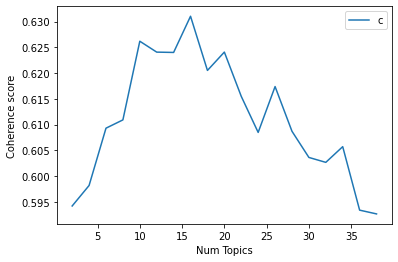

In [33]:
# Show graph
limit=40; start=2; step=2;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [34]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

Num Topics = 2  has Coherence Value of 0.5942
Num Topics = 4  has Coherence Value of 0.5982
Num Topics = 6  has Coherence Value of 0.6093
Num Topics = 8  has Coherence Value of 0.6109
Num Topics = 10  has Coherence Value of 0.6262
Num Topics = 12  has Coherence Value of 0.6241
Num Topics = 14  has Coherence Value of 0.624
Num Topics = 16  has Coherence Value of 0.631
Num Topics = 18  has Coherence Value of 0.6205
Num Topics = 20  has Coherence Value of 0.6241
Num Topics = 22  has Coherence Value of 0.6155
Num Topics = 24  has Coherence Value of 0.6085
Num Topics = 26  has Coherence Value of 0.6174
Num Topics = 28  has Coherence Value of 0.6087
Num Topics = 30  has Coherence Value of 0.6036
Num Topics = 32  has Coherence Value of 0.6027
Num Topics = 34  has Coherence Value of 0.6057
Num Topics = 36  has Coherence Value of 0.5934
Num Topics = 38  has Coherence Value of 0.5927


In [ ]:
#display topics in data frame
#https://medium.com/swlh/topic-modeling-lda-mallet-implementation-in-python-part-2-602ffb38d396
tm_results = ldamallet[corpus]

In [ ]:
topics = [[(term, round(wt, 3)) for term, wt in ldamallet.show_topic(n, topn=20)] for n in range(0, ldamallet.num_topics)]

In [ ]:
topics_df = pd.DataFrame([[term for term, wt in topic] for topic in topics], columns = ['Term'+str(i) for i in range(1, 21)], index=['Topic '+str(t) for t in range(1, ldamallet.num_topics+1)]).T
topics_df

In [34]:
# set column width
pd.set_option('display.max_colwidth', -1)
topics_df = pd.DataFrame([', '.join([term for term, wt in topic]) for topic in topics], columns = ['Terms per Topic'], index=['Topic'+str(t) for t in range(1, ldamallet.num_topics+1)] )
topics_df

<ipython-input-34-22448409583d>:2: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,Terms per Topic
Topic1,"doctor, issue, diabetic, care, problem, year, symptom, time, told, foot, pain, talk, endo, appointment, eye, hospital, hand, endocrinologist, covid, long"
Topic2,"sugar, fat, bread, rice, fruit, cheese, food, egg, cream, meat, protein, potato, amp, sweet, add, veggie, pasta, free, nut, chicken"
Topic3,"time, feel, night, feeling, thought, diagnosed, bad, today, day, felt, tested, family, sleep, hope, diagnosis, bit, friend, home, week, post"
Topic4,"diabetes, insulin, type, people, diabetic, disease, resistance, gt, risk, person, patient, fat, cell, medication, medical, study, td, pancreas, condition, control"
Topic5,"sugar, blood, high, glucose, level, body, normal, fasting, bg, number, lower, range, higher, morning, spike, drop, test, point, low, liver"
Topic6,"ac, metformin, month, weight, year, week, day, started, diagnosed, med, taking, ago, medication, effect, lost, mg, lb, doctor, lose, number"
Topic7,"carbs, eat, day, low, eating, carb, food, meal, hour, keto, number, dinner, fast, ate, spike, breakfast, calorie, lunch, time, intake"
Topic8,"diet, exercise, work, change, thing, life, lot, long, control, healthy, good, start, health, people, time, advice, walk, lifestyle, hard, important"
Topic9,"test, reading, meter, read, insurance, check, question, testing, strip, dr, libre, finger, cgm, sensor, result, monitor, post, app, information, research"
Topic10,"good, thing, great, lot, drink, pretty, water, work, love, make, hard, yeah, big, ill, bad, idea, luck, stuff, sound, bit"


In [35]:
#export list of topics
topics_df.to_csv('diabetes2020_topics.csv', index = False)

In [36]:
#https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/
#https://medium.com/swlh/topic-modeling-lda-mallet-implementation-in-python-part-2-602ffb38d396

from gensim.models.ldamodel import LdaModel

def convertldaMalletToldaGen(mallet_model):
    model_gensim = LdaModel(
        id2word=mallet_model.id2word, num_topics=mallet_model.num_topics,
        alpha=mallet_model.alpha) 
    model_gensim.state.sstats[...] = mallet_model.wordtopics
    model_gensim.sync_state()
    return model_gensim

In [37]:
ldagensim = convertldaMalletToldaGen(ldamallet)

In [38]:
import pyLDAvis.gensim as gensimvis
vis_data = gensimvis.prepare(ldagensim, corpus, id2word, sort_topics=False)
pyLDAvis.display(vis_data)

IndexError: index 10 is out of bounds for axis 0 with size 10

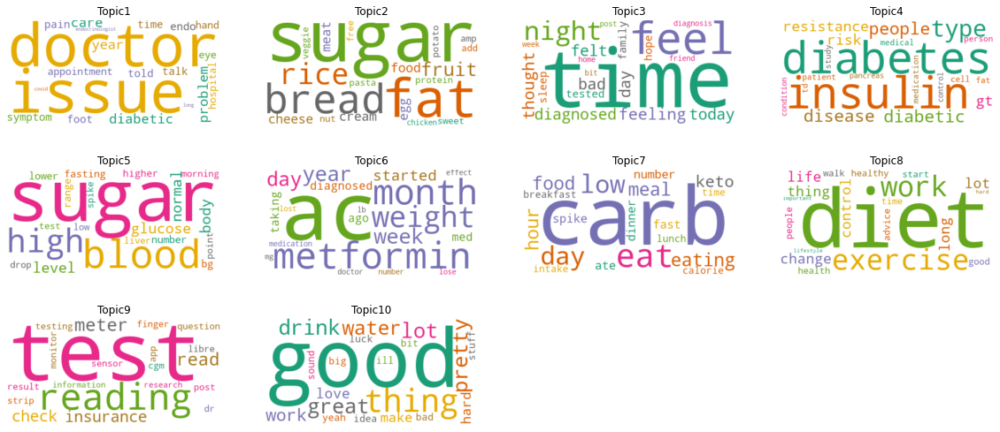

In [39]:
#word cloud
# initiate wordcloud object
wc = WordCloud(background_color="white", colormap="Dark2", max_font_size=150, random_state=42)

# set the figure size
plt.rcParams['figure.figsize'] = [20, 15]

# Create subplots for each topic
for i in range(28):

    wc.generate(text=topics_df["Terms per Topic"][i])
    
    plt.subplot(5, 4, i+1)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(topics_df.index[i])

plt.show()

In [41]:
#convert date to datetime variable
diabetes2020["Publish Date"] = pd.to_datetime(diabetes2020['Publish Date'], errors='coerce')
diabetes2020

<ipython-input-41-3b0635229166>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diabetes2020["Publish Date"] = pd.to_datetime(diabetes2020['Publish Date'], errors='coerce')


,Post ID,Author,Publish Date,Body,text_gens_nonstop,text_processed,text_tokenized,text_nlk_nonstop,text_nonstop_spacy,text_stemmed,text_lemmatized
0,eixjcz,Temptazn,2020-01-02 04:16:00,"Hi all, \n\nSorry for the long post, need some guidance.\n\nJust before Christmas I injured my right knee so bad I can't walk. So Dec 26th I visited a Family doctor where I was spending the holidays (Singapore), discussed my T2 at length and he prescribed Celecoxib and Prednisolone for my knee.\n\nThat was 10.30am, by 10pm I was drinking litres of water, peeing non-stop and couldn't test as my BG is usually so stable I left my kit at home (Hong Kong). Same on 27th Dec. When I got home on the 28th and tested, I was running about 34mmol (612mg). A bit of research and I found that Prednisolone is a steroid and they can cause BG to go haywire. Funny the Doctor never mentioned that.\n\nSo I quit the knee pills. By Monday 30th I was still seeing fasting BG of 24mmol/432mg and highs of 32/600+ later in the day.\n\nWent to my usual clinic but my doc was away. The locum didn't seem at all concerned, but increased my Metformin from 500mg X twice a day to 500mg X three times a day. (Plus panadol for the knee yay /s)\n\nAnyway, I'm still about 15/270 fasting, rising to 26/468 in the evenings, despite cutting carbs to almost zero. (I've been low carbing around 100g a day for the last year with a regular 8-10/140-150 high/low pattern).\n\nI'm weak, dizzy, have horrible headaches, thirsty all the time, peeing all the time, blurry vision and generally feel like crap. \n\nCould this be the knee injury itself causing the spikes now? Or does prednisolone linger this long? I feel like I should probably insist on an Endo referral, as the family doc just doesn't feel like is taking it seriously.\n\n&amp;#x200B;\n\nAny advice?","Hi all, Sorry long post, need guidance. Just Christmas I injured right knee bad I can't walk. So Dec 26th I visited Family doctor I spending holidays (Singapore), discussed T2 length prescribed Celecoxib Prednisolone knee. That 10.30am, 10pm I drinking litres water, peeing non-stop couldn't test BG usually stable I left kit home (Hong Kong). Same 27th Dec. When I got home 28th tested, I running 34mmol (612mg). A bit research I Prednisolone steroid cause BG haywire. Funny Doctor mentioned that. So I quit knee pills. By Monday 30th I seeing fasting BG 24mmol/432mg highs 32/600+ later day. Went usual clinic doc away. The locum didn't concerned, increased Metformin 500mg X twice day 500mg X times day. (Plus panadol knee yay /s) Anyway, I'm 15/270 fasting, rising 26/468 evenings, despite cutting carbs zero. (I've low carbing 100g day year regular 8-10/140-150 high/low pattern). I'm weak, dizzy, horrible headaches, thirsty time, peeing time, blurry vision generally feel like crap. Could knee injury causing spikes now? Or prednisolone linger long? I feel like I probably insist Endo referral, family doc doesn't feel like taking seriously. &amp;#x200B; Any advice?",hi all sorry long post need guidance just christmas i injured right knee bad i cant walk so dec th i visited family doctor i spending holidays singapore discussed t length prescribed celecoxib prednisolone knee that am pm i drinking litres water peeing nonstop couldnt test bg usually stable i left kit home hong kong same th dec when i got home th tested i running mmol mg a bit research i prednisolone steroid cause bg haywire funny doctor mentioned that so i quit knee pills by monday th i seeing fasting bg mmolmg highs later day went usual clinic doc away the locum didnt concerned increased metformin mg x twice day mg x times day plus panadol knee yay s anyway im fasting rising evenings despite cutting carbs zero ive low carbing g day year regular highlow pattern im weak dizzy horrible headaches thirsty time peeing time blurry vision generally feel like crap could knee injury causing spikes now or prednisolone linger long i feel like i probably insist endo referral family doc doesnt feel lik

In [42]:
#revalue row index
diabetes2020.index = range(55713)
diabetes2020

,Post ID,Author,Publish Date,Body,text_gens_nonstop,text_processed,text_tokenized,text_nlk_nonstop,text_nonstop_spacy,text_stemmed,text_lemmatized
0,eixjcz,Temptazn,2020-01-02 04:16:00,"Hi all, \n\nSorry for the long post, need some guidance.\n\nJust before Christmas I injured my right knee so bad I can't walk. So Dec 26th I visited a Family doctor where I was spending the holidays (Singapore), discussed my T2 at length and he prescribed Celecoxib and Prednisolone for my knee.\n\nThat was 10.30am, by 10pm I was drinking litres of water, peeing non-stop and couldn't test as my BG is usually so stable I left my kit at home (Hong Kong). Same on 27th Dec. When I got home on the 28th and tested, I was running about 34mmol (612mg). A bit of research and I found that Prednisolone is a steroid and they can cause BG to go haywire. Funny the Doctor never mentioned that.\n\nSo I quit the knee pills. By Monday 30th I was still seeing fasting BG of 24mmol/432mg and highs of 32/600+ later in the day.\n\nWent to my usual clinic but my doc was away. The locum didn't seem at all concerned, but increased my Metformin from 500mg X twice a day to 500mg X three times a day. (Plus panadol for the knee yay /s)\n\nAnyway, I'm still about 15/270 fasting, rising to 26/468 in the evenings, despite cutting carbs to almost zero. (I've been low carbing around 100g a day for the last year with a regular 8-10/140-150 high/low pattern).\n\nI'm weak, dizzy, have horrible headaches, thirsty all the time, peeing all the time, blurry vision and generally feel like crap. \n\nCould this be the knee injury itself causing the spikes now? Or does prednisolone linger this long? I feel like I should probably insist on an Endo referral, as the family doc just doesn't feel like is taking it seriously.\n\n&amp;#x200B;\n\nAny advice?","Hi all, Sorry long post, need guidance. Just Christmas I injured right knee bad I can't walk. So Dec 26th I visited Family doctor I spending holidays (Singapore), discussed T2 length prescribed Celecoxib Prednisolone knee. That 10.30am, 10pm I drinking litres water, peeing non-stop couldn't test BG usually stable I left kit home (Hong Kong). Same 27th Dec. When I got home 28th tested, I running 34mmol (612mg). A bit research I Prednisolone steroid cause BG haywire. Funny Doctor mentioned that. So I quit knee pills. By Monday 30th I seeing fasting BG 24mmol/432mg highs 32/600+ later day. Went usual clinic doc away. The locum didn't concerned, increased Metformin 500mg X twice day 500mg X times day. (Plus panadol knee yay /s) Anyway, I'm 15/270 fasting, rising 26/468 evenings, despite cutting carbs zero. (I've low carbing 100g day year regular 8-10/140-150 high/low pattern). I'm weak, dizzy, horrible headaches, thirsty time, peeing time, blurry vision generally feel like crap. Could knee injury causing spikes now? Or prednisolone linger long? I feel like I probably insist Endo referral, family doc doesn't feel like taking seriously. &amp;#x200B; Any advice?",hi all sorry long post need guidance just christmas i injured right knee bad i cant walk so dec th i visited family doctor i spending holidays singapore discussed t length prescribed celecoxib prednisolone knee that am pm i drinking litres water peeing nonstop couldnt test bg usually stable i left kit home hong kong same th dec when i got home th tested i running mmol mg a bit research i prednisolone steroid cause bg haywire funny doctor mentioned that so i quit knee pills by monday th i seeing fasting bg mmolmg highs later day went usual clinic doc away the locum didnt concerned increased metformin mg x twice day mg x times day plus panadol knee yay s anyway im fasting rising evenings despite cutting carbs zero ive low carbing g day year regular highlow pattern im weak dizzy horrible headaches thirsty time peeing time blurry vision generally feel like crap could knee injury causing spikes now or prednisolone linger long i feel like i probably insist endo referral family doc doesnt feel lik

In [43]:
#find weight of each topic per row
#https://medium.com/swlh/topic-modeling-lda-mallet-implementation-in-python-part-3-ab03e01b7cd7
topic_weights2020 = pd.DataFrame.from_records([{v: k for v, k in row} for row in tm_results])
topic_weights2020.columns = ['Topic ' + str(i) for i in range(1,11)]
topic_weights2020

,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10
0,0.266800,0.033932,0.184963,0.033932,0.095808,0.117764,0.096474,0.043912,0.061876,0.064538
1,0.125604,0.072464,0.101449,0.133655,0.112721,0.104670,0.074074,0.095008,0.093398,0.086957
2,0.244709,0.064815,0.091270,0.074074,0.185185,0.078042,0.060847,0.062169,0.062169,0.076720
3,0.100000,0.085185,0.090741,0.100000,0.138889,0.118519,0.090741,0.090741,0.092593,0.092593
4,0.240310,0.065891,0.117571,0.089147,0.112403,0.090439,0.062016,0.083979,0.064599,0.073643
...,...,...,...,...,...,...,...,...,...,...
55708,0.094340,0.094340,0.094340,0.119497,0.106918,0.104822,0.094340,0.102725,0.094340,0.094340
55709,0.089286,0.091270,0.093254,0.089286,0.111111,0.126984,0.126984,0.091270,0.091270,0.089286
55710,0.122507,0.064103,0.180912,0.089744,0.085470,0.141026,0.071225,0.098291,0.064103,0.082621
55711,0.082942,0.070423,0.140845,0.078247,0.073552,0.173709,0.126761,0.100156,0.082942,0.070423


In [44]:
#find topics per month / year
#topic_weights2018['month'] = diabetes2018["Publish Date"].dt.month
#topic_weights2018['year'] = diabetes2018["Publish Date"].dt.year
topic_weights2020['month_year'] = pd.to_datetime(diabetes2020['Publish Date']).dt.to_period('M')
topic_weights2020

,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10,month_year
0,0.266800,0.033932,0.184963,0.033932,0.095808,0.117764,0.096474,0.043912,0.061876,0.064538,2020-01
1,0.125604,0.072464,0.101449,0.133655,0.112721,0.104670,0.074074,0.095008,0.093398,0.086957,2020-01
2,0.244709,0.064815,0.091270,0.074074,0.185185,0.078042,0.060847,0.062169,0.062169,0.076720,2020-01
3,0.100000,0.085185,0.090741,0.100000,0.138889,0.118519,0.090741,0.090741,0.092593,0.092593,2020-01
4,0.240310,0.065891,0.117571,0.089147,0.112403,0.090439,0.062016,0.083979,0.064599,0.073643,2020-01
...,...,...,...,...,...,...,...,...,...,...,...
55708,0.094340,0.094340,0.094340,0.119497,0.106918,0.104822,0.094340,0.102725,0.094340,0.094340,2021-02
55709,0.089286,0.091270,0.093254,0.089286,0.111111,0.126984,0.126984,0.091270,0.091270,0.089286,2021-02
55710,0.122507,0.064103,0.180912,0.089744,0.085470,0.141026,0.071225,0.098291,0.064103,0.082621,2021-02
55711,0.082942,0.070423,0.140845,0.078247,0.073552,0.173709,0.126761,0.100156,0.082942,0.070423,2021-02


In [45]:
#find dominant topic of the record
topic_weights2020['Dominant'] = topic_weights2020.drop('month_year', axis=1).idxmax(axis=1)
topic_weights2020

,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10,month_year,Dominant
0,0.266800,0.033932,0.184963,0.033932,0.095808,0.117764,0.096474,0.043912,0.061876,0.064538,2020-01,Topic 1
1,0.125604,0.072464,0.101449,0.133655,0.112721,0.104670,0.074074,0.095008,0.093398,0.086957,2020-01,Topic 4
2,0.244709,0.064815,0.091270,0.074074,0.185185,0.078042,0.060847,0.062169,0.062169,0.076720,2020-01,Topic 1
3,0.100000,0.085185,0.090741,0.100000,0.138889,0.118519,0.090741,0.090741,0.092593,0.092593,2020-01,Topic 5
4,0.240310,0.065891,0.117571,0.089147,0.112403,0.090439,0.062016,0.083979,0.064599,0.073643,2020-01,Topic 1
...,...,...,...,...,...,...,...,...,...,...,...,...
55708,0.094340,0.094340,0.094340,0.119497,0.106918,0.104822,0.094340,0.102725,0.094340,0.094340,2021-02,Topic 4
55709,0.089286,0.091270,0.093254,0.089286,0.111111,0.126984,0.126984,0.091270,0.091270,0.089286,2021-02,Topic 6
55710,0.122507,0.064103,0.180912,0.089744,0.085470,0.141026,0.071225,0.098291,0.064103,0.082621,2021-02,Topic 3
55711,0.082942,0.070423,0.140845,0.078247,0.073552,0.173709,0.126761,0.100156,0.082942,0.070423,2021-02,Topic 6


In [46]:
#extract topic weighting
topic_weights2020.to_csv('topic_weight2020.csv', index = False)

In [47]:
#percentage of dominant topics per a month
topic_dominant2020 = topic_weights2020.groupby('month_year')['Dominant'].value_counts(normalize=True).unstack()
topic_dominant2020

Dominant,Topic 1,Topic 10,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9
month_year,,,,,,,,,,
2020-01,0.110195,0.114317,0.089035,0.088761,0.098928,0.072273,0.127782,0.091783,0.088211,0.118714
2020-02,0.114577,0.106779,0.122975,0.096881,0.089982,0.082184,0.092681,0.083383,0.069586,0.140972
2020-03,0.128320,0.096320,0.157440,0.104320,0.090560,0.074880,0.095680,0.082240,0.073920,0.096320
2020-04,0.112387,0.108972,0.145917,0.079168,0.112387,0.085688,0.077926,0.094070,0.072959,0.110525
2020-05,0.126874,0.108708,0.106113,0.094867,0.079296,0.081603,0.108997,0.074106,0.072088,0.147347
2020-06,0.115123,0.099163,0.111460,0.086604,0.114600,0.083464,0.098116,0.092883,0.070120,0.128467
2020-07,0.122119,0.111329,0.085336,0.095635,0.100294,0.089995,0.117214,0.085091,0.070623,0.122364
2020-08,0.107958,0.098088,0.159778,0.085544,0.081226,0.092330,0.101378,0.083282,0.068888,0.121530
2020-09,0.109583,0.113251,0.121962,0.088950,0.091472,0.086657,0.104310,0.090326,0.076570,0.116919


In [48]:
#dominant topic by year
topic_dominant2020['Dominant'] = topic_dominant2020.idxmax(axis=1)
topic_dominant2020

Dominant,Topic 1,Topic 10,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Dominant
month_year,,,,,,,,,,,
2020-01,0.110195,0.114317,0.089035,0.088761,0.098928,0.072273,0.127782,0.091783,0.088211,0.118714,Topic 6
2020-02,0.114577,0.106779,0.122975,0.096881,0.089982,0.082184,0.092681,0.083383,0.069586,0.140972,Topic 9
2020-03,0.128320,0.096320,0.157440,0.104320,0.090560,0.074880,0.095680,0.082240,0.073920,0.096320,Topic 2
2020-04,0.112387,0.108972,0.145917,0.079168,0.112387,0.085688,0.077926,0.094070,0.072959,0.110525,Topic 2
2020-05,0.126874,0.108708,0.106113,0.094867,0.079296,0.081603,0.108997,0.074106,0.072088,0.147347,Topic 9
2020-06,0.115123,0.099163,0.111460,0.086604,0.114600,0.083464,0.098116,0.092883,0.070120,0.128467,Topic 9
2020-07,0.122119,0.111329,0.085336,0.095635,0.100294,0.089995,0.117214,0.085091,0.070623,0.122364,Topic 9
2020-08,0.107958,0.098088,0.159778,0.085544,0.081226,0.092330,0.101378,0.083282,0.068888,0.121530,Topic 2
2020-09,0.109583,0.113251,0.121962,0.088950,0.091472,0.086657,0.104310,0.090326,0.076570,0.116919,Topic 2


In [49]:
topic_dominant2020.to_csv('topic_dominant2020.csv', index = False)

In [50]:
#merge dataframes together
diabetes2020['Dominant'] = topic_weights2020['Dominant']
diabetes2020['month_year'] = topic_weights2020['month_year']
diabetes2020.tail()

<ipython-input-50-6ec433b2eaeb>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diabetes2020['Dominant'] = topic_weights2020['Dominant']
<ipython-input-50-6ec433b2eaeb>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diabetes2020['month_year'] = topic_weights2020['month_year']


,Post ID,Author,Publish Date,Body,text_gens_nonstop,text_processed,text_tokenized,text_nlk_nonstop,text_nonstop_spacy,text_stemmed,text_lemmatized,Dominant,month_year
55708,goxee5q,satxlonghorn1,2021-02-26 18:26:00,"I didn't have any side effects, just fyi. Some people don't.","I didn't effects, fyi. Some people don't.",i didnt effects fyi some people dont,"[i, didnt, effects, fyi, some, people, dont]","[effects, fyi, people]","[effects, fyi, people]","[effect, fyi, peopl]","[effect, fyi, people]",Topic 4,2021-02
55709,goxfko5,AccidentalDragon,2021-02-26 18:36:00,Fasting brought my numbers was down from where they were! I do keto omad and came down from 160-200s to 85-120 in a month.,Fasting brought numbers were! I keto omad came 160-200s 85-120 month.,fasting brought numbers were i keto omad came s month,"[fasting, brought, numbers, were, i, keto, omad, came, s, month]","[fasting, brought, numbers, keto, omad, came, month]","[fasting, brought, numbers, keto, omad, came, month]","[fast, brought, number, keto, omad, came, month]","[fasting, brought, number, keto, omad, came, month]",Topic 6,2021-02
55710,lthxwe,Wackydetective,2021-02-26 22:17:00,"I've been battling depression and anxiety like so many of us are living in end times. I was so apprehensive about getting my blood work because I've been slacking. Apparently not.\n\nI almost choked when my Doctor told me my A1C and let out a loud ""whaaaat?"" She was so pleased and said she hasn't seen that number from her patients in a while. \n\nIt improved my mood significantly. I am hoping to get off insulin and this is the push to do it. Wish me luck.","I've battling depression anxiety like living end times. I apprehensive getting blood work I've slacking. Apparently not. I choked Doctor told A1C let loud ""whaaaat?"" She pleased said hasn't seen number patients while. It improved mood significantly. I hoping insulin push it. Wish luck.",ive battling depression anxiety like living end times i apprehensive getting blood work ive slacking apparently not i choked doctor told ac let loud whaaaat she pleased said hasnt seen number patients while it improved mood significantly i hoping insulin push it wish luck,"[ive, battling, depression, anxiety, like, living, end, times, i, apprehensive, getting, blood, work, ive, slacking, apparently, not, i, choked, doctor, told, ac, let, loud, whaaaat, she, pleased, said, hasnt, seen, number, patients, while, it, improved, mood, significantly, i, hoping, insulin, push, it, wish, luck]","[battling, depression, anxiety, living, end, times, apprehensive, getting, blood, work, slacking, apparently, choked, doctor, told, ac, let, loud, whaaaat, pleased, said, hasnt, seen, number, patients, improved, mood, significantly, hoping, insulin, push, wish, luck]","[battling, depression, anxiety, living, end, times, apprehensive, getting, blood, work, slacking, apparently, choked, doctor, told, ac, let, loud, whaaaat, pleased, said, hasnt, seen, number, patients, improved, mood, significantly, hoping, insulin, push, wish, luck]","[battl, depress, anxieti, live, end, time, apprehens, get, blood, work, slack, appar, choke, doctor, told, ac, let, loud, whaaaat, pleas, said, hasnt, seen, number, patient, improv, mood, significantli, hope, insulin, push, wish, luck]","[battling, depression, anxiety, living, end, time, apprehensive, getting, blood, work, slacking, apparently, choked, doctor, told, ac, let, loud, whaaaat, pleased, said, hasnt, seen, number, patient, improved, mood, significantly, hoping, insulin, push, wish, luck]",Topic 3,2021-02
55711,lu13pm,Nervous_Finger1486,2021-02-27 16:27:00,So it’s been a week since I was diagnosed. Metformin 1000mg twice a day. BS has been below 200 last few days. Problem is that everything I eat is literally going right through me! I’m weak and don’t feel like doing anything (Usually fairly active). Question is does this ever go away while taking this stupid pill! I’ve gotten to the point that I don’t want to eat because th

In [51]:
#export dataframe
diabetes2020.to_csv('diabetes2020_lda.csv', index = False)